In [1]:
import pandas
import numpy
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy import signal

# Funciones:

In [2]:
def mysarimax(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [3]:
def mysarima(Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [4]:
def mysarimax2(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12),restriccion={}):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:1000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:1000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:300].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:300].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [5]:
def mysarima2(Y,order=(0,0,0),trend='c',restriccion={},seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False,
                                    seasonal_order=seasonal_order)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=80, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=80, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

A continuación, se construyen funciones para validar con datos fuera del periodo de ajuste los modelos SARIMAX con distintas configuraciones.

In [6]:
def predecir_1(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])

In [7]:
def predecir_2(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])

In [8]:
def predecir_3(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

In [9]:
def predecir_4(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

# Ejecución:

In [10]:
Matriz=pandas.read_csv('Maquehue_ufro.csv',sep='|')
Matriz

,Unnamed: 0,momento,rrInst,rr6Horas,rr24Horas,hr,p0,qfe1,qff,qnh,...,td,tMin12Horas,tMax12Horas,Anno,Mes,Dia,Hora,Minuto,Hora_Min_t,Hora_Max_t
0,0,2018-01-01 00:00:00,0.0,0.0,0.0,69.3,1010.2,1010.3,1019.2,1019.2,...,8.9,11.6,21.1,2018,1,1,0,0,12,18
1,1,2018-01-01 00:01:00,0.0,0.0,0.0,69.2,1010.2,1010.5,1019.5,1019.4,...,8.8,11.6,21.1,2018,1,1,0,1,12,18
2,2,2018-01-01 00:02:00,0.0,0.0,0.0,69.9,1010.2,1010.5,1019.4,1019.4,...,8.9,11.6,21.1,2018,1,1,0,2,12,18
3,3,2018-01-01 00:03:00,0.0,0.0,0.0,70.4,1010.4,1010.6,1019.5,1019.5,...,8.9,11.6,21.1,2018,1,1,0,3,12,18
4,4,2018-01-01 00:04:00,0.0,0.0,0.0,70.0,1010.4,1010.5,1019.4,1019.4,...,8.9,11.6,21.1,2018,1,1,0,4,12,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1019660,1051321,2019-12-31 23:56:00,0.0,0.0,0.0,68.7,1004.0,1004.1,1012.9,1013.0,...,12.1,6.1,17.6,2019,12,31,23,56,8,0
1019661,1051322,2019-12-31 23:57:00,0.0,0.0,0.0,68.3,1004.1,1004.3,1013.0,1013.1,...,12.0,6.1,17.6,2019,12,31,23,57,8,0
1019662,1051323,2019-12-31 23:58:00,0.0,0.0,0.0,67.9,1004.0,1004.2,1013.0,1013.0,...,11.9,6.1,17.6,2019,12,31,23,58,8,0
1019663,1051324,2019-12-31 23:59:00,0.0,0.0,0.0,68.0,1004.0,1004.2,1013.0,1013.0,...,11.9,6.1,17.6,2019,12,31,23,59,8,0


In [11]:
Matriz_Resultados=Matriz.loc[:,'ts']

In [12]:
Matriz_Informacion_general=Matriz.loc[:,['rr6Horas','rr24Horas','radiacionGlobalAcumulada24Horas',
                                  'tMin12Horas','tMax12Horas','Mes','Dia','Hora','Minuto','Hora_Min_t','Hora_Max_t']]

In [13]:
Matriz_Informacion_general['Sen_hora']=numpy.sin(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Cos_hora']=numpy.cos(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Sen_Mes']=numpy.sin((Matriz['Mes']-1)*2*numpy.pi/12)
Matriz_Informacion_general['Cos_Mes']=numpy.cos((Matriz['Mes']-1)*2*numpy.pi/12)

In [14]:
Intervalo=40#cada cuantos minutos consideramos valor

In [15]:
Matriz_Informacion_general=Matriz_Informacion_general.loc[range(0,len(Matriz_Resultados),Intervalo),:].reset_index().drop('index',axis=1)
Matriz_Resultados=Matriz_Resultados.loc[range(0,len(Matriz_Resultados),Intervalo)].reset_index().drop('index',axis=1)

In [16]:
IG=pandas.DataFrame()
IG['rr6Horas']=1*(Matriz_Informacion_general['rr6Horas'])
IG['rr24Horas']=1*(Matriz_Informacion_general['rr24Horas'])
IG['radiacionGlobalAcumulada24Horas']=1*(Matriz_Informacion_general['radiacionGlobalAcumulada24Horas'])
IG['tMin12Horas']=1*(Matriz_Informacion_general['tMin12Horas'])
IG['tMax12Horas']=1*(Matriz_Informacion_general['tMax12Horas'])
IG['Hora_Min_t']=1*(Matriz_Informacion_general['Hora_Min_t'])
IG['Hora_Max_t']=1*(Matriz_Informacion_general['Hora_Max_t'])
IG['Sen_hora']=1*(Matriz_Informacion_general['Sen_hora'])
IG['Cos_hora']=1*(Matriz_Informacion_general['Cos_hora'])
IG['Sen_Mes']=1*(Matriz_Informacion_general['Sen_Mes'])
IG['Cos_Mes']=1*(Matriz_Informacion_general['Cos_Mes'])
IG['avg_Day']=1*((Matriz_Informacion_general['tMin12Horas']+Matriz_Informacion_general['tMax12Horas'])/2)

In [17]:
for col in IG.columns:
    IG[col]=(IG[col]-IG[col].mean())/IG[col].std()

In [18]:
limite=round(len(IG)*0.7)
limite

17844

In [19]:
IG_Ajuste=IG.iloc[0:limite]
IG_Ajuste

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
0,-0.230323,-0.324225,1.909330,1.071757,1.048509,0.245029,0.894930,0.000333,1.413104,-0.012798,1.465379,1.155212
1,-0.230323,-0.324225,1.909330,1.071757,1.048509,0.245029,0.894930,0.246006,1.391628,-0.012798,1.465379,1.155212
2,-0.230323,-0.324225,1.909330,1.071757,1.048509,0.245029,0.894930,0.484215,1.327854,-0.012798,1.465379,1.155212
3,-0.230323,-0.324225,1.909330,1.071757,1.048509,0.245029,0.894930,0.707722,1.223718,-0.012798,1.465379,1.155212
4,-0.230323,-0.324225,1.909330,1.071757,1.048509,0.245029,0.894930,0.909734,1.082386,-0.012798,1.465379,1.155212
...,...,...,...,...,...,...,...,...,...,...,...,...
17839,-0.230323,-0.324225,-1.033879,-1.154464,-1.875497,-1.301133,-1.106084,-0.986886,1.012070,1.204679,-0.670677,-1.702815
17840,-0.230323,-0.324225,-1.033879,-1.154464,-1.875497,-1.301133,-1.106084,-0.795912,1.167972,1.204679,-0.670677,-1.702815
17841,-0.230323,-0.324225,-1.033879,-1.154464,-1.875497,-1.301133,-1.106084,-0.580744,1.288371,1.204679,-0.670677,-1.702815
17842,-0.230323,-0.324225,-1.033879,-1.154464,-1.875497,-1.301133,-1.106084,-0.347920,1.369609,1.204679,-0.670677,-1.702815


In [20]:
IG_Test=IG.iloc[limite:]
IG_Test

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
17844,-0.230323,-0.324225,-0.906613,-1.154464,-0.490441,0.245029,0.783763,0.142076,1.405992,1.204679,-0.670677,-0.851712
17845,-0.230323,-0.324225,-0.906613,-1.154464,-0.490441,0.245029,0.783763,0.384361,1.360031,1.204679,-0.670677,-0.851712
17846,-0.230323,-0.324225,-0.906613,-1.154464,-0.490441,0.245029,0.783763,0.614976,1.272732,1.204679,-0.670677,-0.851712
17847,-0.230323,-0.324225,-0.906613,-1.154464,-0.490441,0.245029,0.783763,0.826916,1.146746,1.204679,-0.670677,-0.851712
17848,-0.230323,-0.324225,-0.906613,-1.154464,-0.490441,0.245029,0.783763,1.013741,0.985902,1.204679,-0.670677,-0.851712
...,...,...,...,...,...,...,...,...,...,...,...,...
25487,-0.230323,-0.324225,1.717700,-0.140542,0.450028,-0.638492,-1.106084,-1.017374,0.981475,-0.715708,1.274594,0.209541
25488,-0.230323,-0.324225,1.717700,-0.140542,0.450028,-0.638492,-1.106084,-0.831253,1.143132,-0.715708,1.274594,0.209541
25489,-0.230323,-0.324225,1.717700,-0.140542,0.450028,-0.638492,-1.106084,-0.619865,1.270040,-0.715708,1.274594,0.209541
25490,-0.230323,-0.324225,1.717700,-0.140542,0.450028,-0.638492,-1.106084,-0.389633,1.358344,-0.715708,1.274594,0.209541


In [21]:
Y_Ajuste=Matriz_Resultados['ts'].iloc[0:limite]
Y_Ajuste

0        14.5
1        13.0
2        11.1
3        10.8
4         9.9
         ... 
17839     9.5
17840     7.9
17841     6.9
17842     6.1
17843     5.9
Name: ts, Length: 17844, dtype: float64

In [22]:
Y_Test=Matriz_Resultados['ts'].iloc[limite:]
Y_Test

17844     5.4
17845     5.3
17846     5.4
17847     5.9
17848     4.4
         ... 
25487    23.4
25488    23.7
25489    23.1
25490    20.4
25491    18.7
Name: ts, Length: 7648, dtype: float64

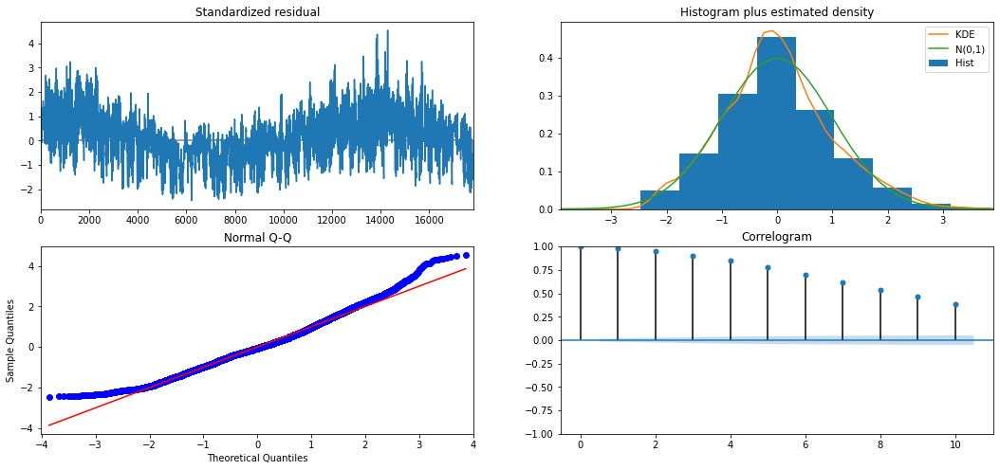

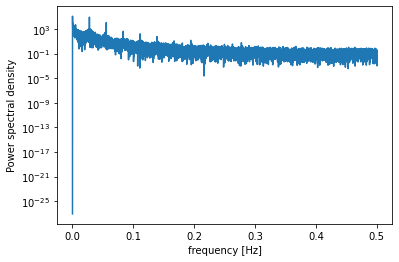

         freq            pow         delay
1    0.000056  123536.895513  17844.000000
496  0.027796   87843.768370     35.975806
495  0.027740   70491.997097     36.048485
2    0.000112   43840.908101   8922.000000
497  0.027852   33669.394773     35.903421
494  0.027684   32673.366763     36.121457
3    0.000168   17399.146457   5948.000000
991  0.055537   11703.706154     18.006054
493  0.027628   10360.489677     36.194726
12   0.000672    8676.800782   1487.000000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:                        SARIMAX   Log Likelihood              -57559.484
Date:                Wed, 07 Oct 2020   AIC                         115122.969
Time:                        15:23:10   BIC                         115138.547
Sample:                             0   HQIC                        115128.094
                              - 17844                

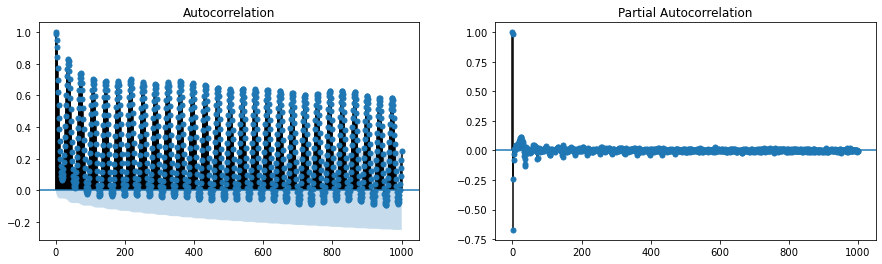

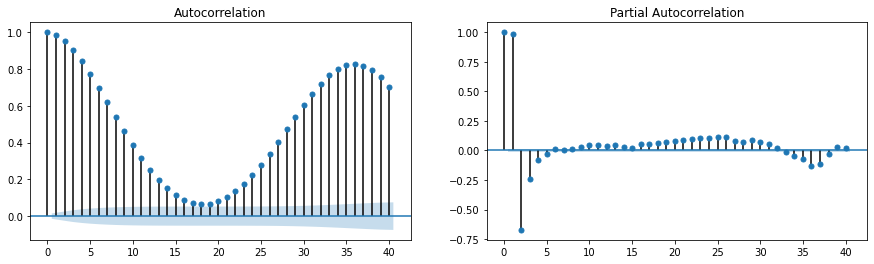

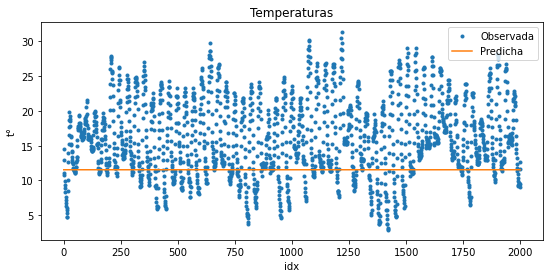

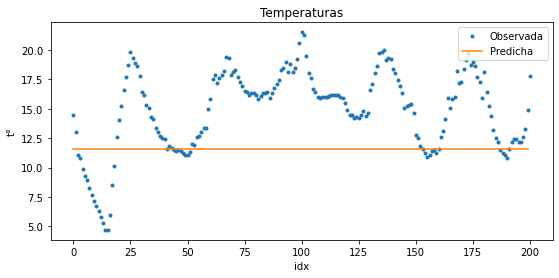

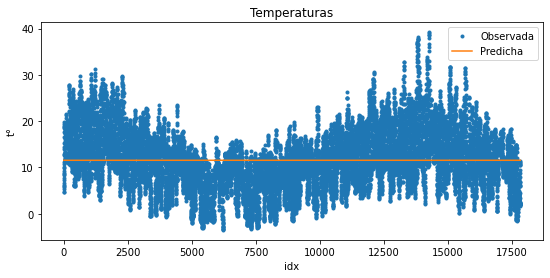

In [21]:
mysarima(Y=Y_Ajuste)

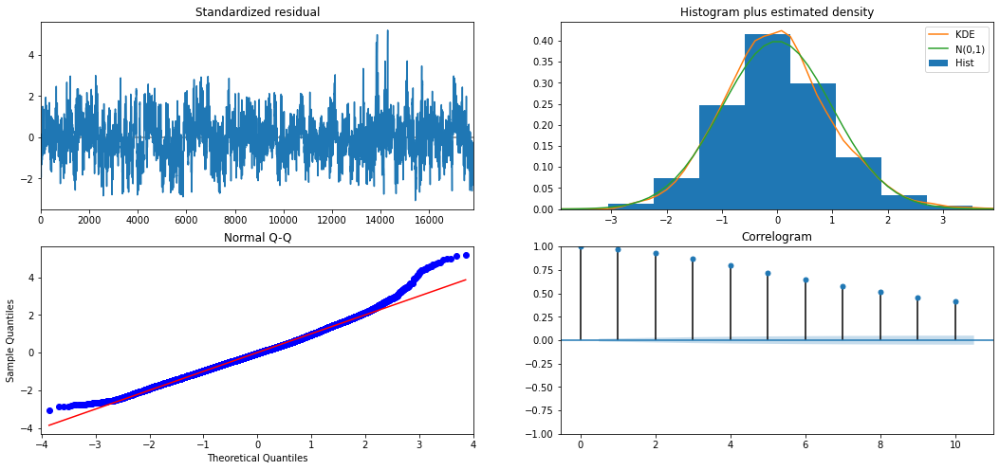

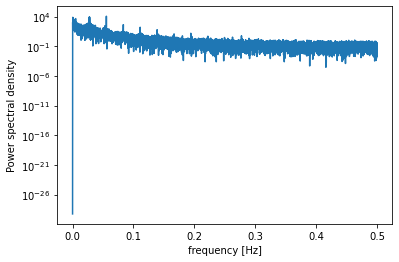

         freq           pow        delay
991  0.055537  11614.796867    18.006054
494  0.027684   9244.482955    36.121457
497  0.027852   7776.228561    35.903421
7    0.000392   7611.102414  2549.142857
12   0.000672   5612.302436  1487.000000
17   0.000953   5560.429923  1049.647059
89   0.004988   4717.084739   200.494382
63   0.003531   3195.530825   283.238095
10   0.000560   3097.668939  1784.400000
65   0.003643   3033.973969   274.523077
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:                        SARIMAX   Log Likelihood              -48636.327
Date:                Wed, 07 Oct 2020   AIC                          97284.653
Time:                        15:23:24   BIC                          97331.390
Sample:                             0   HQIC                         97300.029
                              - 17844                                      

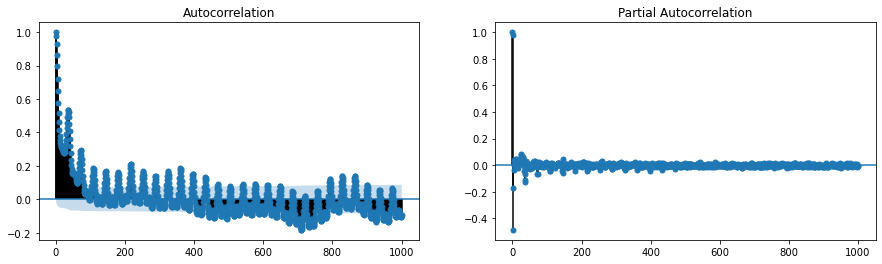

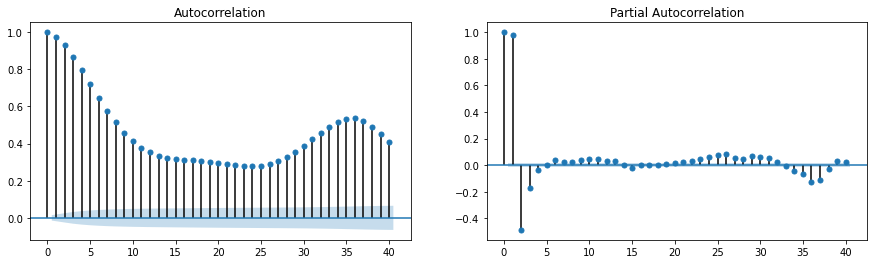

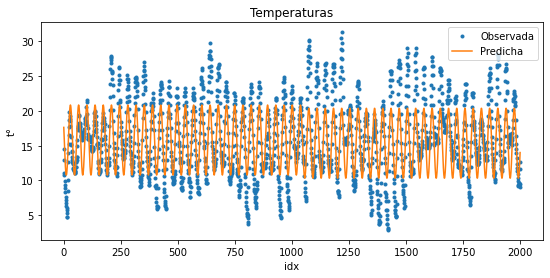

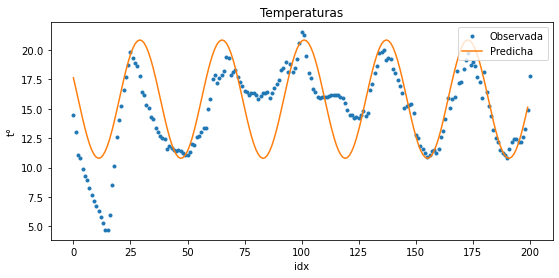

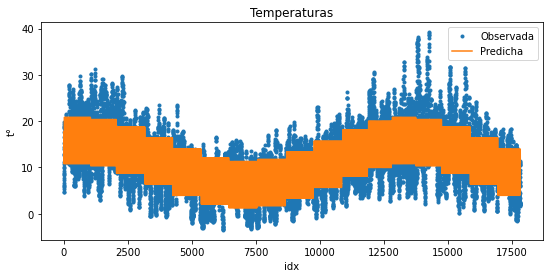

In [22]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [23]:
#Estacionalidad:

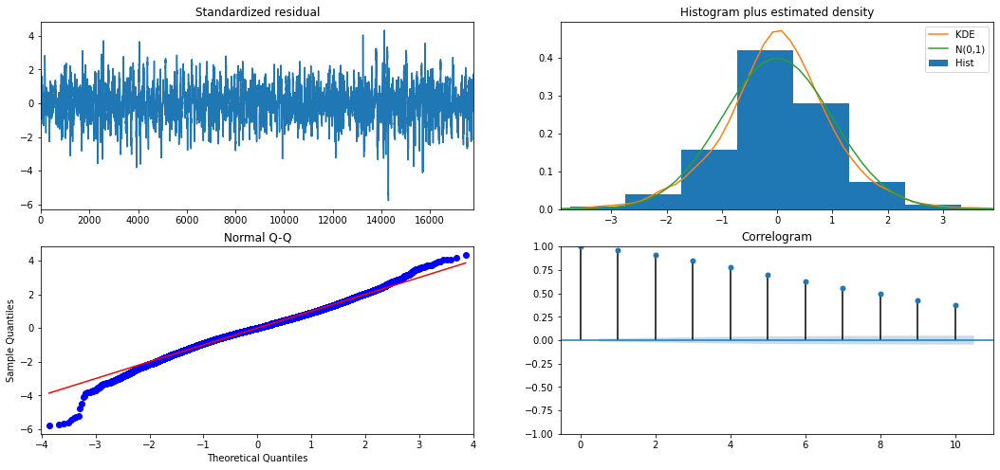

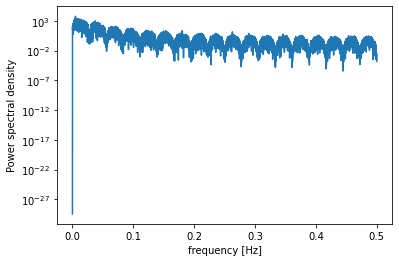

         freq          pow       delay
89   0.004988  6061.166501  200.494382
159  0.008911  2471.953634  112.226415
184  0.010312  2310.481206   96.978261
164  0.009191  2259.634531  108.804878
106  0.005940  2253.557849  168.339623
65   0.003643  2128.354264  274.523077
108  0.006052  1990.995995  165.222222
63   0.003531  1775.853768  283.238095
250  0.014010  1773.652004   71.376000
245  0.013730  1771.601569   72.832653
                                SARIMAX Results                                 
Dep. Variable:                       ts   No. Observations:                17844
Model:             SARIMAX(0, 1, 0, 36)   Log Likelihood              -47637.134
Date:                  Wed, 07 Oct 2020   AIC                          95286.268
Time:                          15:26:32   BIC                          95332.992
Sample:                               0   HQIC                         95301.641
                                - 17844                                         
Cova

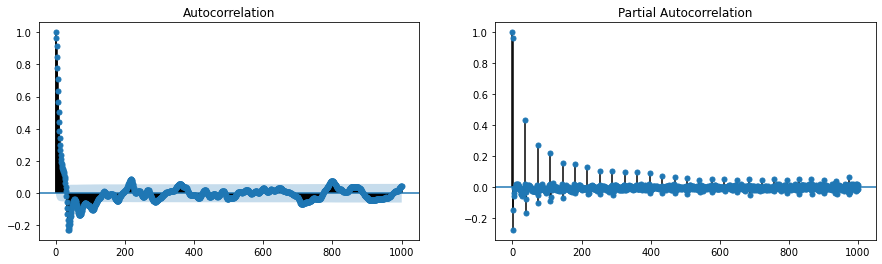

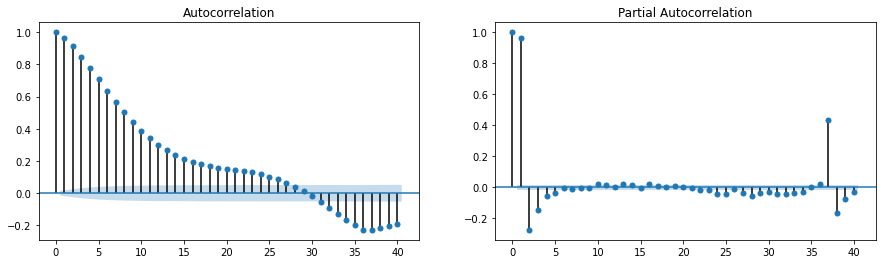

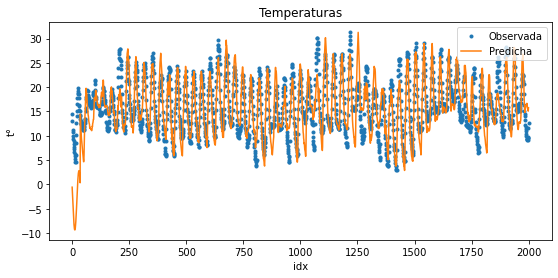

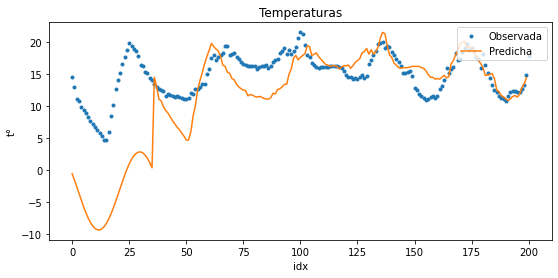

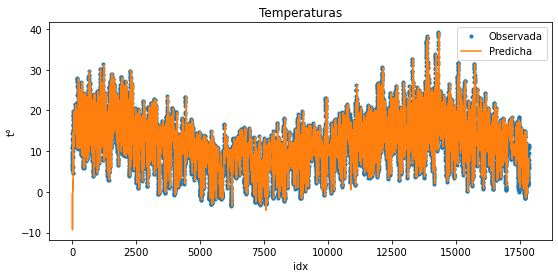

In [28]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

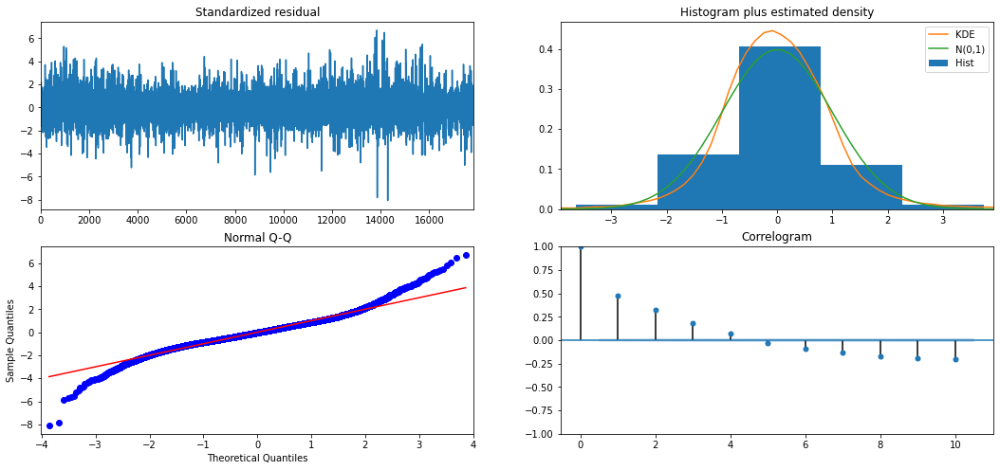

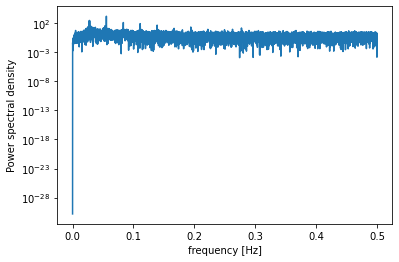

          freq          pow      delay
991   0.055537  1400.992708  18.006054
494   0.027684   268.366874  36.121457
497   0.027852   234.658161  35.903421
990   0.055481   196.874363  18.024242
1488  0.083389   117.271098  11.991935
1982  0.111074    76.147353   9.003027
1981  0.111018    72.883030   9.007572
495   0.027740    51.284917  36.048485
2479  0.138926    41.444252   7.198064
992   0.055593    32.798534  17.987903
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -21553.872
Date:                Wed, 07 Oct 2020   AIC                          43119.744
Time:                        15:23:56   BIC                          43166.480
Sample:                             0   HQIC                         43135.120
                              - 17844                                         
Covariance Type:  

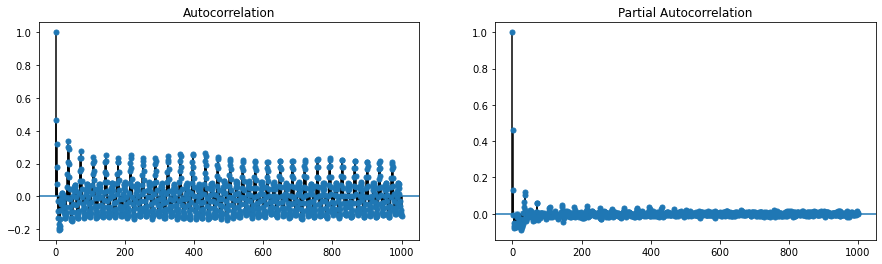

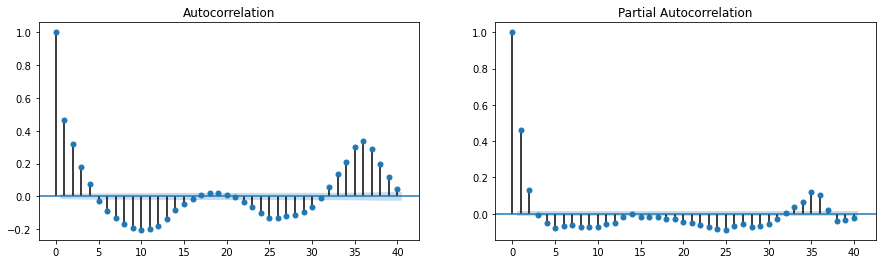

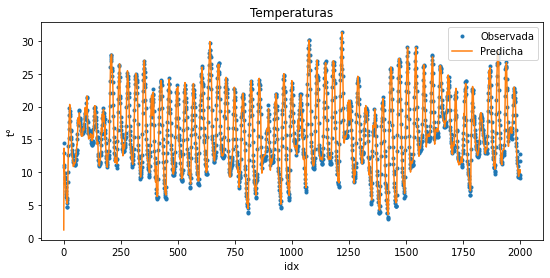

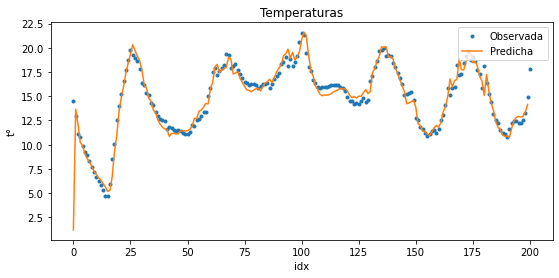

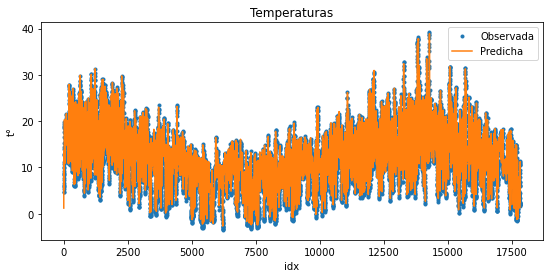

In [25]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [ ]:
#AR o MA 1

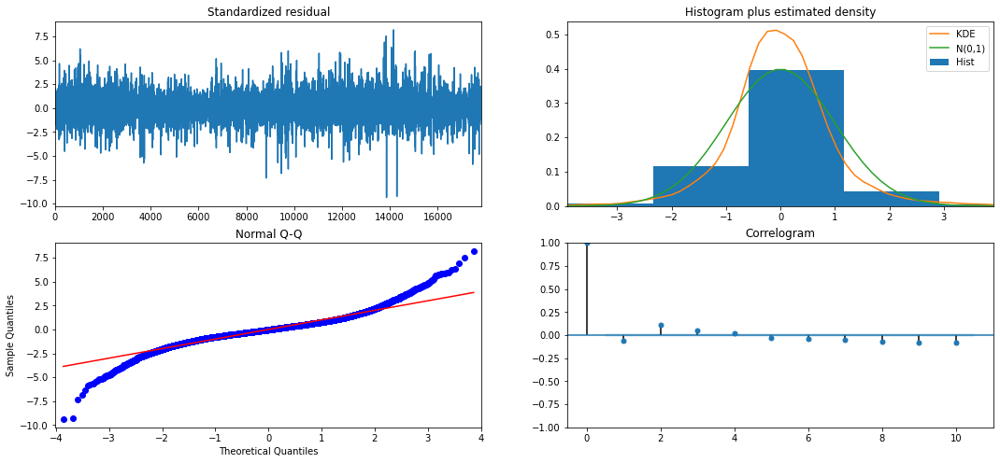

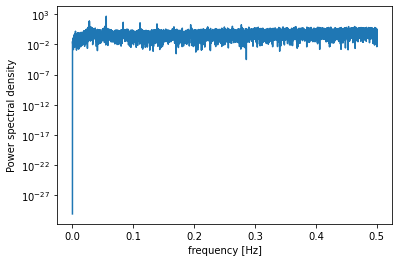

          freq         pow      delay
991   0.055537  470.760682  18.006054
494   0.027684   74.922487  36.121457
497   0.027852   68.895208  35.903421
990   0.055481   66.658617  18.024242
1488  0.083389   46.896722  11.991935
1982  0.111074   38.626794   9.003027
1981  0.111018   37.050970   9.007572
2479  0.138926   25.071226   7.198064
2475  0.138702   19.746714   7.209697
495   0.027740   19.068318  36.048485
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -19309.966
Date:                Wed, 07 Oct 2020   AIC                          38633.931
Time:                        15:25:43   BIC                          38688.457
Sample:                             0   HQIC                         38651.869
                              - 17844                                         
Covariance Type:             

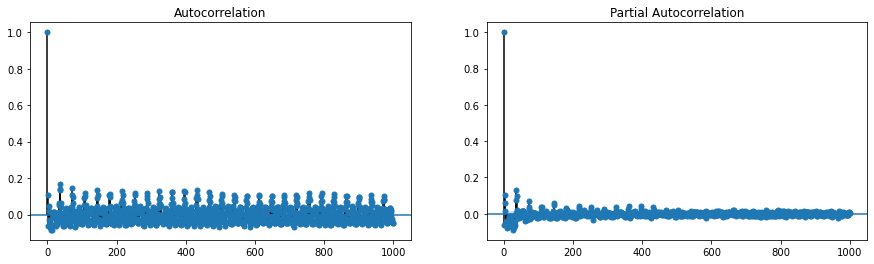

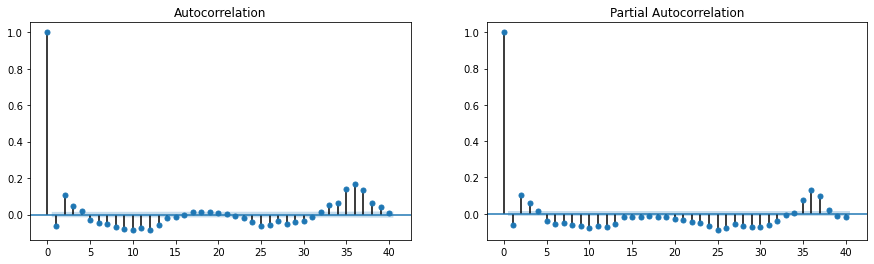

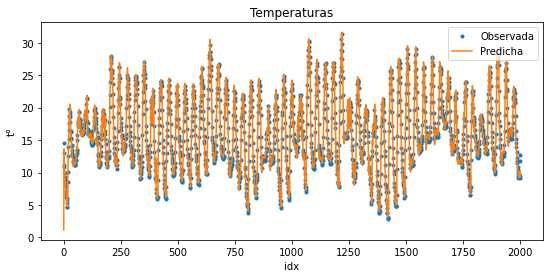

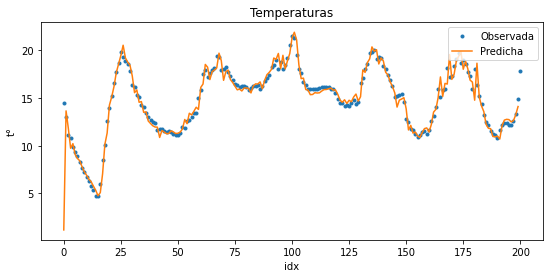

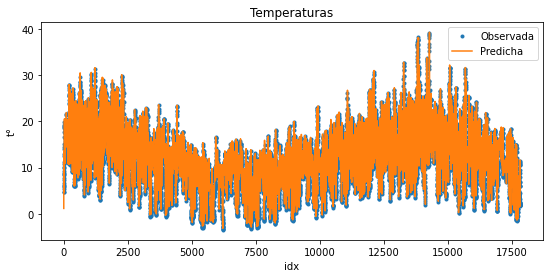

In [26]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

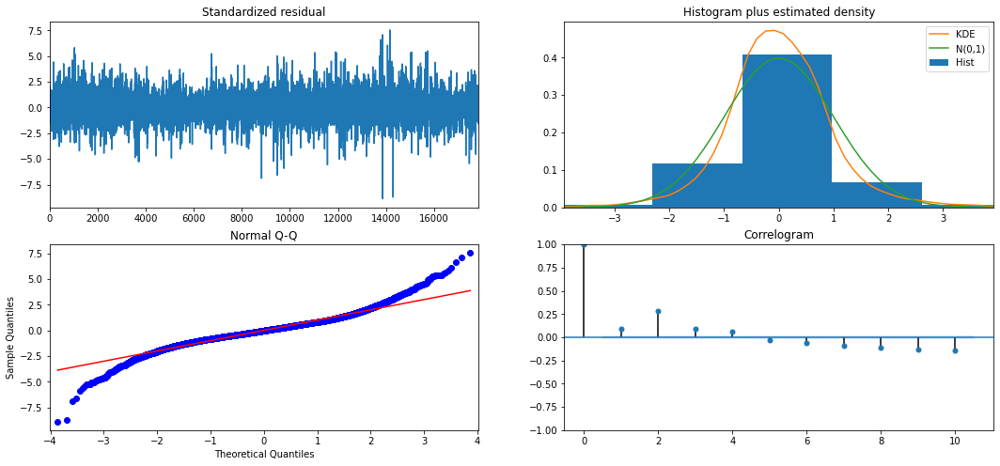

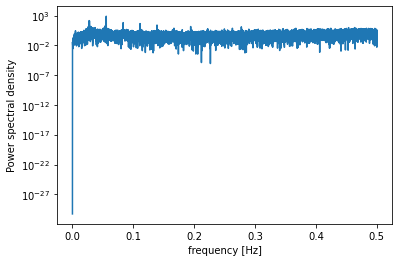

          freq         pow      delay
991   0.055537  780.851779  18.006054
494   0.027684  144.677698  36.121457
497   0.027852  128.733015  35.903421
990   0.055481  109.857932  18.024242
1488  0.083389   67.079907  11.991935
1982  0.111074   45.779549   9.003027
1981  0.111018   43.961354   9.007572
495   0.027740   30.547794  36.048485
2479  0.138926   25.913179   7.198064
2475  0.138702   20.038751   7.209697
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -19981.714
Date:                Wed, 07 Oct 2020   AIC                          39977.428
Time:                        15:26:06   BIC                          40031.954
Sample:                             0   HQIC                         39995.367
                              - 17844                                         
Covariance Type:             

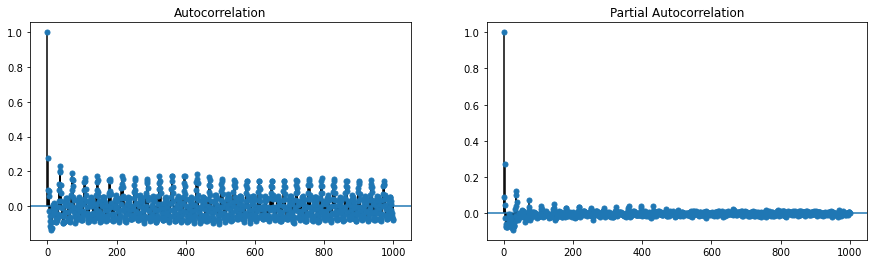

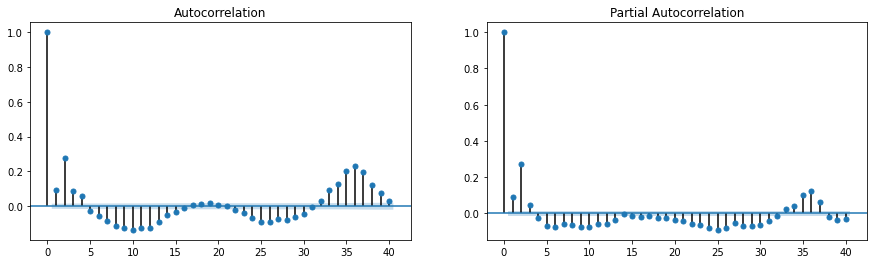

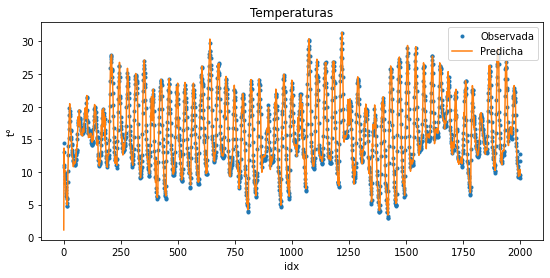

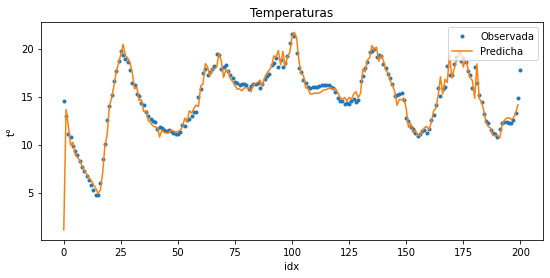

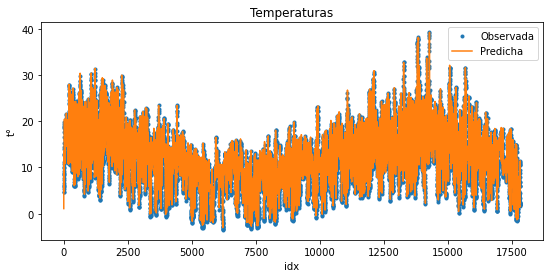

In [27]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

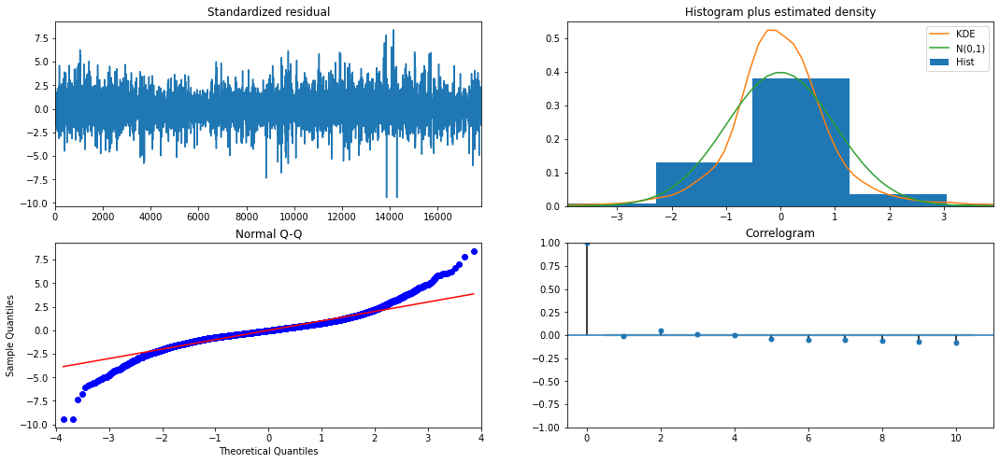

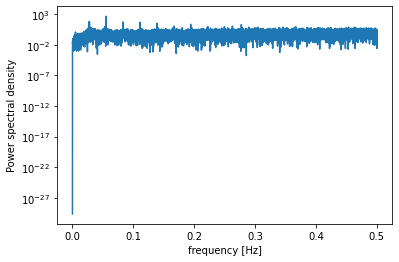

          freq         pow      delay
991   0.055537  452.971714  18.006054
990   0.055481   64.327499  18.024242
494   0.027684   60.133349  36.121457
497   0.027852   55.984415  35.903421
1488  0.083389   51.855855  11.991935
1982  0.111074   46.680693   9.003027
1981  0.111018   44.509580   9.007572
2479  0.138926   31.285680   7.198064
2475  0.138702   24.680267   7.209697
3466  0.194239   22.084889   5.148298
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -19180.205
Date:                Wed, 07 Oct 2020   AIC                          38376.409
Time:                        15:27:07   BIC                          38438.724
Sample:                             0   HQIC                         38396.910
                              - 17844                                         
Covariance Type:             

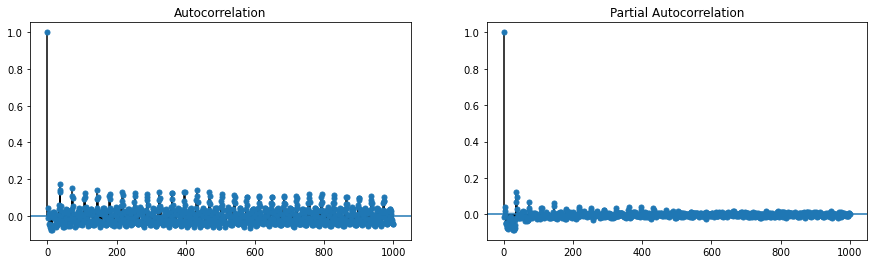

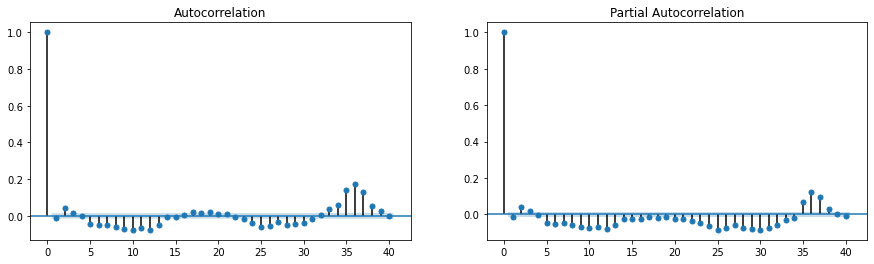

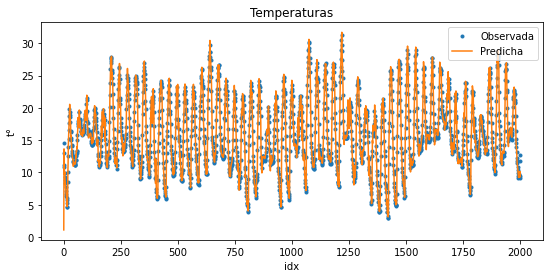

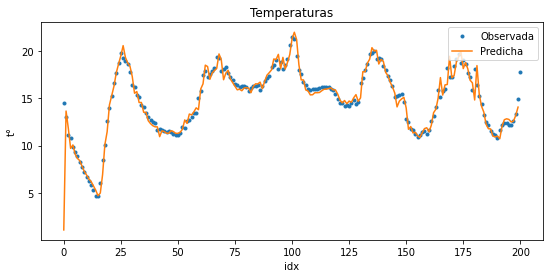

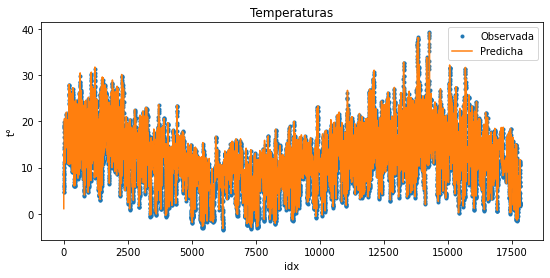

In [29]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [30]:
#Componente 24h

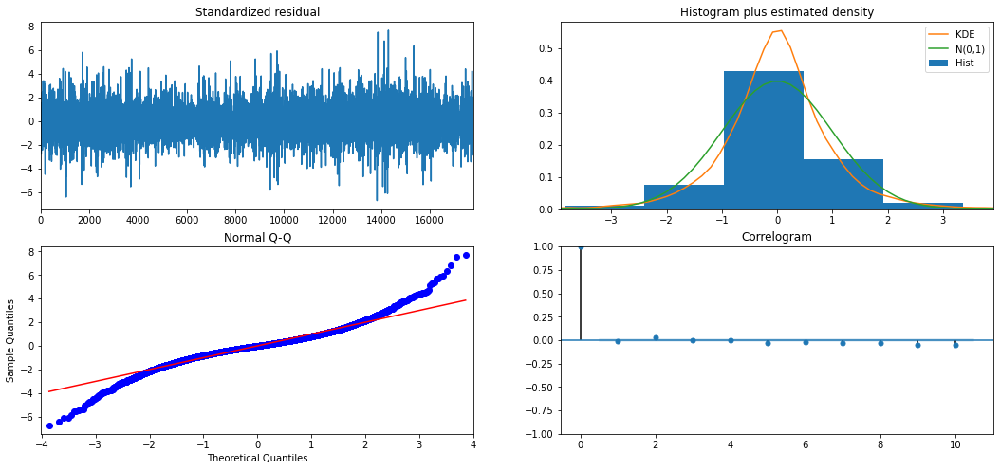

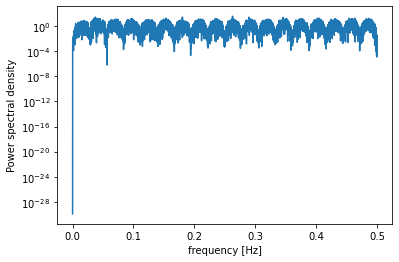

          freq        pow      delay
4689  0.262777  35.983208   3.805502
668   0.037436  26.379704  26.712575
3220  0.180453  26.379144   5.541615
5171  0.289789  25.734710   3.450783
6173  0.345943  23.504112   2.890653
2736  0.153329  18.561345   6.521930
7223  0.404786  18.372480   2.470442
8271  0.463517  17.541112   2.157417
659   0.036931  17.481251  27.077390
7184  0.402600  17.478300   2.483853
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(0, 1, [], 36)   Log Likelihood              -23210.924
Date:                             Wed, 07 Oct 2020   AIC                          46437.848
Time:                                     15:34:52   BIC                          46500.147
Sample:                                          0   HQIC                         46458.346
                                         

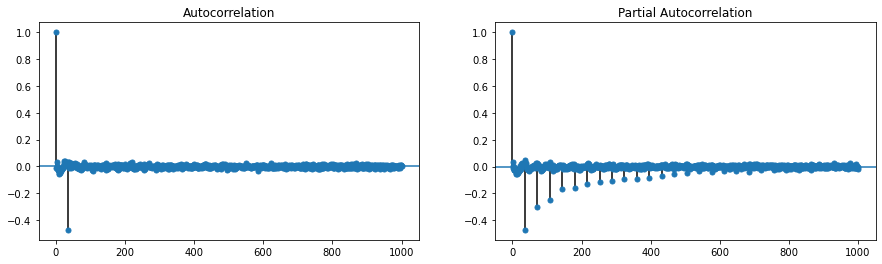

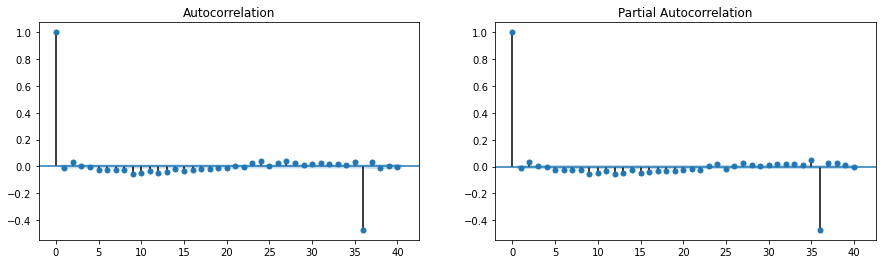

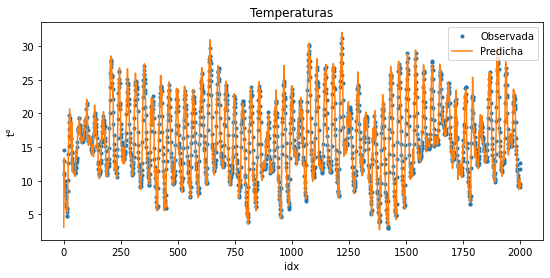

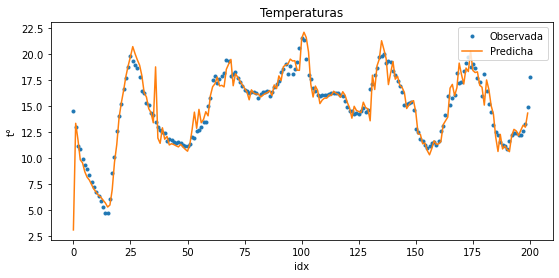

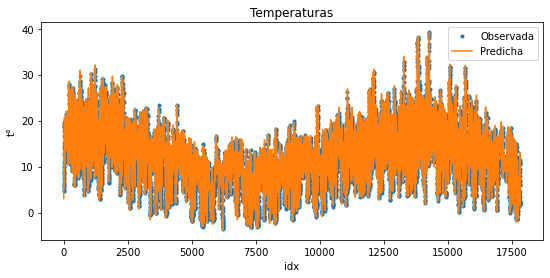

In [32]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


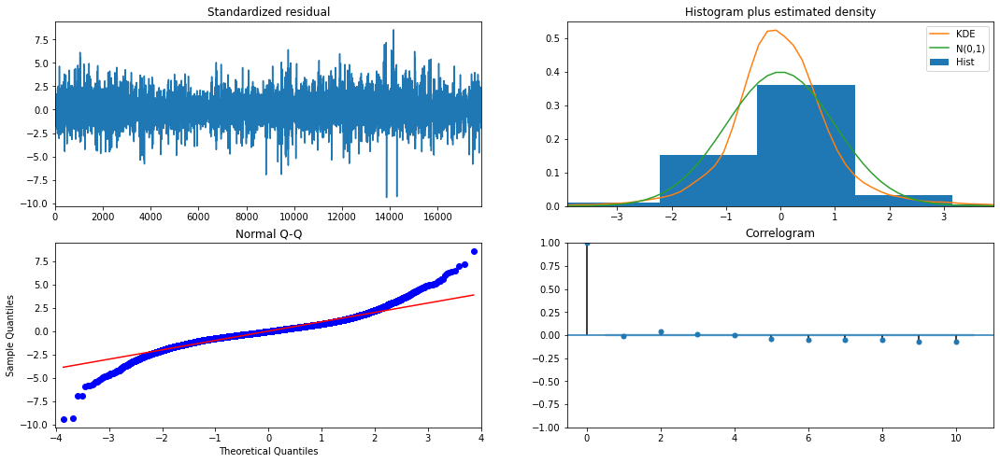

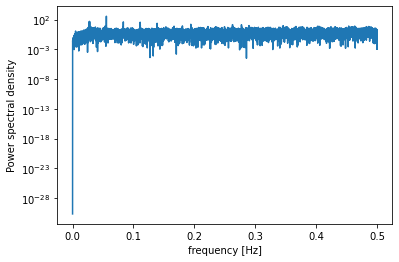

          freq         pow      delay
991   0.055537  374.727313  18.006054
990   0.055481   53.328646  18.024242
494   0.027684   50.262176  36.121457
497   0.027852   47.513848  35.903421
1488  0.083389   41.728285  11.991935
1982  0.111074   36.748337   9.003027
1981  0.111018   35.243177   9.007572
2479  0.138926   24.136370   7.198064
2475  0.138702   18.970290   7.209697
3466  0.194239   16.513872   5.148298
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 36)   Log Likelihood              -18934.780
Date:                            Wed, 07 Oct 2020   AIC                          37887.559
Time:                                    15:43:55   BIC                          37957.664
Sample:                                         0   HQIC                         37910.623
                                    

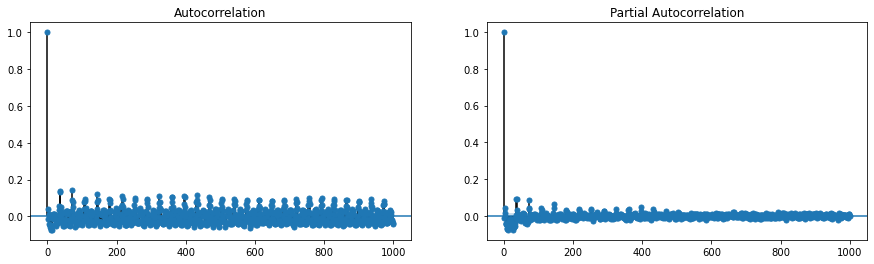

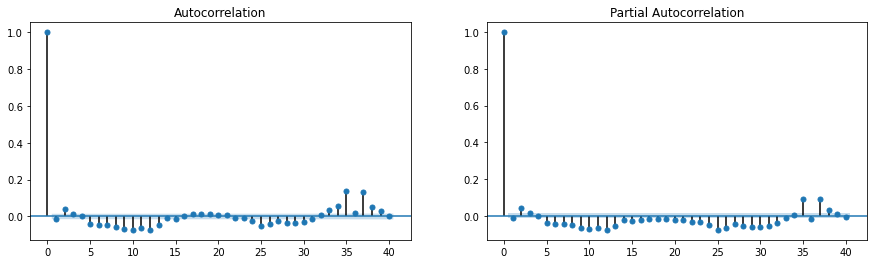

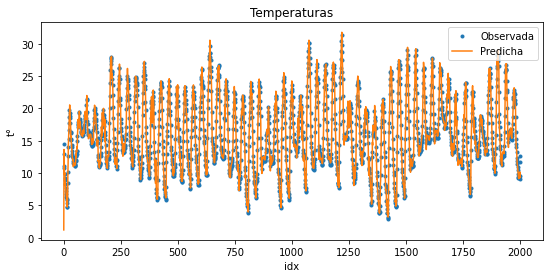

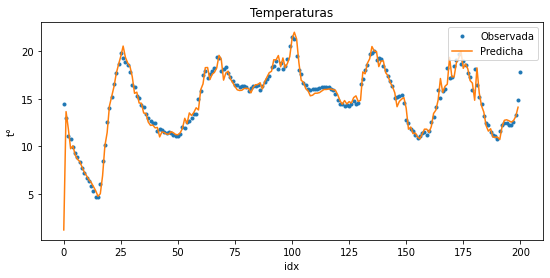

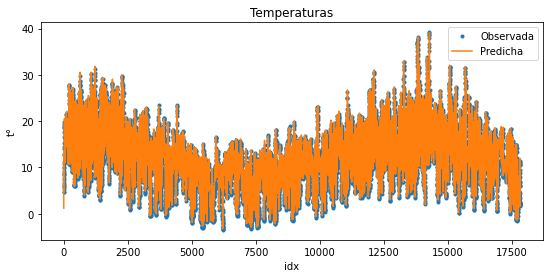

In [33]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


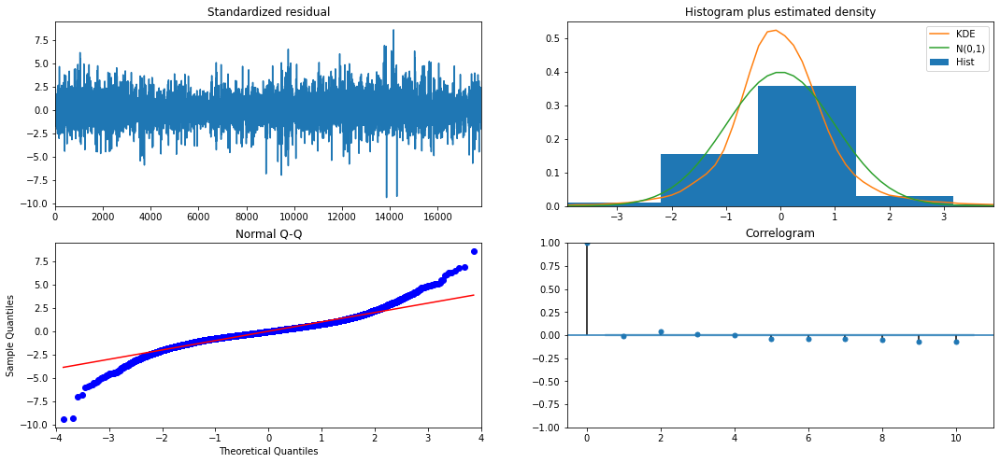

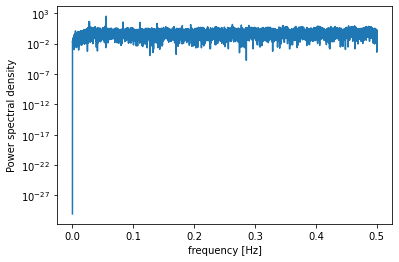

          freq         pow      delay
991   0.055537  334.779299  18.006054
990   0.055481   47.727707  18.024242
494   0.027684   44.955528  36.121457
497   0.027852   42.778284  35.903421
1488  0.083389   36.788125  11.991935
1982  0.111074   32.141948   9.003027
1981  0.111018   30.942204   9.007572
2479  0.138926   20.887167   7.198064
2475  0.138702   16.383936   7.209697
4689  0.262777   14.789687   3.805502
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 36)   Log Likelihood              -18861.144
Date:                             Wed, 07 Oct 2020   AIC                          37740.287
Time:                                     15:50:46   BIC                          37810.391
Sample:                                          0   HQIC                         37763.351
                              

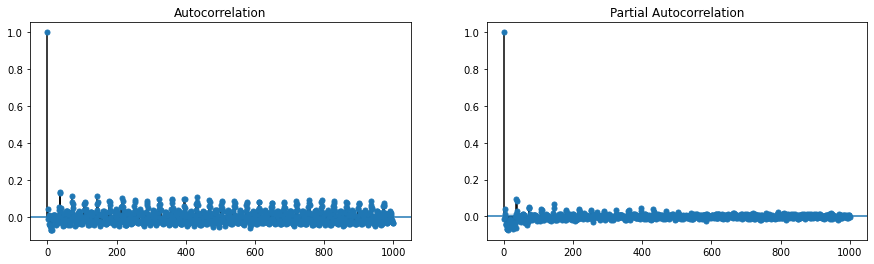

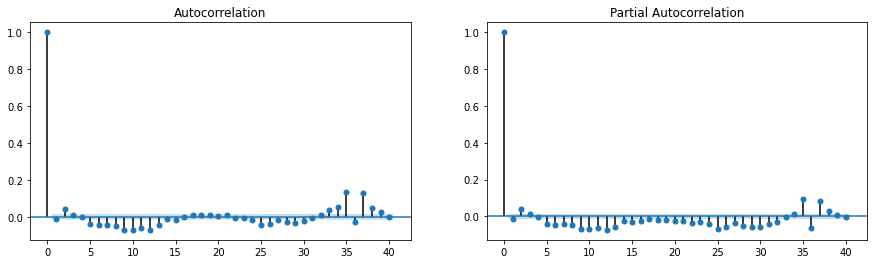

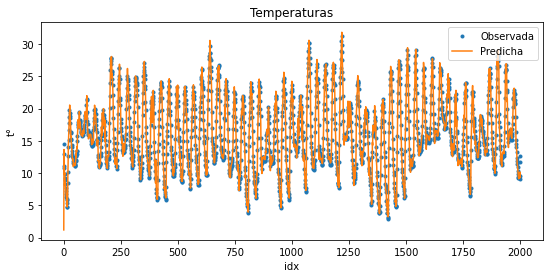

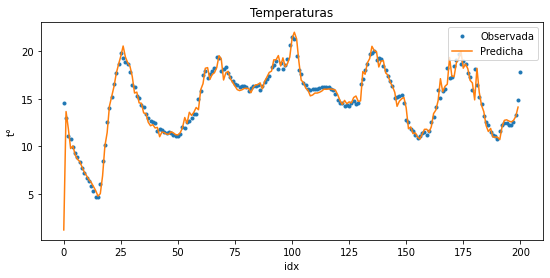

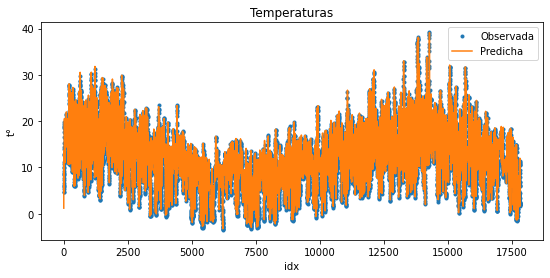

In [34]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


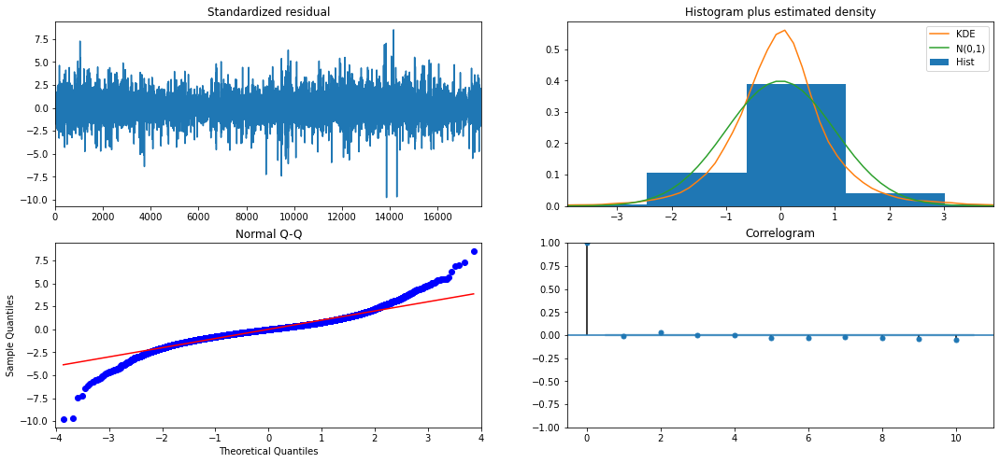

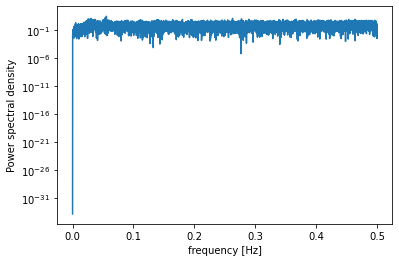

          freq        pow      delay
991   0.055537  25.569847  18.006054
949   0.053183  12.902621  18.802950
4689  0.262777  10.737453   3.805502
536   0.030038  10.207523  33.291045
990   0.055481   9.013156  18.024242
544   0.030486   8.832940  32.801471
457   0.025611   8.547916  39.045952
4951  0.277460   8.508781   3.604120
534   0.029926   8.135419  33.415730
6548  0.366958   7.534609   2.725107
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -18126.195
Date:                            Wed, 07 Oct 2020   AIC                          36272.391
Time:                                    15:59:34   BIC                          36350.285
Sample:                                         0   HQIC                         36298.017
                                          - 178

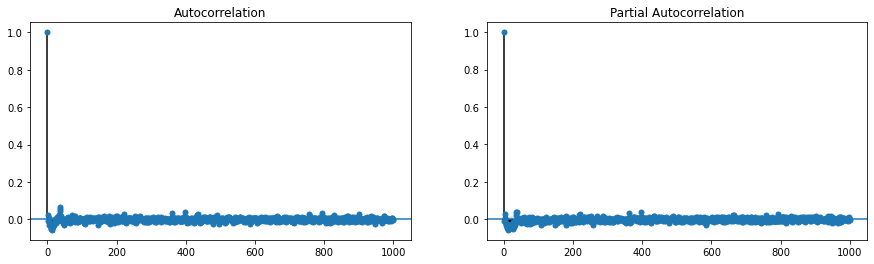

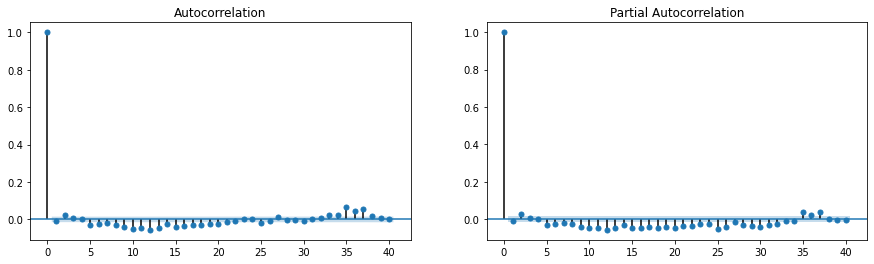

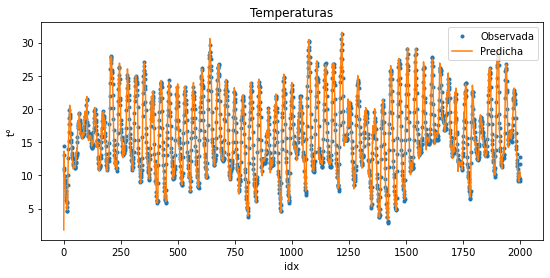

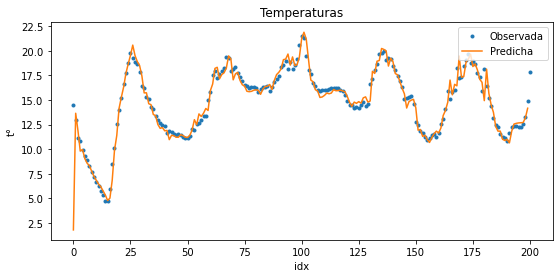

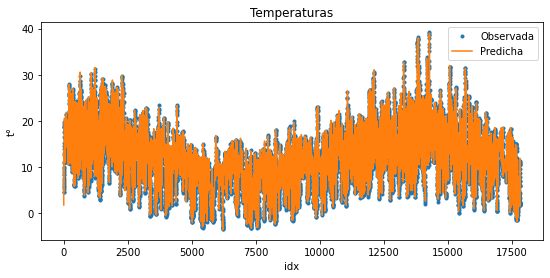

In [35]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [ ]:
#Retiramos variables no significativas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


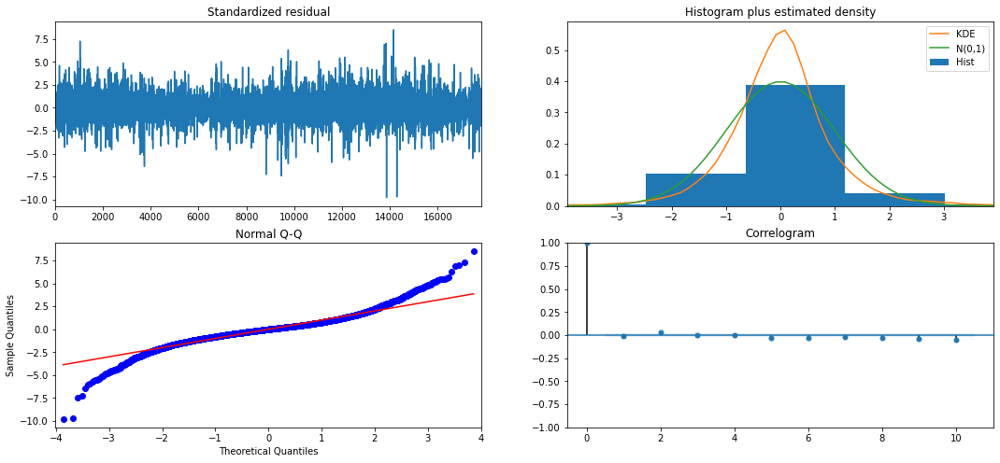

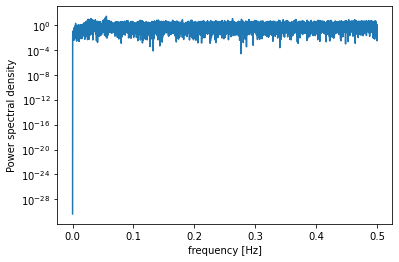

          freq        pow      delay
991   0.055537  25.738431  18.006054
949   0.053183  12.836898  18.802950
4689  0.262777  10.757379   3.805502
536   0.030038  10.359701  33.291045
990   0.055481   8.893171  18.024242
544   0.030486   8.674824  32.801471
457   0.025611   8.573432  39.045952
4951  0.277460   8.388500   3.604120
534   0.029926   7.935232  33.415730
6548  0.366958   7.542603   2.725107
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -18124.575
Date:                            Wed, 07 Oct 2020   AIC                          36267.149
Time:                                    16:22:52   BIC                          36337.254
Sample:                                         0   HQIC                         36290.213
                                          - 178

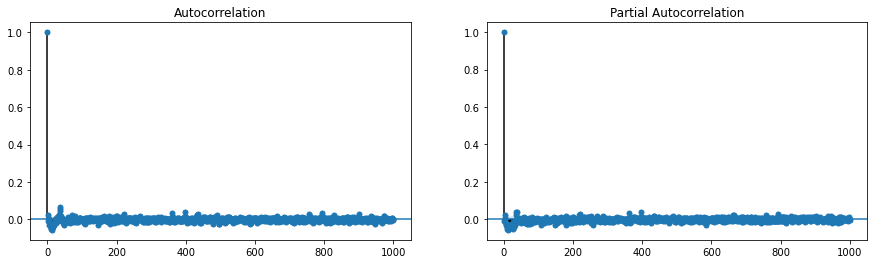

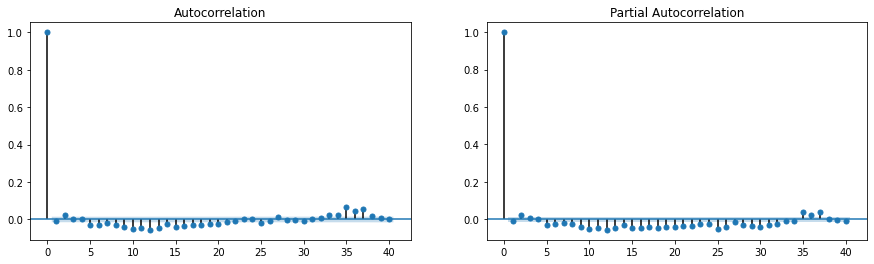

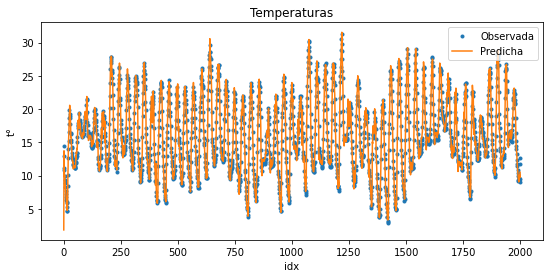

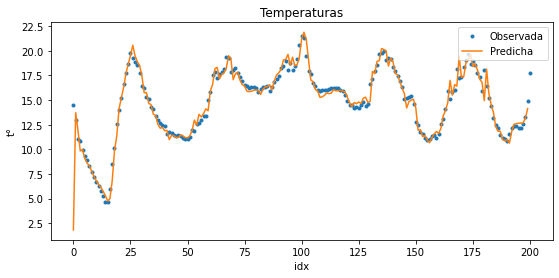

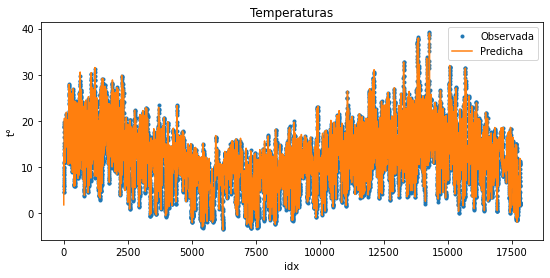

In [36]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

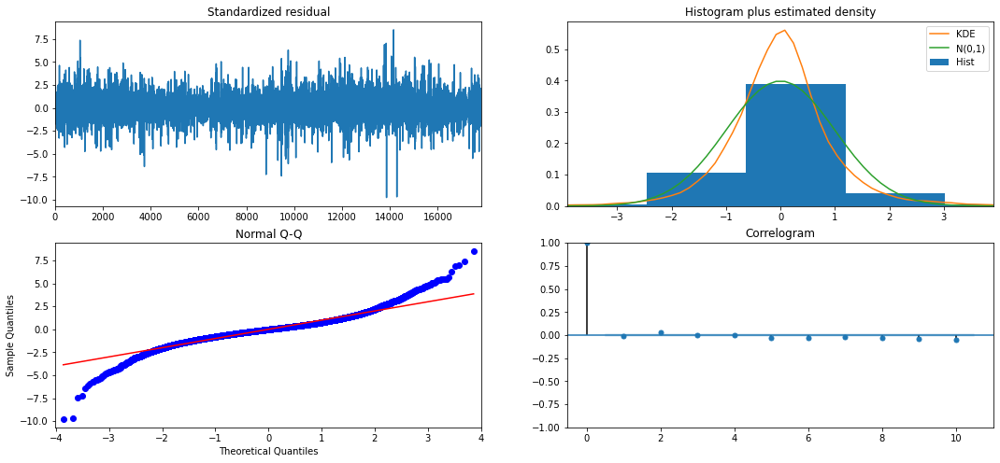

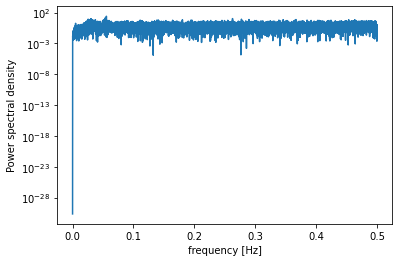

          freq        pow      delay
991   0.055537  25.718509  18.006054
949   0.053183  12.932504  18.802950
4689  0.262777  10.731835   3.805502
536   0.030038  10.158876  33.291045
990   0.055481   9.024170  18.024242
544   0.030486   8.838096  32.801471
457   0.025611   8.533862  39.045952
4951  0.277460   8.491869   3.604120
534   0.029926   8.150790  33.415730
5171  0.289789   7.503325   3.450783
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -18127.095
Date:                            Wed, 07 Oct 2020   AIC                          36270.190
Time:                                    16:42:53   BIC                          36332.505
Sample:                                         0   HQIC                         36290.690
                                          - 178

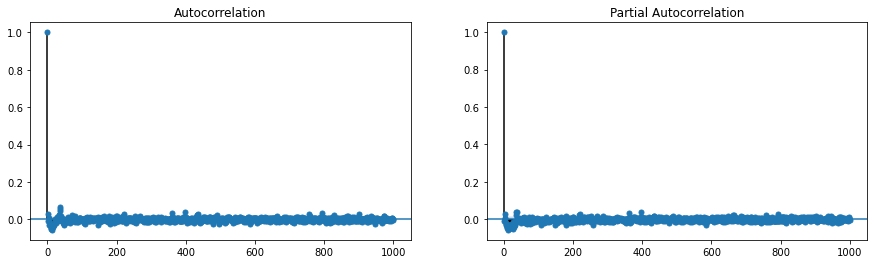

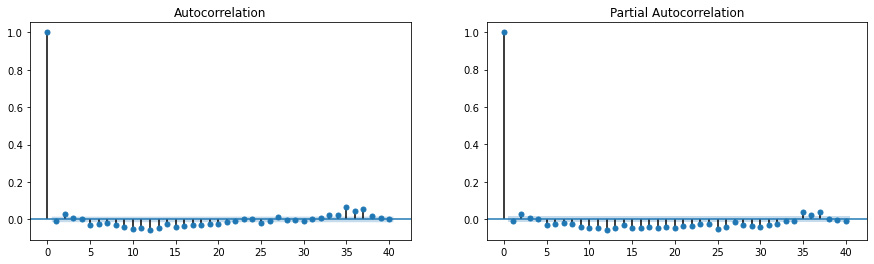

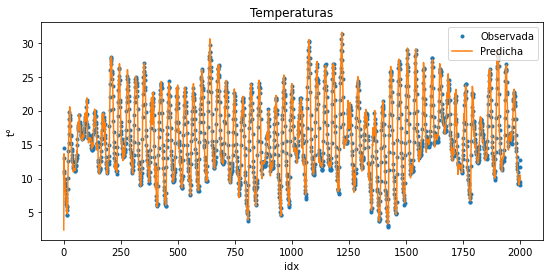

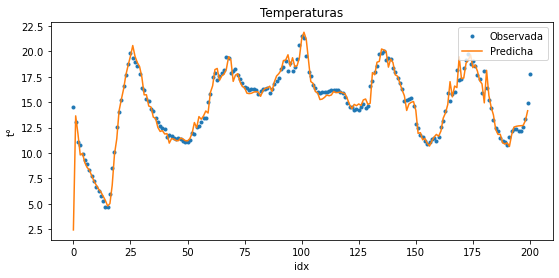

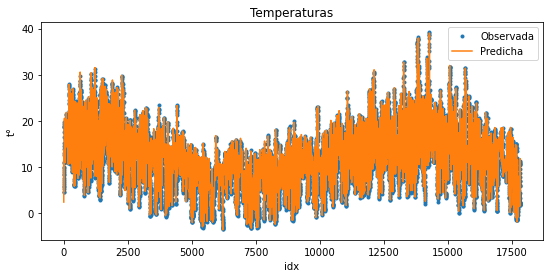

In [37]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [ ]:
#AR o MA 18

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


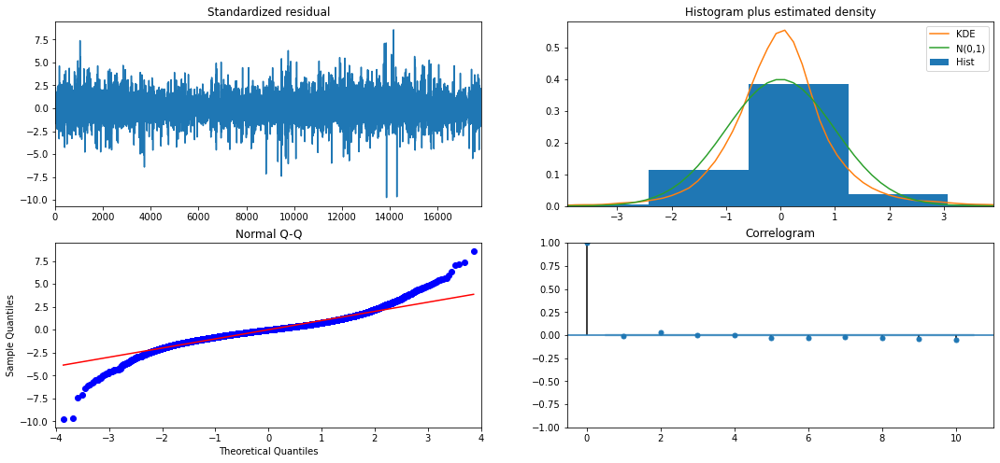

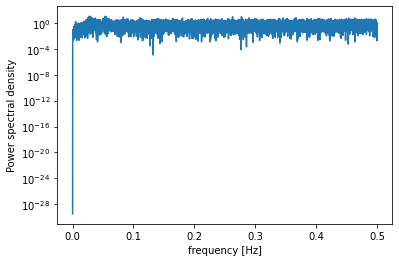

          freq        pow      delay
497   0.027852  13.166688  35.903421
949   0.053183  13.081897  18.802950
494   0.027684  12.340129  36.121457
4951  0.277460  11.557233   3.604120
990   0.055481  11.054788  18.024242
4689  0.262777  10.837372   3.805502
1488  0.083389   9.775931  11.991935
536   0.030038   9.575242  33.291045
991   0.055537   8.723526  18.006054
544   0.030486   8.645804  32.801471
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18130.954
Date:                                 Wed, 07 Oct 2020   AIC                          36281.907
Time:                                         16:52:39   BIC                          36359.801
Sample:                                              0   HQIC                         36307.533
                 

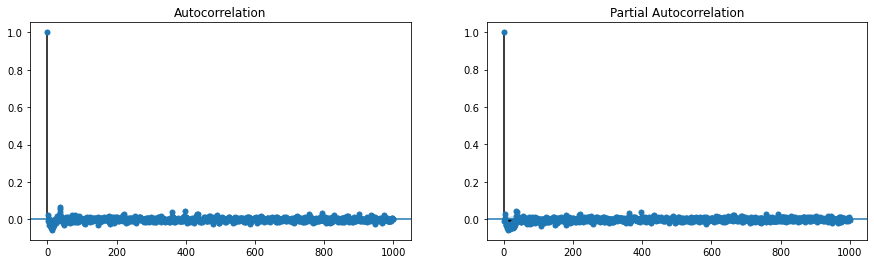

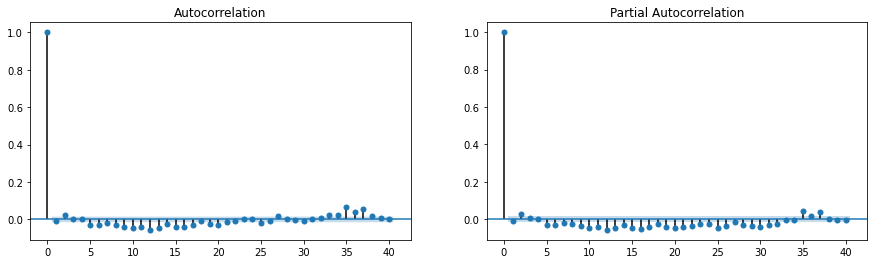

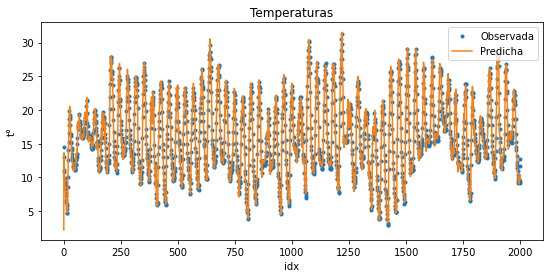

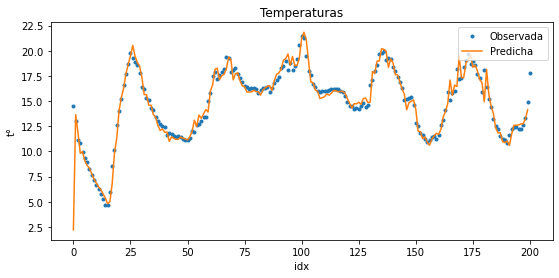

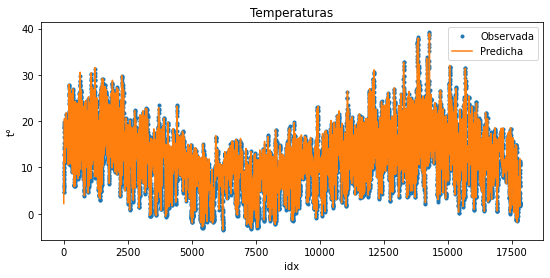

In [38]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [ ]:
#Descartar am o ra de 12 horas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


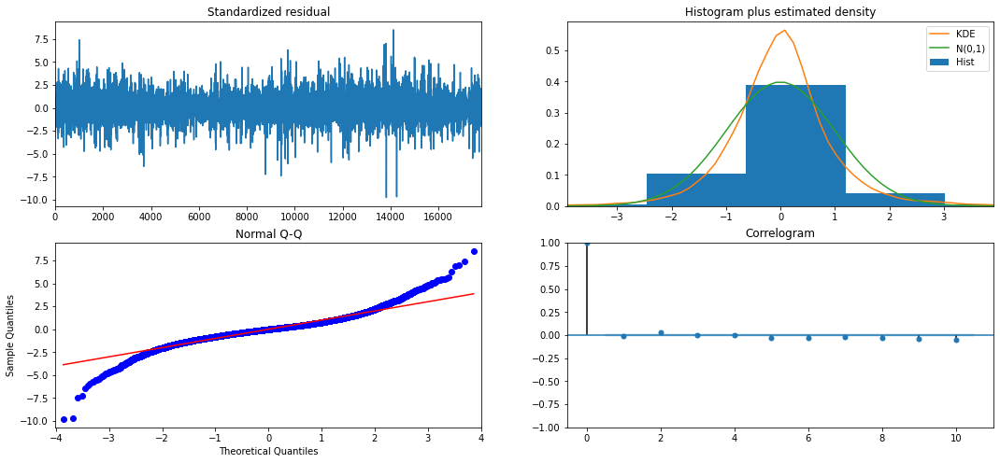

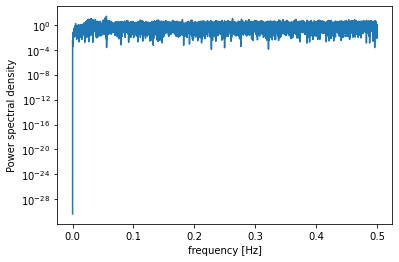

          freq        pow      delay
991   0.055537  25.534158  18.006054
949   0.053183  13.111291  18.802950
4689  0.262777  11.156455   3.805502
536   0.030038  10.732229  33.291045
544   0.030486   8.826883  32.801471
457   0.025611   8.377827  39.045952
4951  0.277460   8.277855   3.604120
990   0.055481   8.185219  18.024242
6548  0.366958   8.086029   2.725107
534   0.029926   7.780731  33.415730
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18114.833
Date:                                 Wed, 07 Oct 2020   AIC                          36247.667
Time:                                         17:28:40   BIC                          36317.752
Sample:                                              0   HQIC                         36270.726
                 

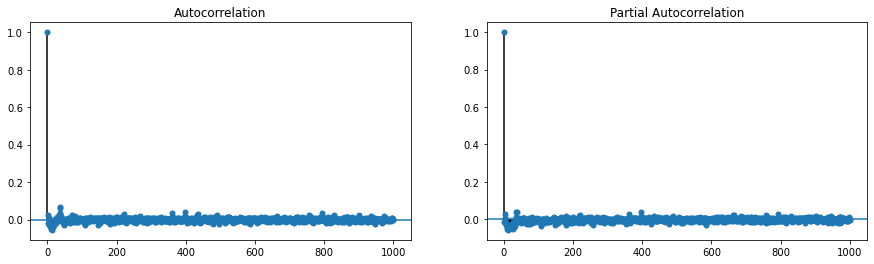

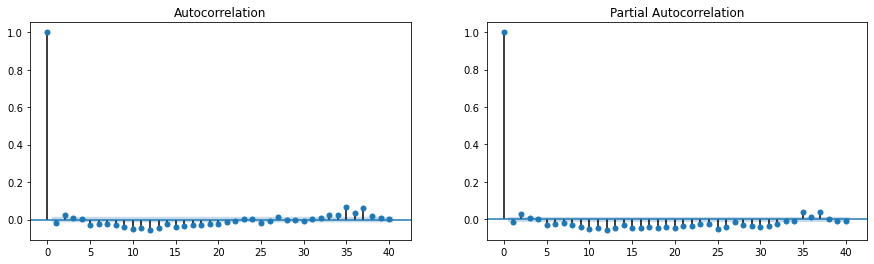

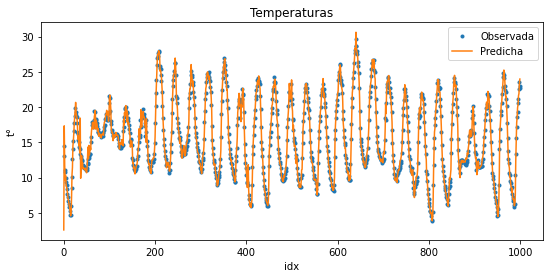

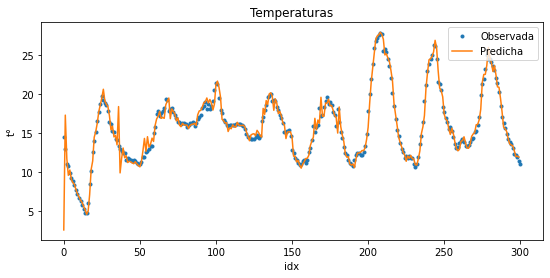

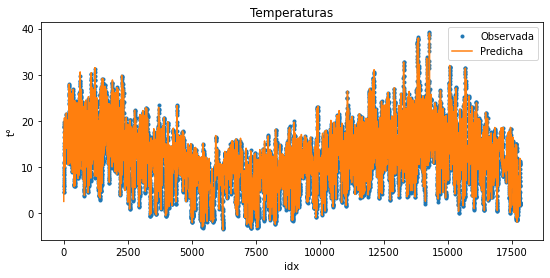

In [39]:
mysarimax2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']],
         restriccion={'ar.S.L18':0})

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


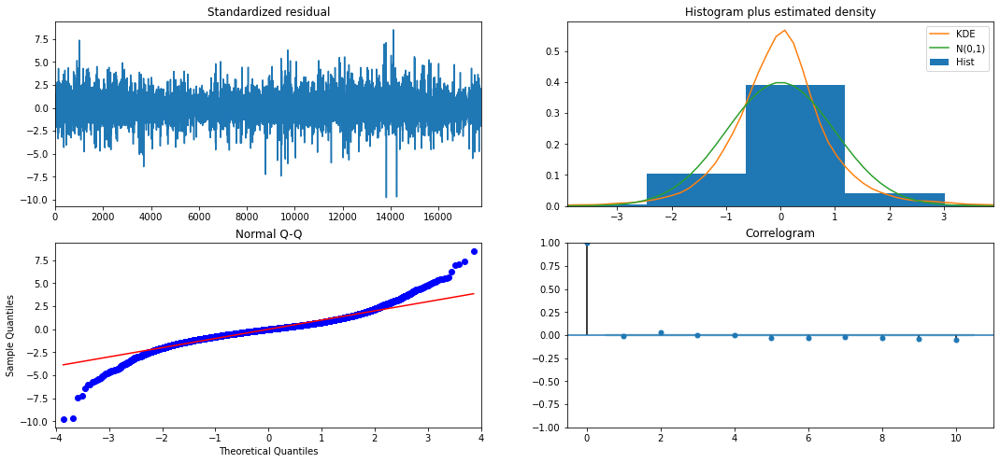

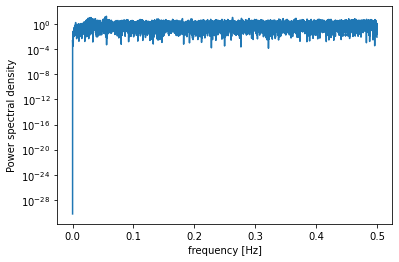

          freq        pow      delay
991   0.055537  17.166903  18.006054
949   0.053183  13.016635  18.802950
4689  0.262777  11.181557   3.805502
536   0.030038  10.694108  33.291045
497   0.027852   9.587533  35.903421
494   0.027684   8.824784  36.121457
544   0.030486   8.726076  32.801471
457   0.025611   8.272842  39.045952
6548  0.366958   8.111700   2.725107
4951  0.277460   7.937396   3.604120
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18110.910
Date:                                 Wed, 07 Oct 2020   AIC                          36239.820
Time:                                         17:38:41   BIC                          36309.905
Sample:                                              0   HQIC                         36262.879
                 

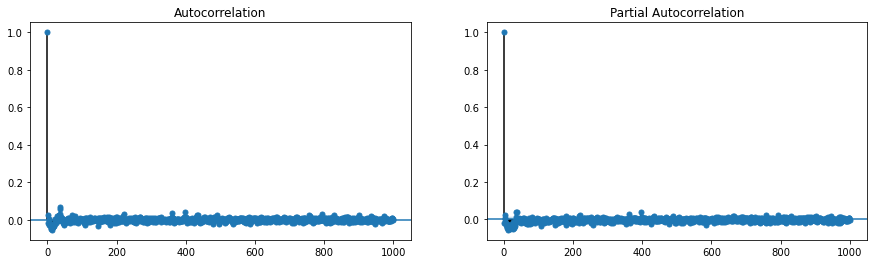

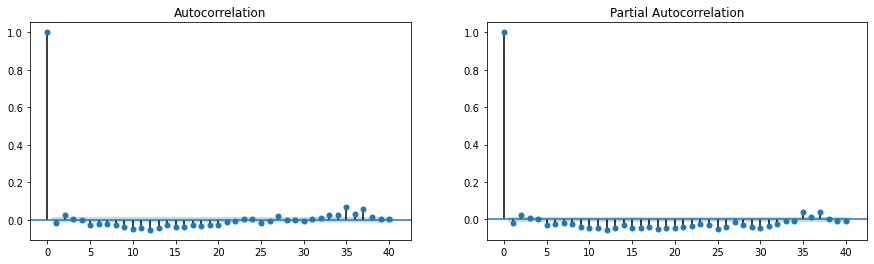

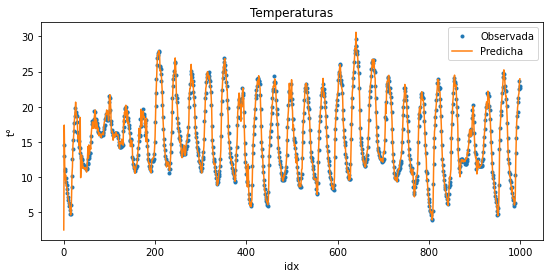

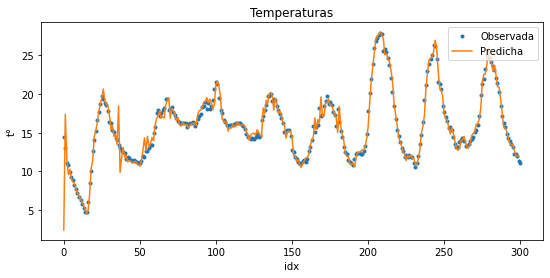

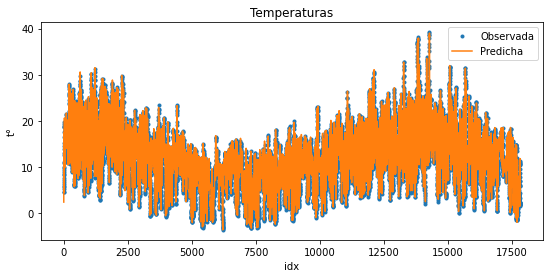

In [40]:
mysarimax2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']],
         restriccion={'ma.S.L18':0})

In [ ]:
# Se opta por: 

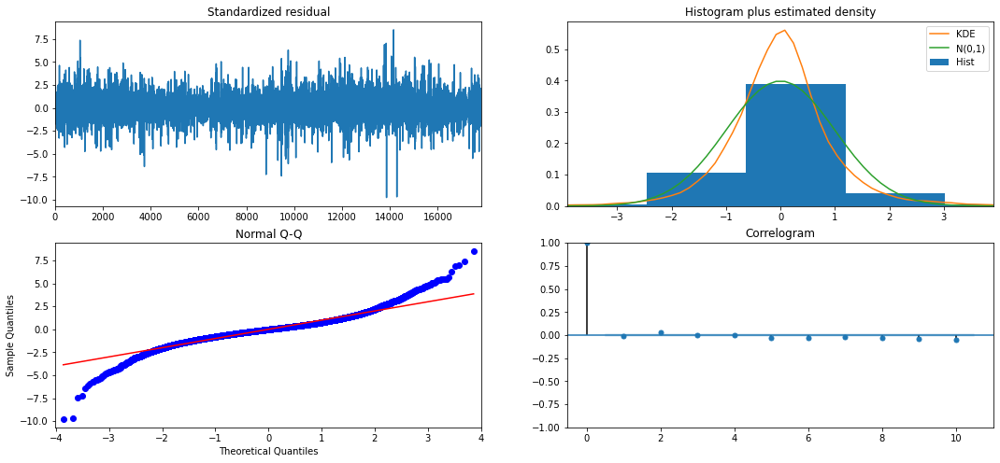

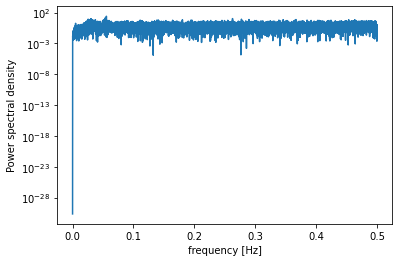

          freq        pow      delay
991   0.055537  25.718509  18.006054
949   0.053183  12.932504  18.802950
4689  0.262777  10.731835   3.805502
536   0.030038  10.158876  33.291045
990   0.055481   9.024170  18.024242
544   0.030486   8.838096  32.801471
457   0.025611   8.533862  39.045952
4951  0.277460   8.491869   3.604120
534   0.029926   8.150790  33.415730
5171  0.289789   7.503325   3.450783
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -18127.095
Date:                            Tue, 17 Nov 2020   AIC                          36270.190
Time:                                    11:11:16   BIC                          36332.505
Sample:                                         0   HQIC                         36290.690
                                          - 178

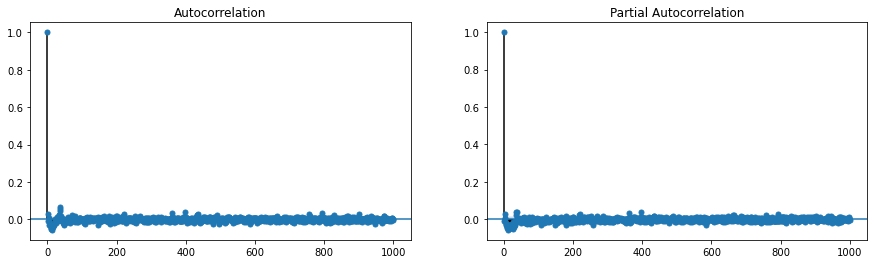

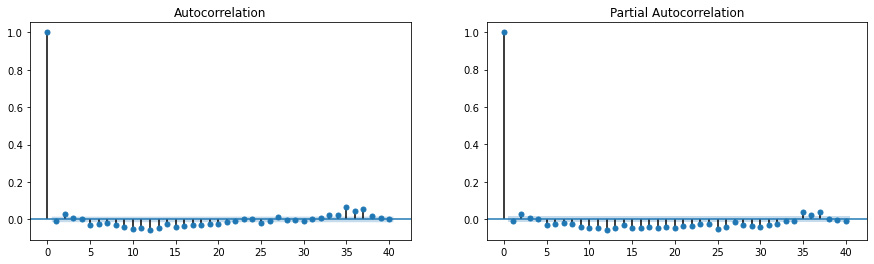

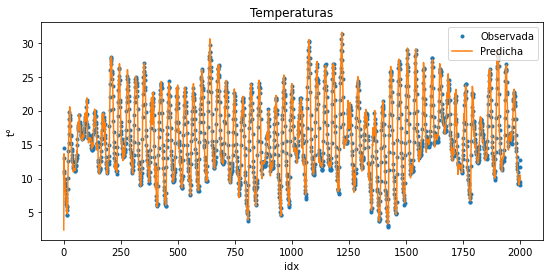

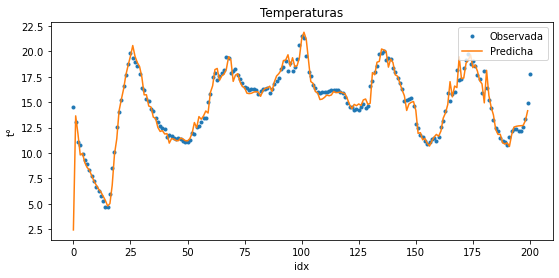

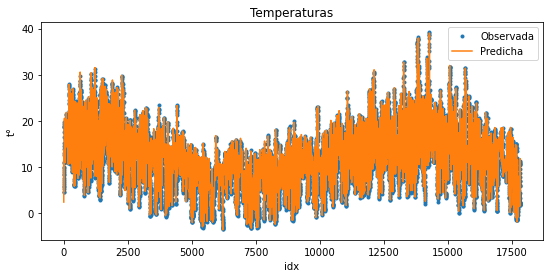

In [23]:
Res1=mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [24]:
#Para Validar:

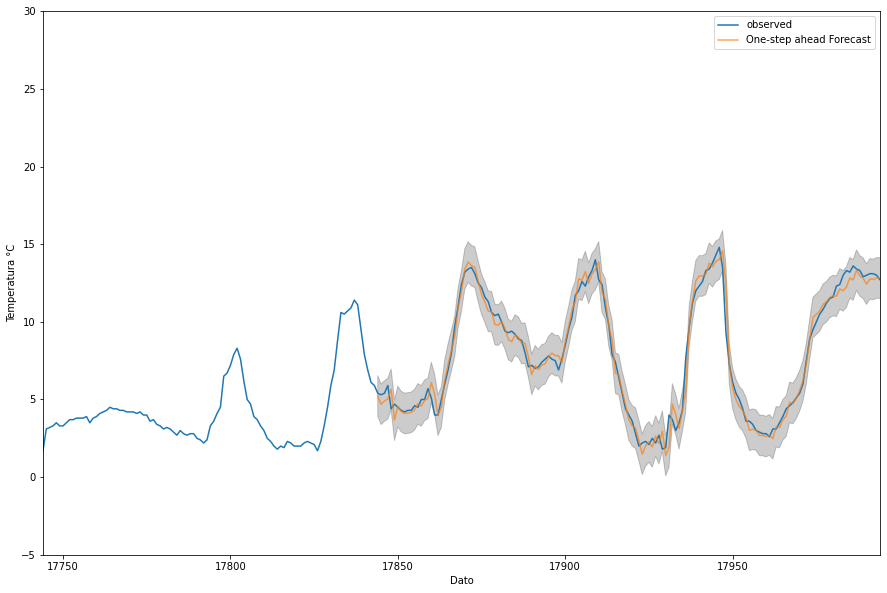

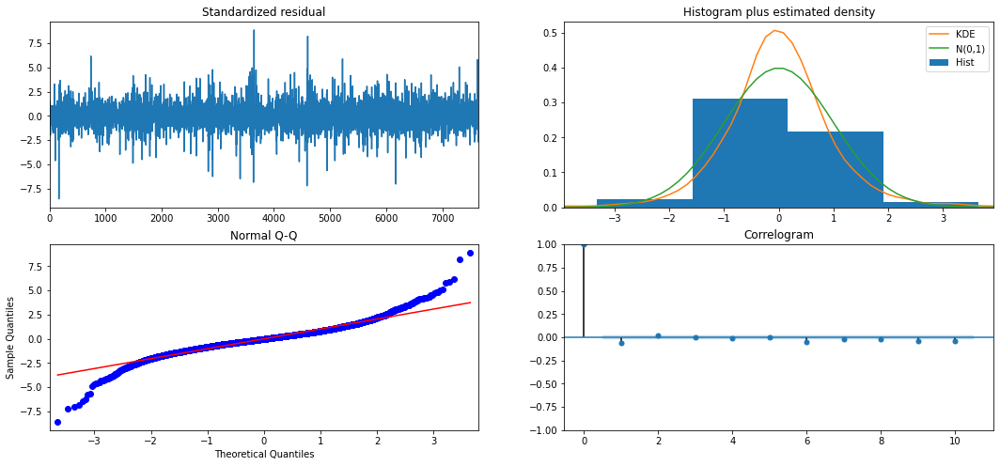

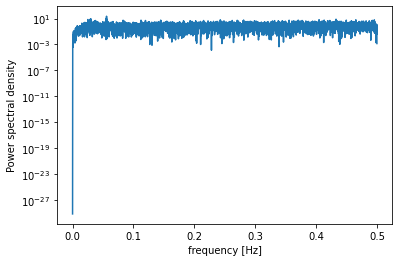

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7648
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood               -7942.654
Date:                            Tue, 17 Nov 2020   AIC                          15901.309
Time:                                    11:11:31   BIC                          15956.846
Sample:                                         0   HQIC                         15920.361
                                           - 7648                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -3.68e-06      0.000     -0.015      0.988      -0.000       0.000
Sen_hora      -3.3123      0.174   

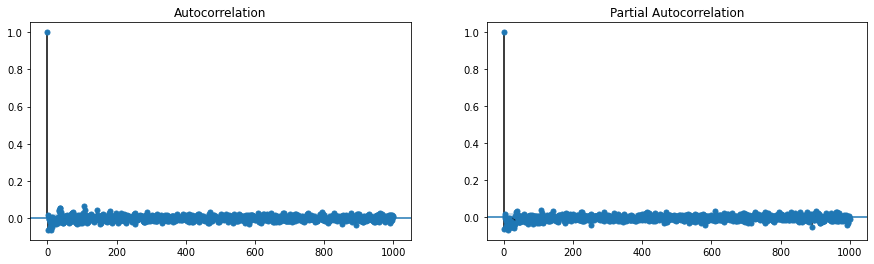

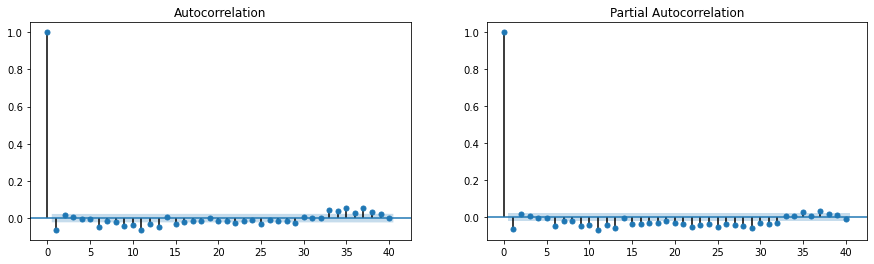

In [25]:
predecir_1(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17844   5.4  0.169462        False        False        False
17845   5.3  0.605250        False        False        False
17846   5.4  0.507272        False        False        False
17847   5.9  0.852238        False        False        False
17848   4.4 -1.254913         True        False        False
...     ...       ...          ...          ...          ...
25487  23.4 -1.051390         True        False        False
25488  23.7  1.156011         True        False        False
25489  23.1 -0.014625        False        False        False
25490  20.4 -1.795621         True        False        False
25491  18.7  0.031552        False        False        False

[7648 rows x 5 columns]
Promedio Valor Absoluto Error: 0.4838882191314896
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    10.695607     1.725941     0.326883


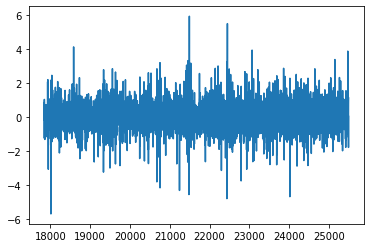

In [26]:
predecir_3(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

In [ ]:
#Comenzando denuevo:

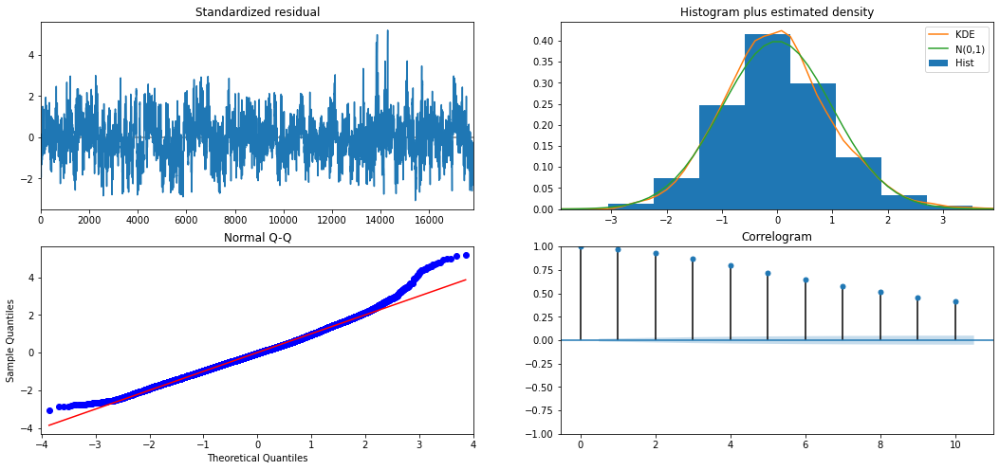

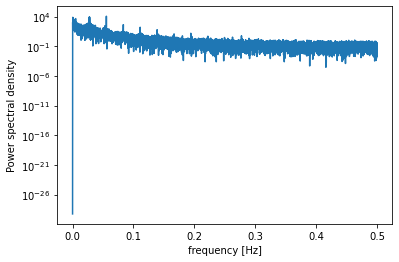

         freq           pow        delay
991  0.055537  11614.796867    18.006054
494  0.027684   9244.482955    36.121457
497  0.027852   7776.228561    35.903421
7    0.000392   7611.102414  2549.142857
12   0.000672   5612.302436  1487.000000
17   0.000953   5560.429923  1049.647059
89   0.004988   4717.084739   200.494382
63   0.003531   3195.530825   283.238095
10   0.000560   3097.668939  1784.400000
65   0.003643   3033.973969   274.523077
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:                        SARIMAX   Log Likelihood              -48636.327
Date:                Wed, 07 Oct 2020   AIC                          97284.653
Time:                        17:51:29   BIC                          97331.390
Sample:                             0   HQIC                         97300.029
                              - 17844                                      

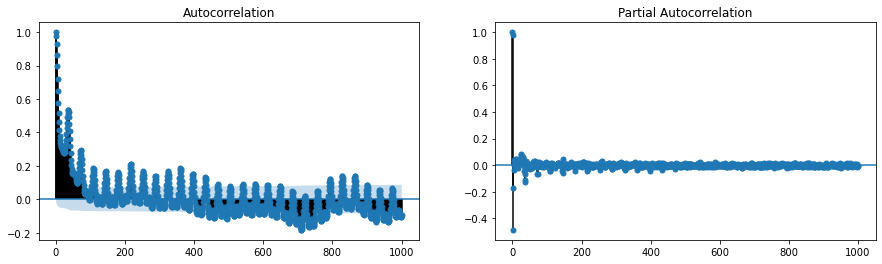

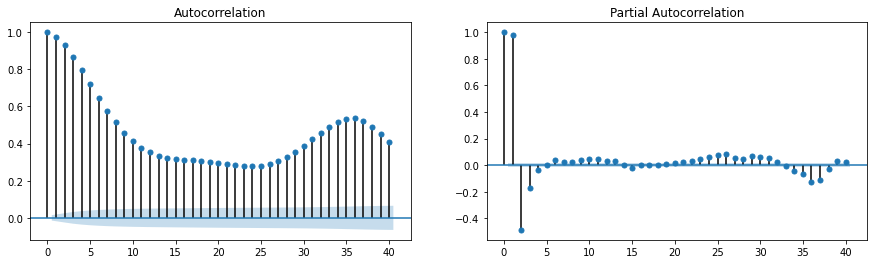

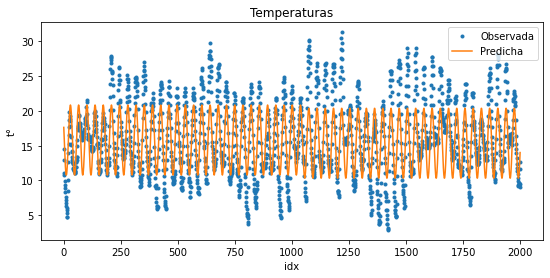

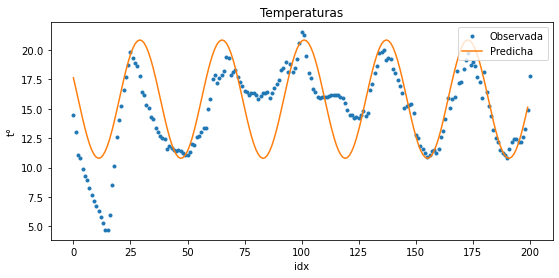

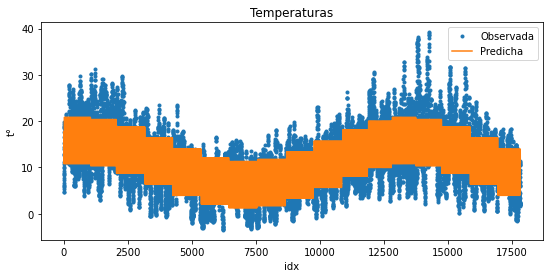

In [44]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [ ]:
#AM o RA 1

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


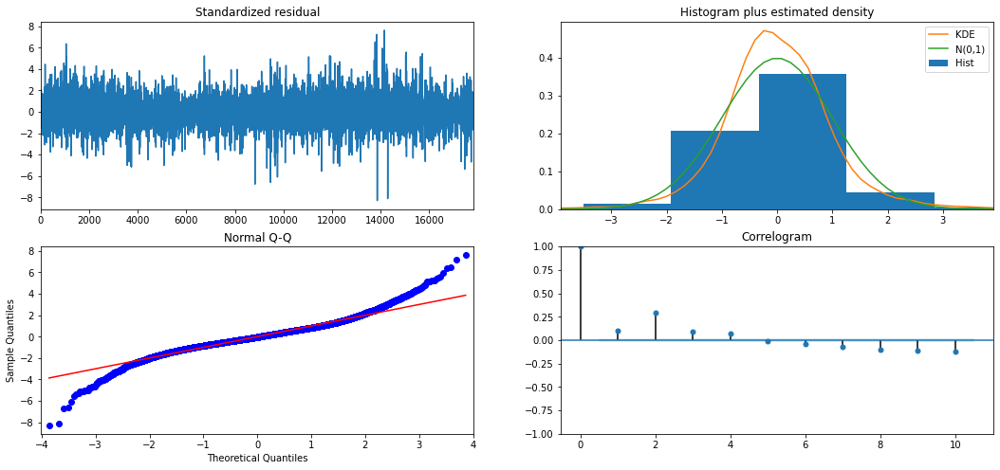

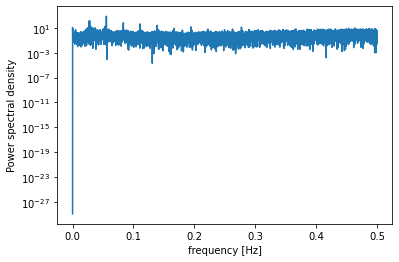

          freq         pow      delay
991   0.055537  757.239552  18.006054
494   0.027684  148.248869  36.121457
497   0.027852  130.193641  35.903421
990   0.055481  105.639624  18.024242
1488  0.083389   66.268552  11.991935
1982  0.111074   44.042551   9.003027
1981  0.111018   41.859055   9.007572
495   0.027740   28.687891  36.048485
2479  0.138926   26.307201   7.198064
2475  0.138702   20.773669   7.209697
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -19867.911
Date:                Wed, 07 Oct 2020   AIC                          39751.822
Time:                        17:53:34   BIC                          39814.137
Sample:                             0   HQIC                         39772.322
                              - 17844                                         
Covariance Type:             

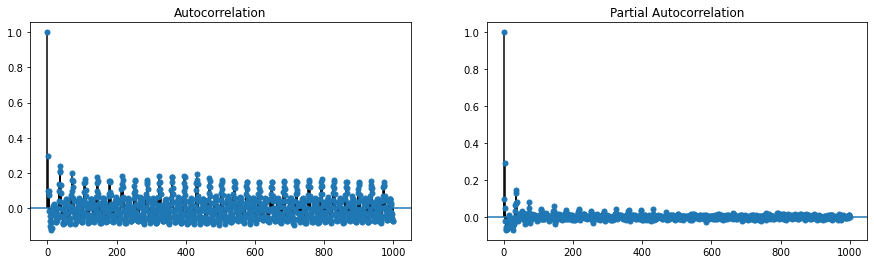

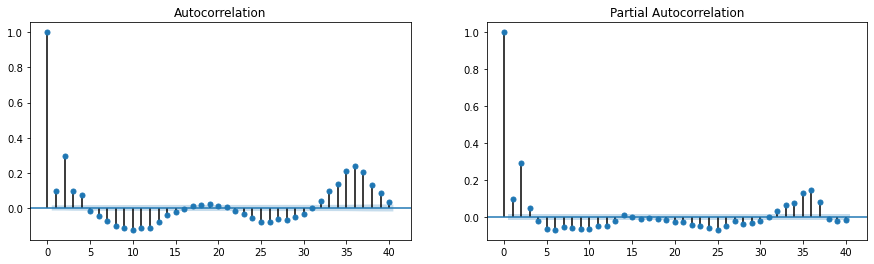

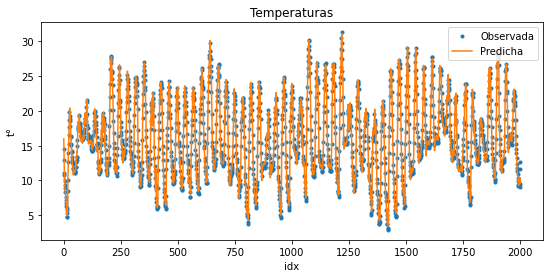

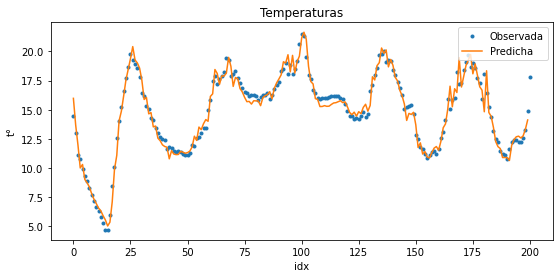

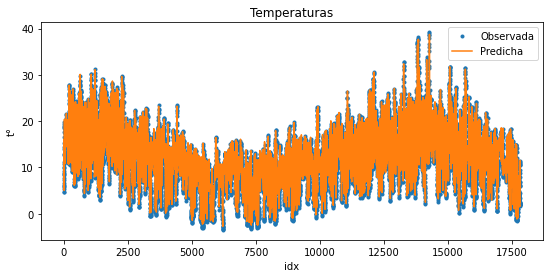

In [45]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [ ]:
# Retirando x3

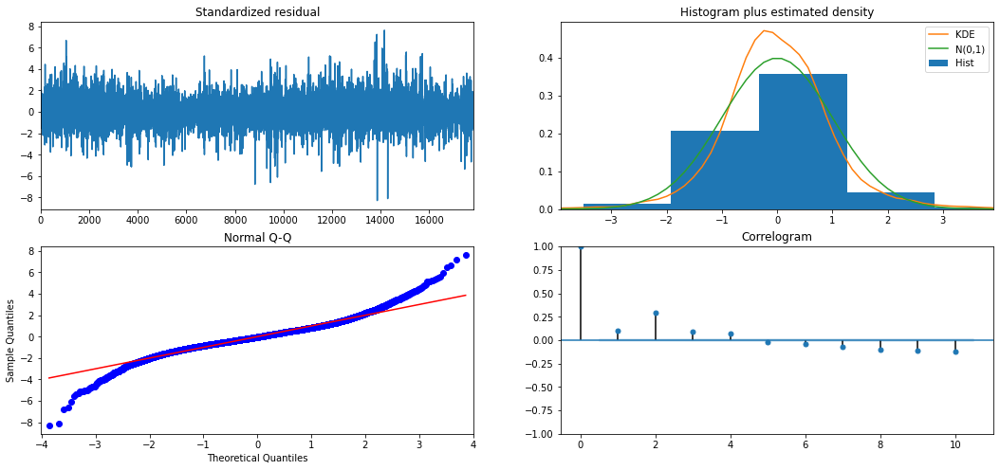

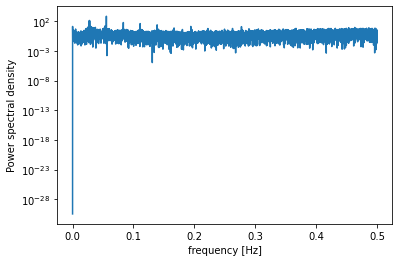

          freq         pow      delay
991   0.055537  757.459697  18.006054
494   0.027684  148.064197  36.121457
497   0.027852  129.743859  35.903421
990   0.055481  105.899312  18.024242
1488  0.083389   66.097489  11.991935
1982  0.111074   43.977482   9.003027
1981  0.111018   41.982977   9.007572
495   0.027740   28.546790  36.048485
2479  0.138926   26.214216   7.198064
2475  0.138702   20.731050   7.209697
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -19869.497
Date:                Wed, 07 Oct 2020   AIC                          39752.994
Time:                        17:54:41   BIC                          39807.520
Sample:                             0   HQIC                         39770.932
                              - 17844                                         
Covariance Type:             

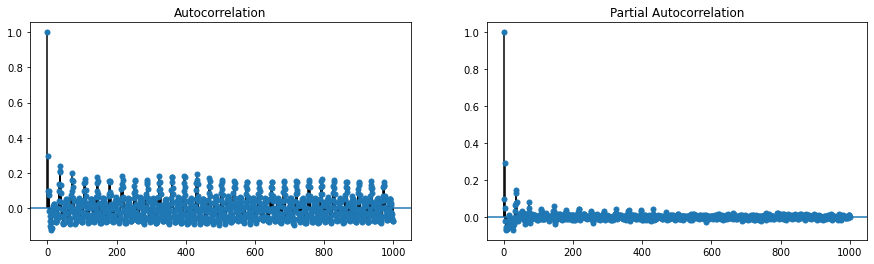

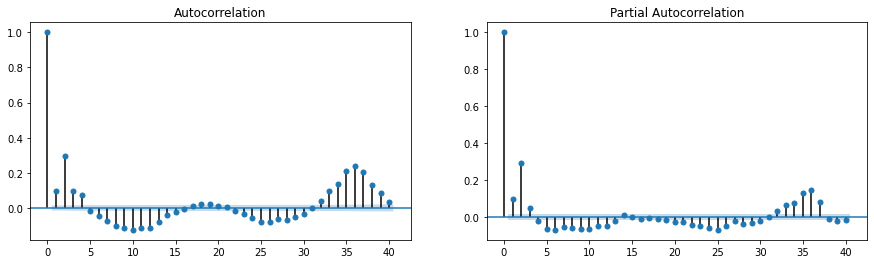

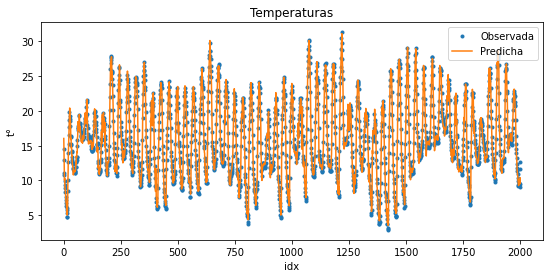

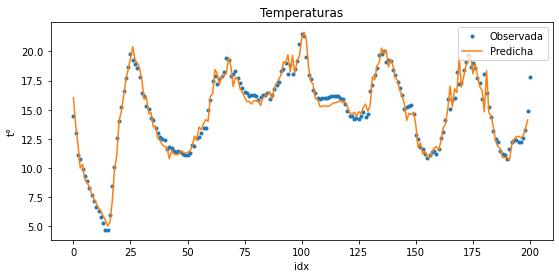

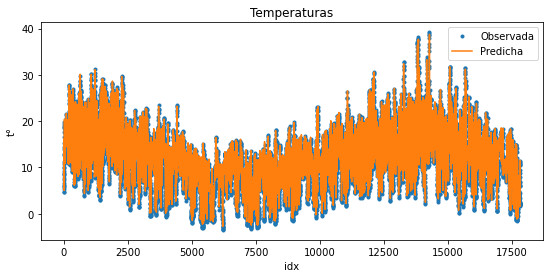

In [47]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#AR o mA 2

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


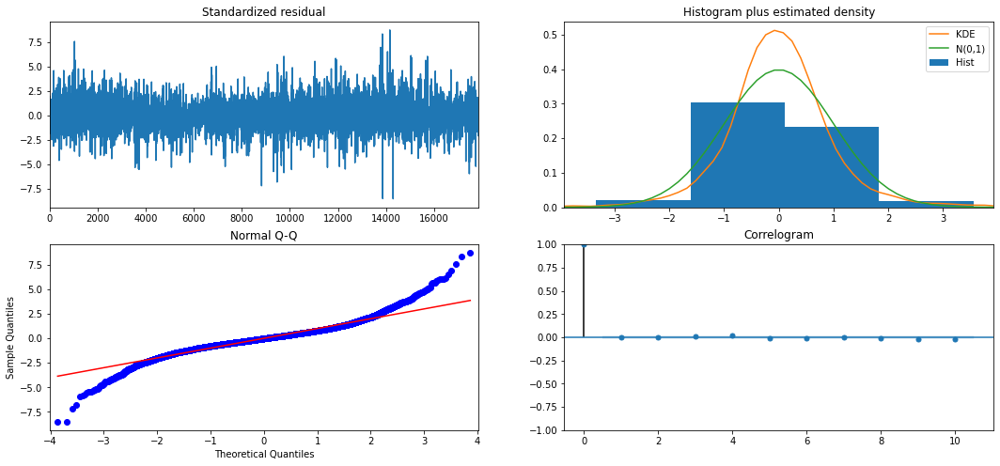

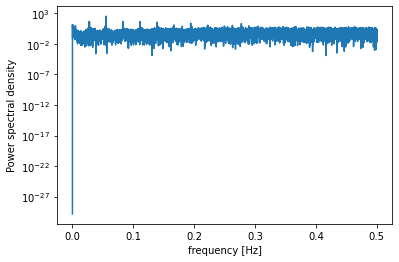

          freq         pow      delay
991   0.055537  326.185660  18.006054
1488  0.083389   45.873622  11.991935
990   0.055481   45.530906  18.024242
494   0.027684   45.033880  36.121457
1982  0.111074   43.641264   9.003027
1981  0.111018   42.074732   9.007572
497   0.027852   41.949618  35.903421
2479  0.138926   34.220408   7.198064
2475  0.138702   27.028737   7.209697
3466  0.194239   24.453066   5.148298
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(2, 0, 2)   Log Likelihood              -18805.743
Date:                Wed, 07 Oct 2020   AIC                          37629.486
Time:                        17:56:33   BIC                          37699.591
Sample:                             0   HQIC                         37652.549
                              - 17844                                         
Covariance Type:             

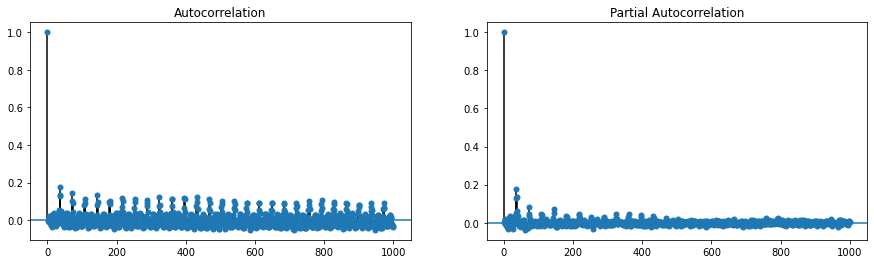

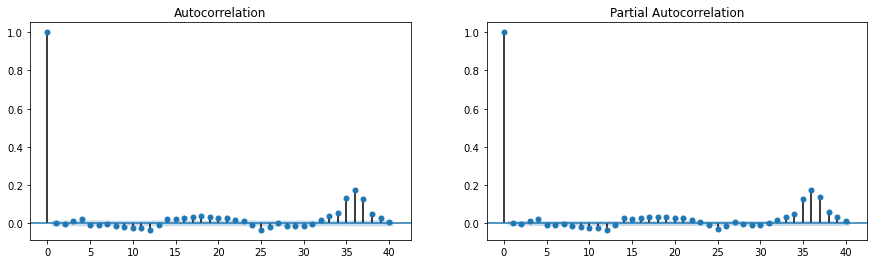

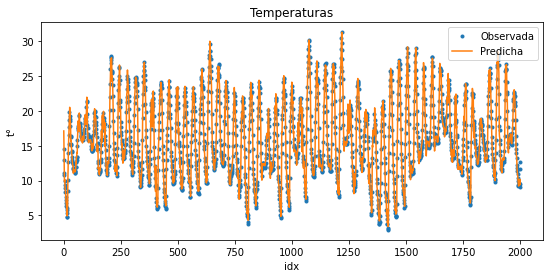

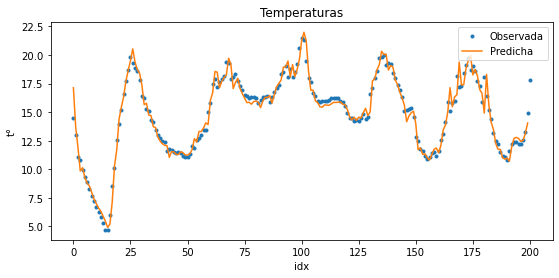

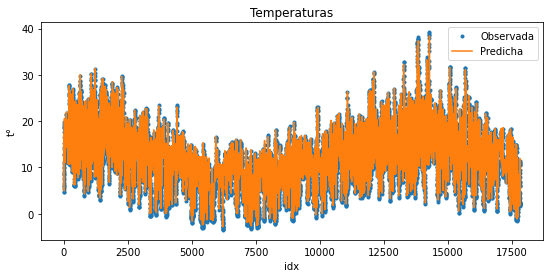

In [48]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,2),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#retiramos ma2

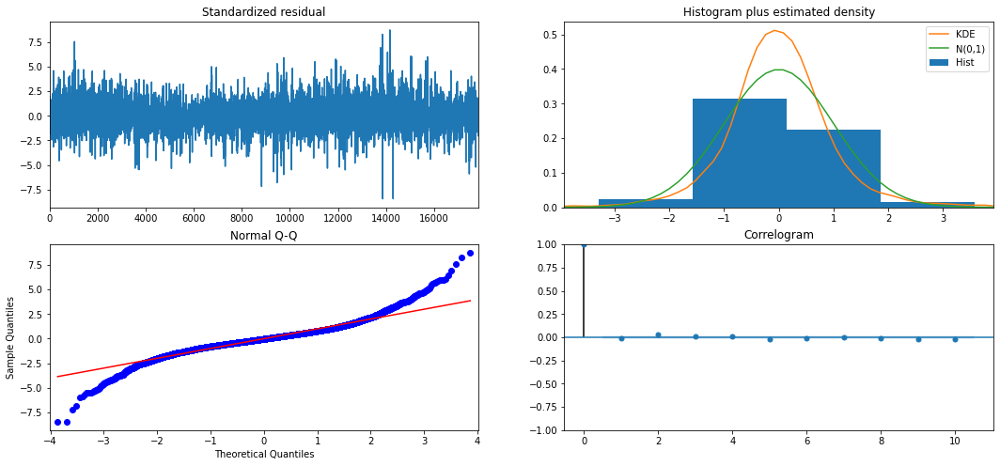

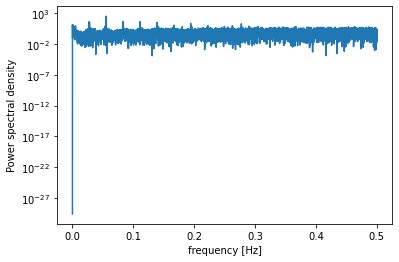

          freq         pow      delay
991   0.055537  339.030868  18.006054
1488  0.083389   48.507444  11.991935
990   0.055481   47.316282  18.024242
1982  0.111074   44.895227   9.003027
1981  0.111018   43.295787   9.007572
494   0.027684   42.993021  36.121457
497   0.027852   40.173315  35.903421
2479  0.138926   33.866002   7.198064
2475  0.138702   26.764421   7.209697
3466  0.194239   22.865122   5.148298
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(2, 0, 1)   Log Likelihood              -18819.372
Date:                Wed, 07 Oct 2020   AIC                          37654.744
Time:                        17:57:35   BIC                          37717.060
Sample:                             0   HQIC                         37675.245
                              - 17844                                         
Covariance Type:             

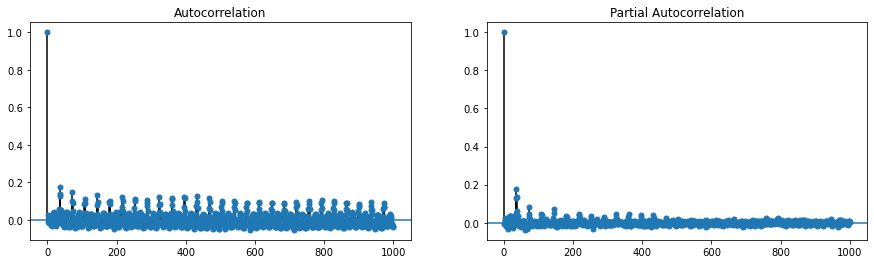

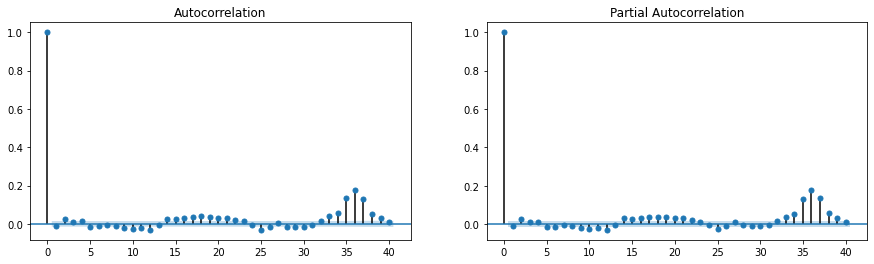

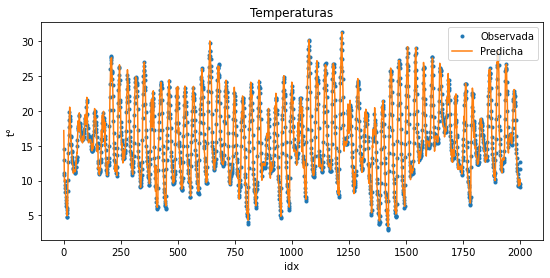

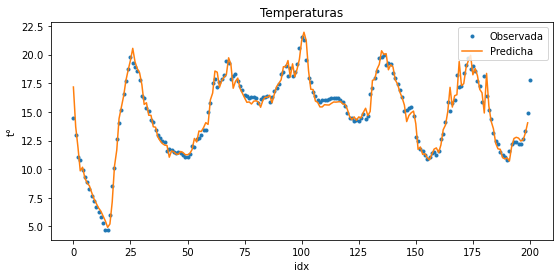

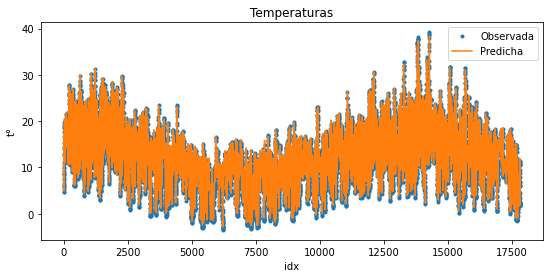

In [49]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#Efecto de 12 y 24 horas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


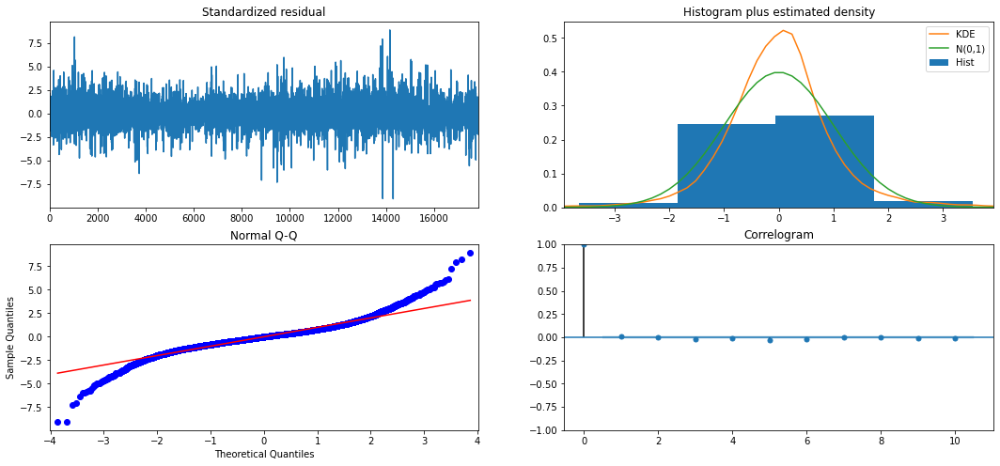

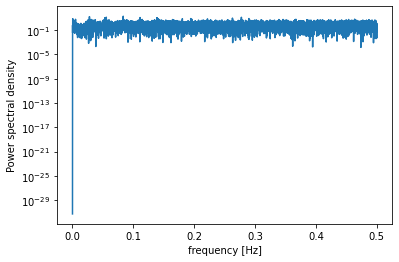

          freq        pow      delay
1488  0.083389  19.725786  11.991935
497   0.027852  16.781275  35.903421
990   0.055481  13.751626  18.024242
4951  0.277460  13.219766   3.604120
494   0.027684  13.052431  36.121457
495   0.027740  12.722840  36.048485
1981  0.111018  12.021609   9.007572
2479  0.138926  11.427585   7.198064
949   0.053183  11.298988  18.802950
991   0.055537  10.511361  18.006054
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -17970.263
Date:                                 Wed, 07 Oct 2020   AIC                          35964.525
Time:                                         18:08:58   BIC                          36057.998
Sample:                                              0   HQIC                         35995.276
                 

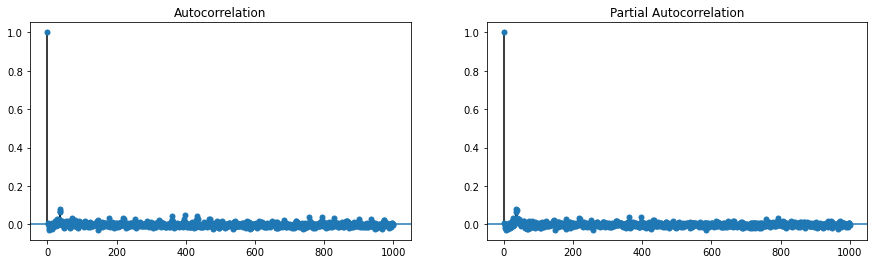

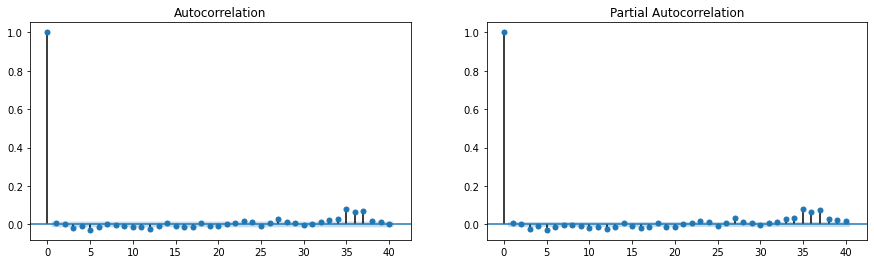

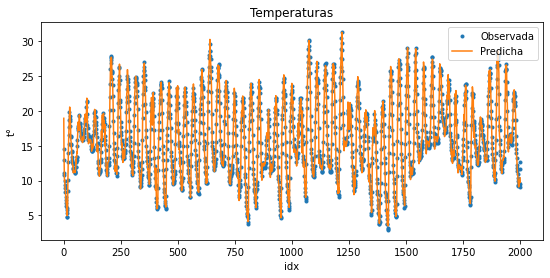

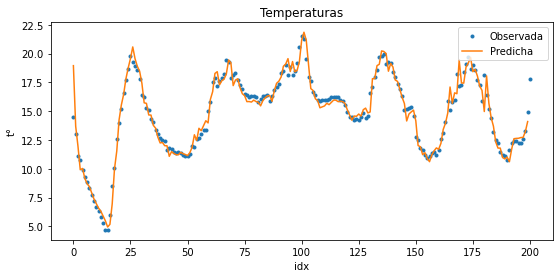

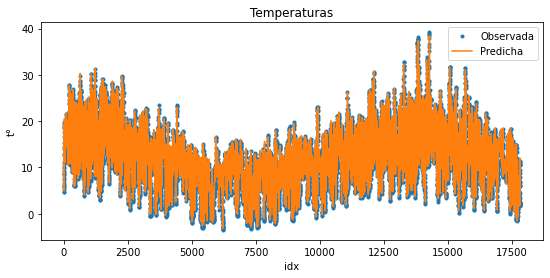

In [51]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
# retiramos ma18

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


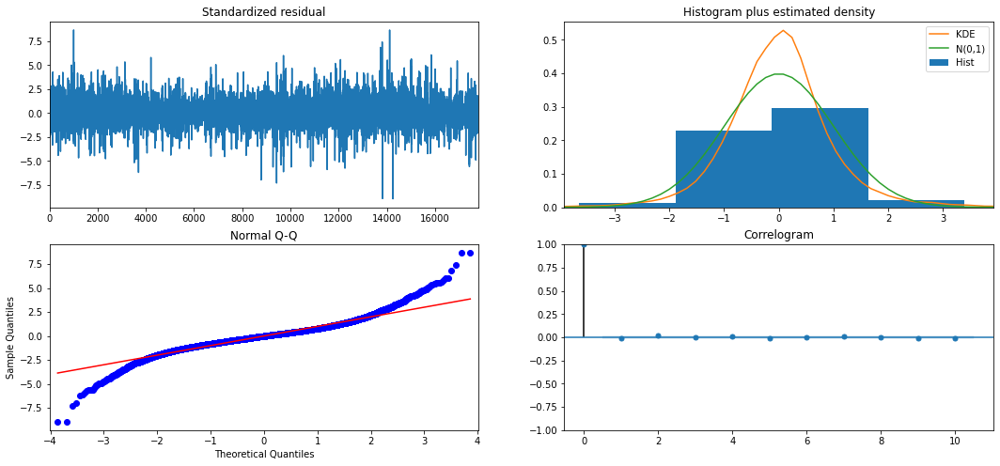

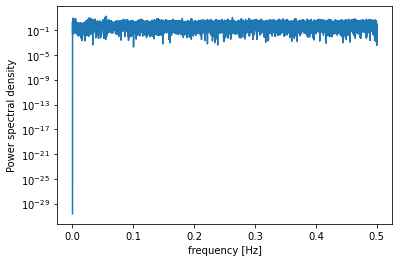

          freq        pow        delay
991   0.055537  17.205247    18.006054
4689  0.262777  11.035256     3.805502
949   0.053183  10.962578    18.802950
494   0.027684   9.761584    36.121457
17    0.000953   8.727635  1049.647059
5171  0.289789   7.741495     3.450783
3220  0.180453   7.683682     5.541615
89    0.004988   7.504742   200.494382
536   0.030038   7.479741    33.291045
497   0.027852   7.450103    35.903421
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -17996.863
Date:                                 Wed, 07 Oct 2020   AIC                          36015.725
Time:                                         22:51:36   BIC                          36101.386
Sample:                                              0   HQIC                         36043

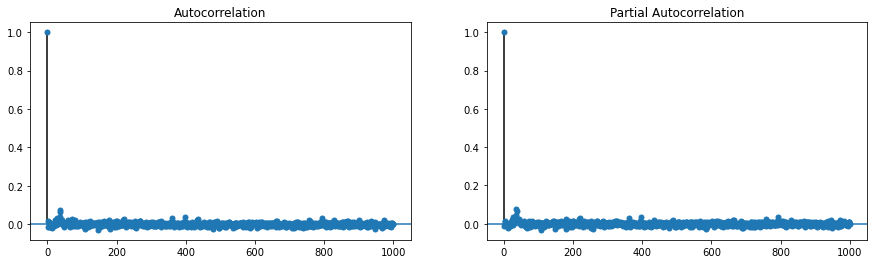

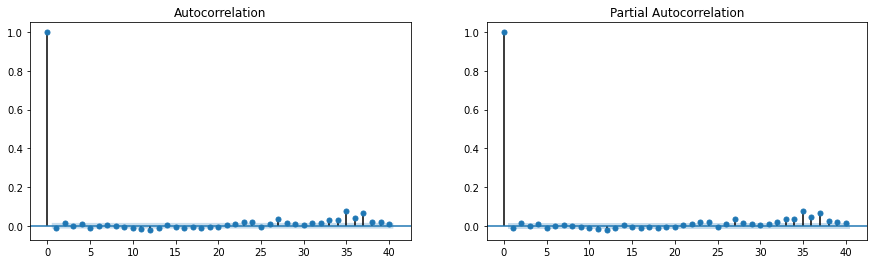

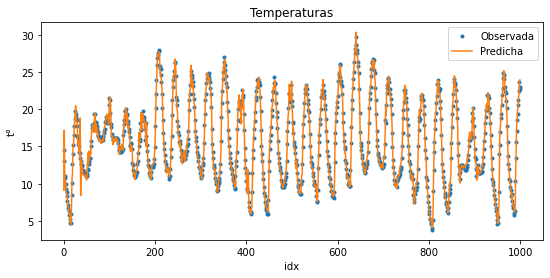

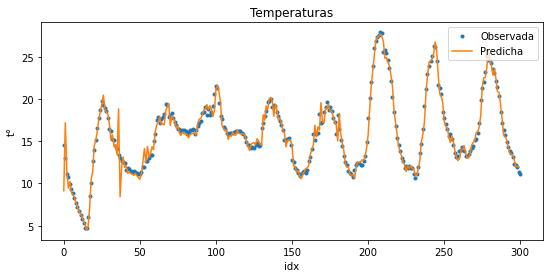

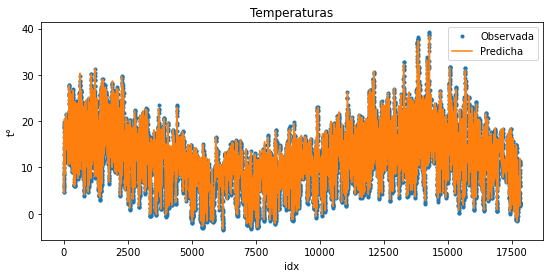

In [21]:
mysarimax2(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']],
         restriccion={'ma.S.L18':0})

In [ ]:
#retiramos ar18

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


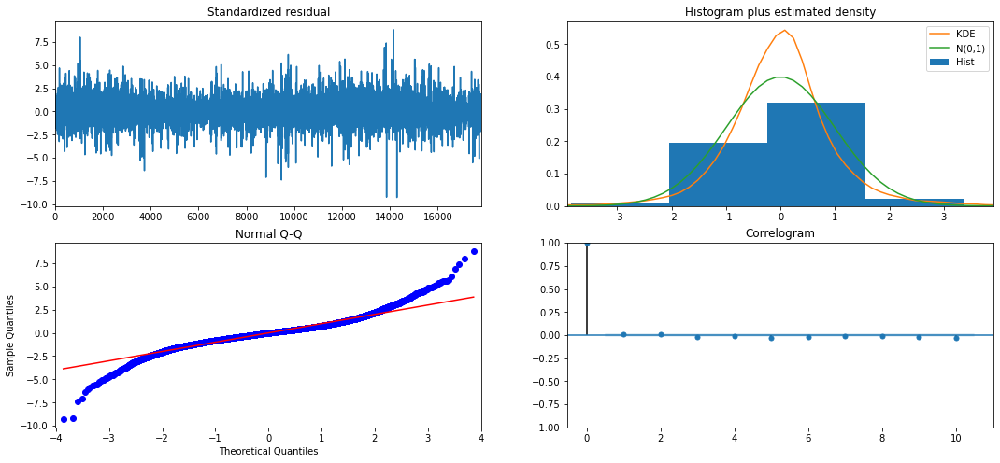

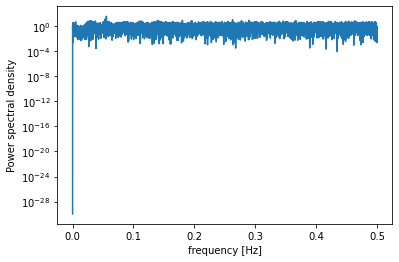

          freq        pow      delay
991   0.055537  35.105220  18.006054
949   0.053183  12.001705  18.802950
4689  0.262777   9.832783   3.805502
990   0.055481   8.442667  18.024242
5171  0.289789   8.174142   3.450783
3220  0.180453   7.759920   5.541615
2518  0.141112   7.667585   7.086577
4951  0.277460   6.943454   3.604120
3497  0.195976   6.924288   5.102659
544   0.030486   6.760111  32.801471
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -17907.358
Date:                            Wed, 07 Oct 2020   AIC                          35834.717
Time:                                    23:10:19   BIC                          35912.611
Sample:                                         0   HQIC                         35860.343
                                          - 178

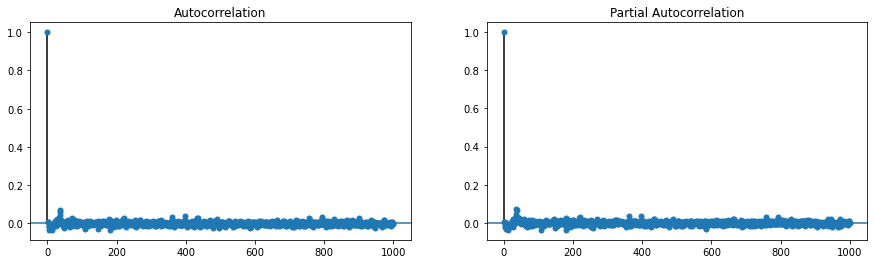

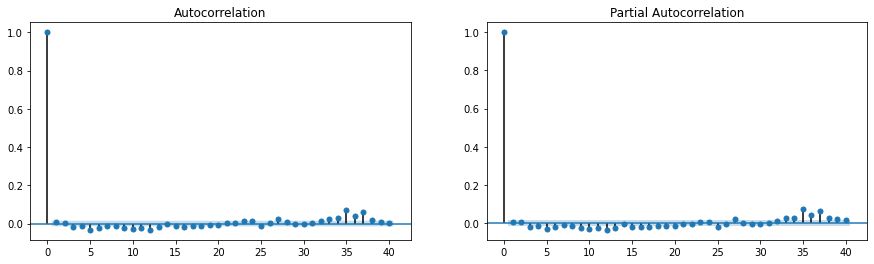

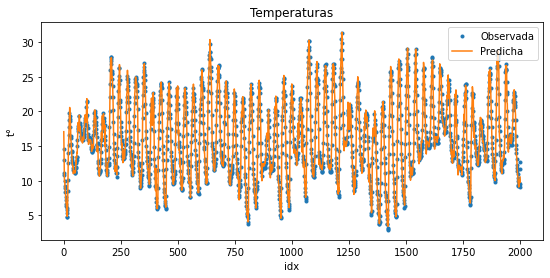

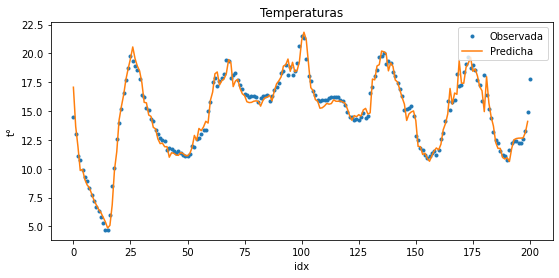

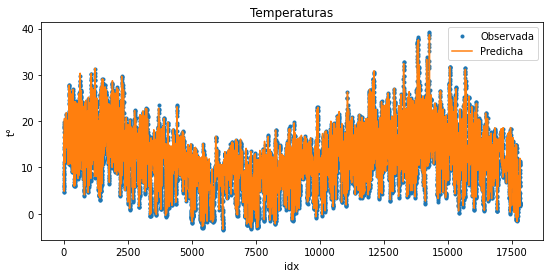

In [23]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#retiramos x3

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


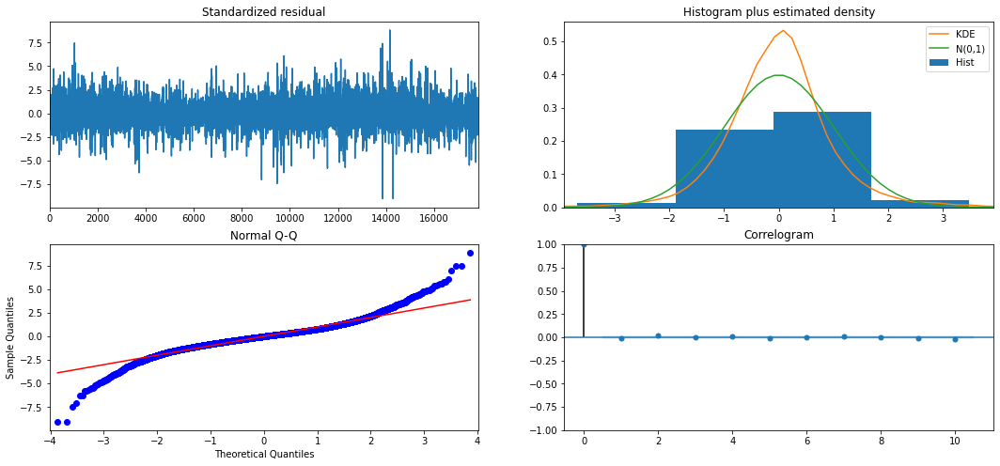

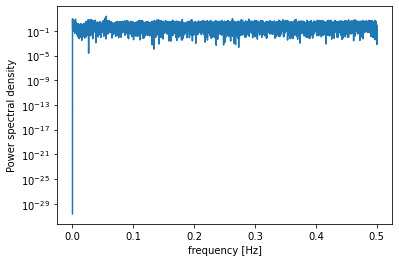

          freq        pow         delay
991   0.055537  23.767806     18.006054
949   0.053183  10.917855     18.802950
4689  0.262777   9.842050      3.805502
1     0.000056   8.707197  17844.000000
5171  0.289789   8.088899      3.450783
89    0.004988   7.900076    200.494382
3220  0.180453   7.363473      5.541615
12    0.000672   7.291407   1487.000000
6548  0.366958   7.151715      2.725107
536   0.030038   6.974366     33.291045
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -17846.073
Date:                            Wed, 07 Oct 2020   AIC                          35710.147
Time:                                    23:22:47   BIC                          35780.252
Sample:                                         0   HQIC                         35733.210
              

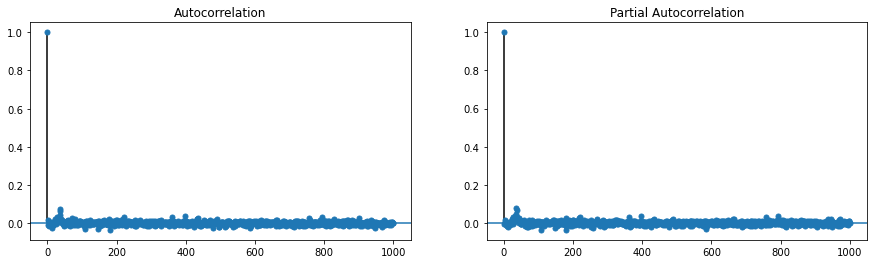

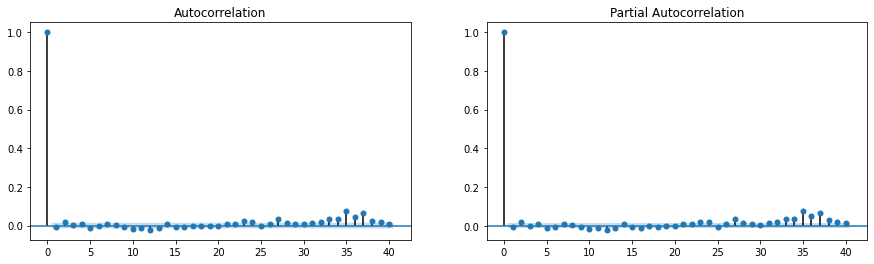

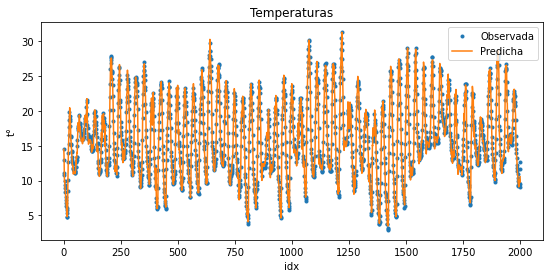

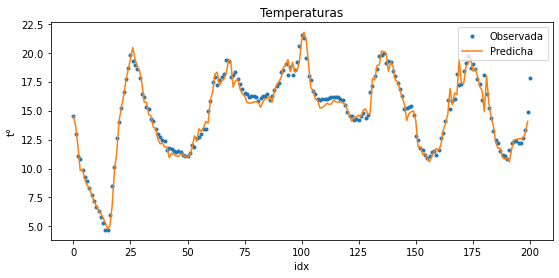

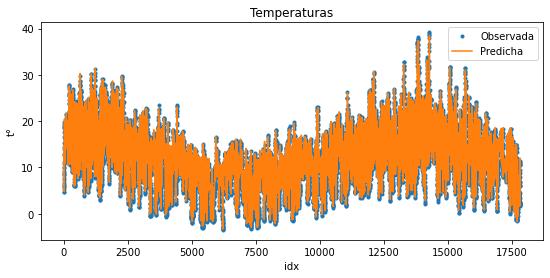

In [24]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

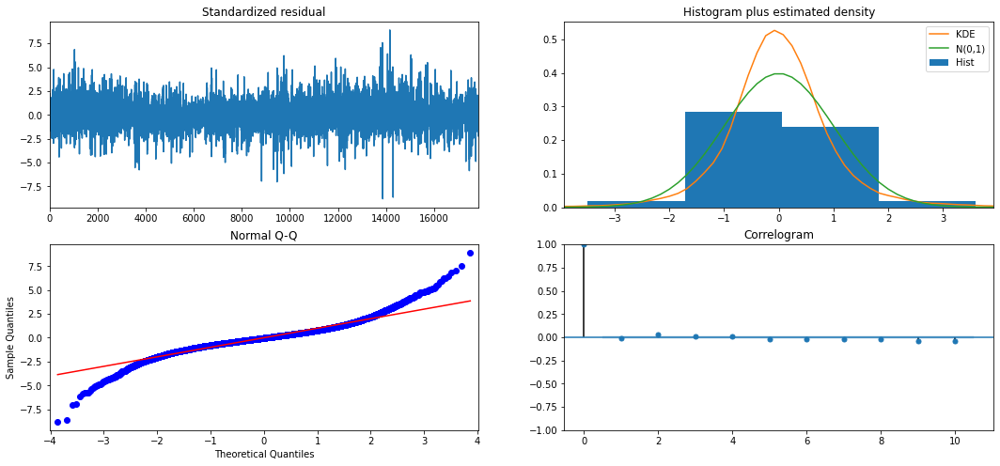

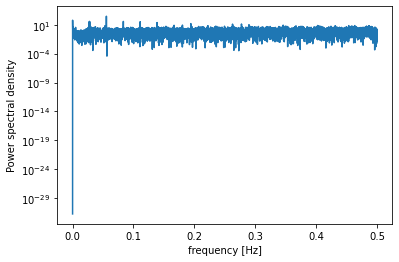

          freq         pow         delay
991   0.055537  315.643688     18.006054
1     0.000056   64.077172  17844.000000
990   0.055481   44.205495     18.024242
1488  0.083389   39.917487     11.991935
494   0.027684   39.525332     36.121457
497   0.027852   37.795857     35.903421
1982  0.111074   35.952571      9.003027
1981  0.111018   33.487903      9.007572
2479  0.138926   25.143999      7.198064
2     0.000112   23.152670   8922.000000
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(0, 0, 1, 36)   Log Likelihood              -18696.543
Date:                            Thu, 08 Oct 2020   AIC                          37409.087
Time:                                    00:08:41   BIC                          37471.402
Sample:                                         0   HQIC                         37429.587
   

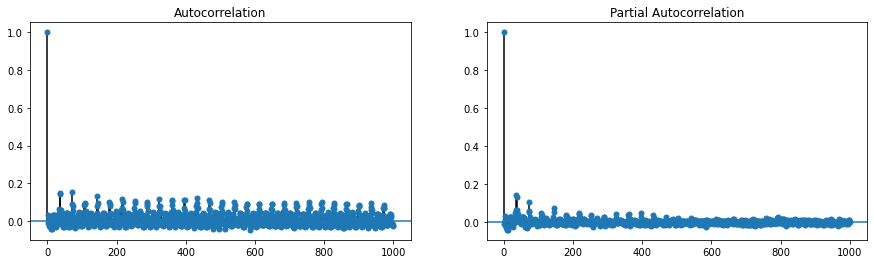

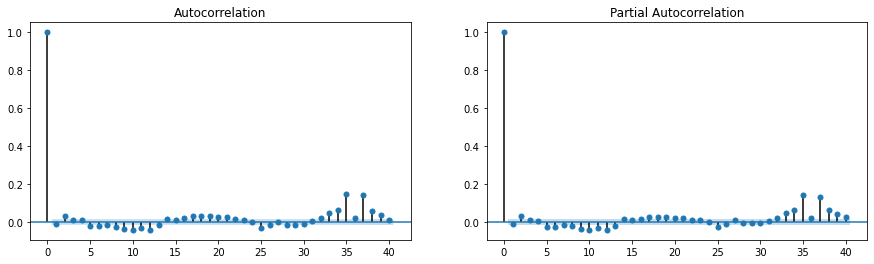

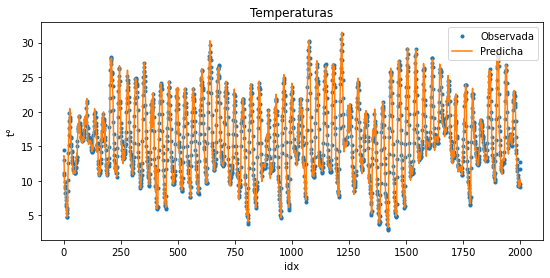

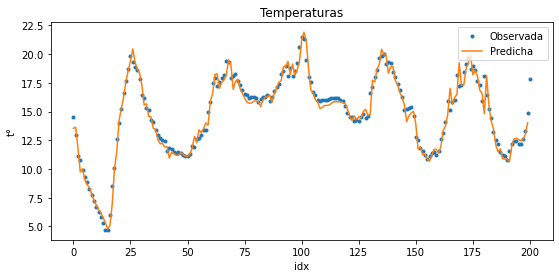

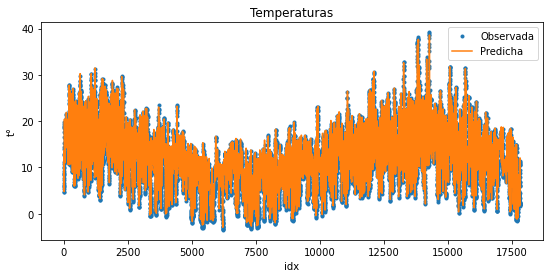

In [28]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


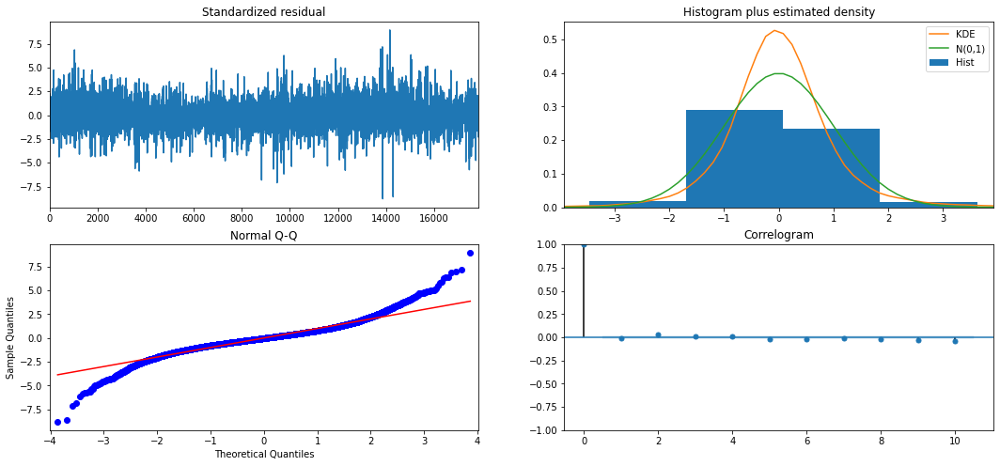

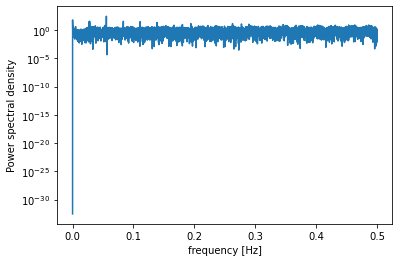

          freq         pow         delay
991   0.055537  278.474178     18.006054
1     0.000056   61.570161  17844.000000
990   0.055481   39.044367     18.024242
1488  0.083389   34.973358     11.991935
494   0.027684   34.652541     36.121457
497   0.027852   33.671682     35.903421
1982  0.111074   31.287721      9.003027
1981  0.111018   29.168105      9.007572
2     0.000112   22.297172   8922.000000
2479  0.138926   21.681391      7.198064
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(1, 0, [], 36)   Log Likelihood              -18615.073
Date:                             Thu, 08 Oct 2020   AIC                          37246.145
Time:                                     00:15:37   BIC                          37308.461
Sample:                                          0   HQIC                         37266.6

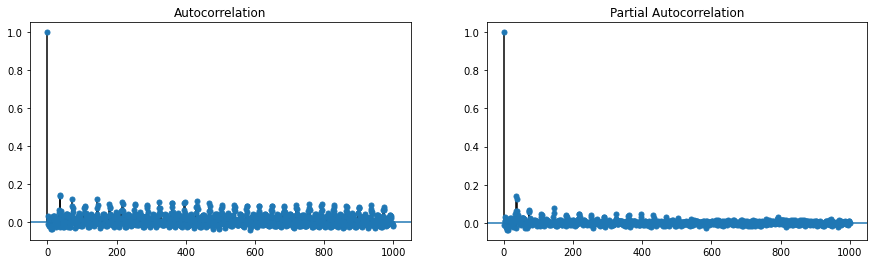

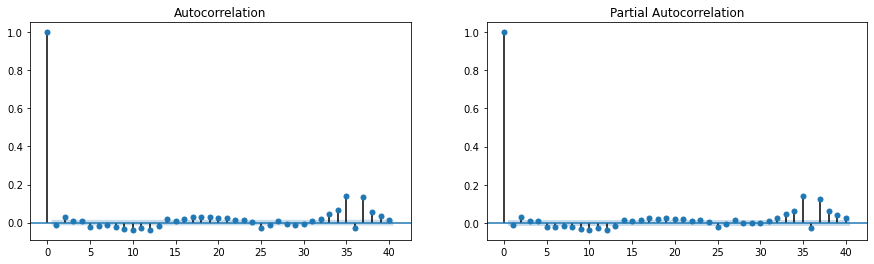

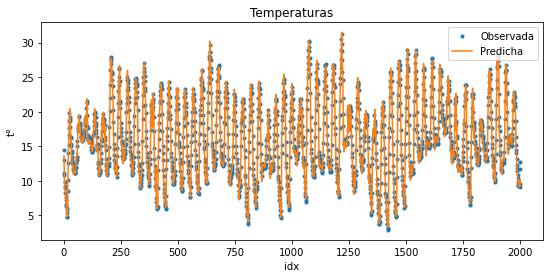

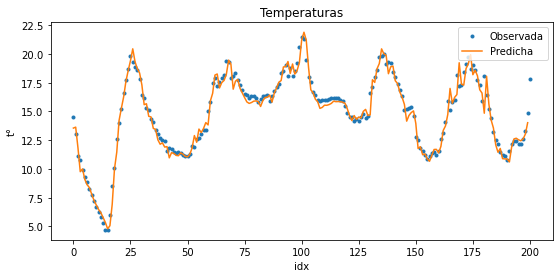

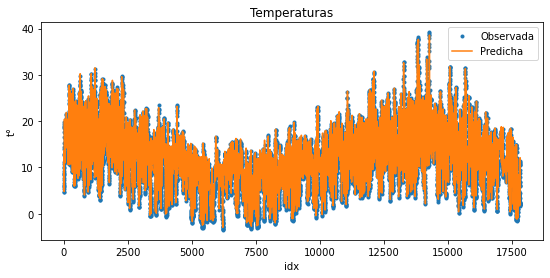

In [29]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

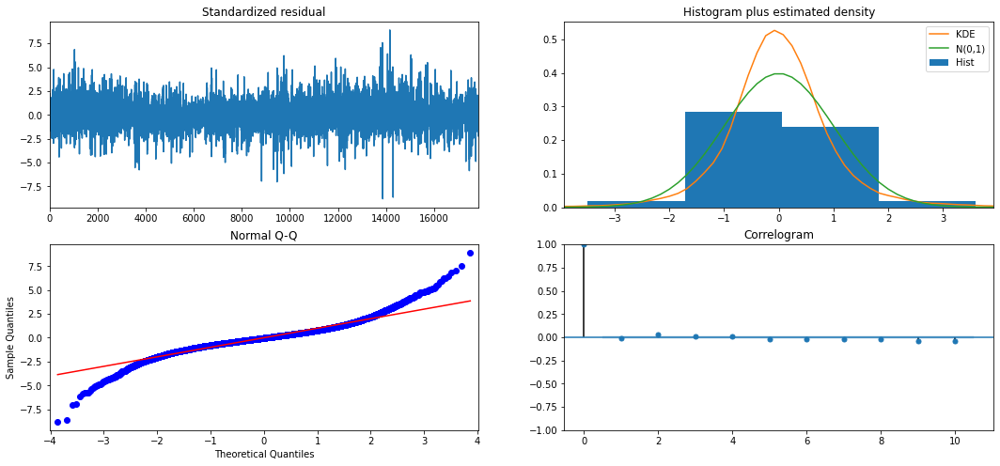

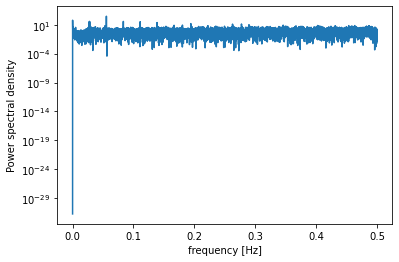

          freq         pow         delay
991   0.055537  315.643688     18.006054
1     0.000056   64.077172  17844.000000
990   0.055481   44.205495     18.024242
1488  0.083389   39.917487     11.991935
494   0.027684   39.525332     36.121457
497   0.027852   37.795857     35.903421
1982  0.111074   35.952571      9.003027
1981  0.111018   33.487903      9.007572
2479  0.138926   25.143999      7.198064
2     0.000112   23.152670   8922.000000
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(2, 0, 1)x(0, 0, 1, 36)   Log Likelihood              -18696.543
Date:                            Tue, 17 Nov 2020   AIC                          37409.087
Time:                                    11:16:54   BIC                          37471.402
Sample:                                         0   HQIC                         37429.587
   

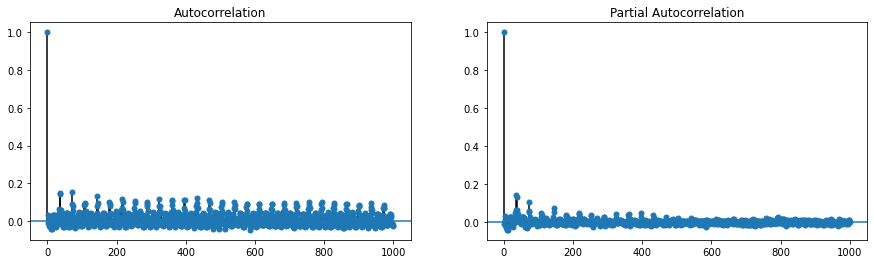

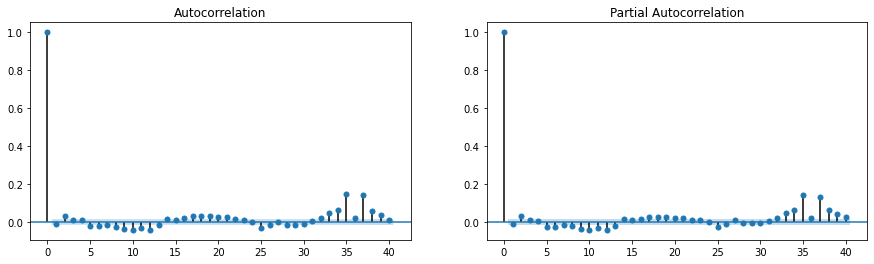

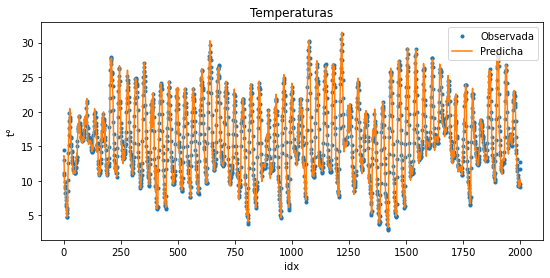

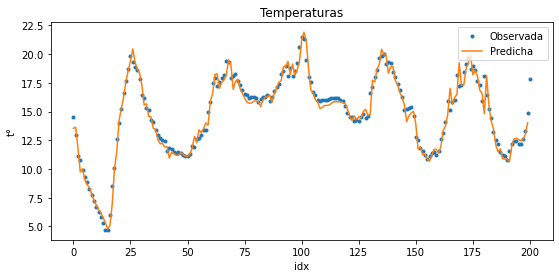

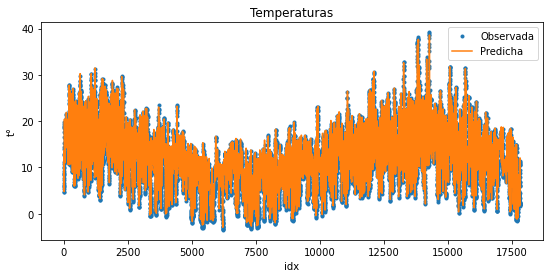

In [27]:
Res2=mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

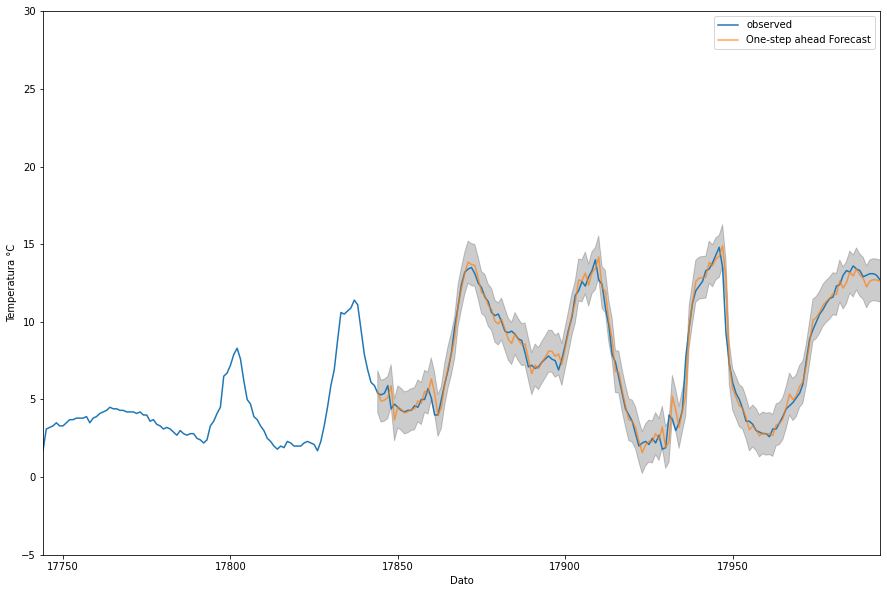

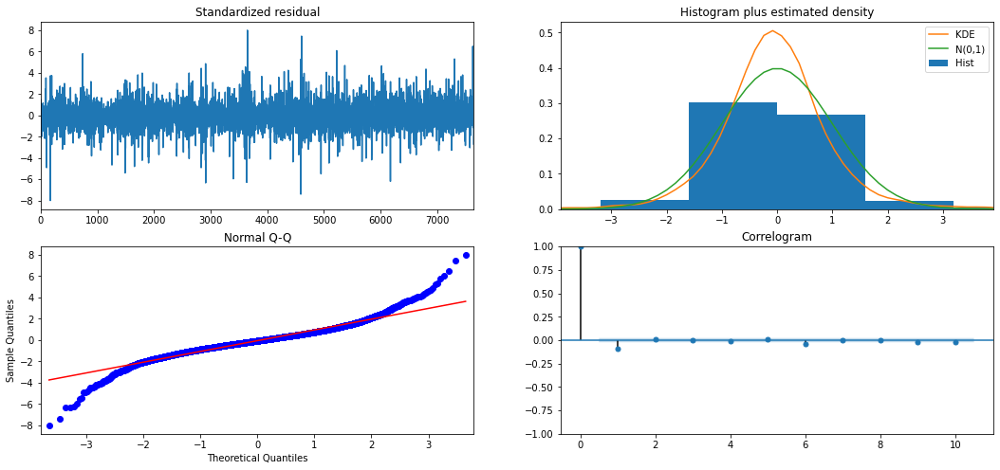

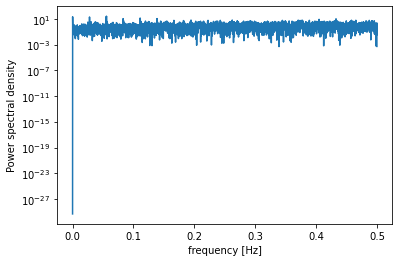

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7648
Model:             SARIMAX(2, 0, 1)x(0, 0, 1, 36)   Log Likelihood               -8096.410
Date:                            Tue, 17 Nov 2020   AIC                          16208.820
Time:                                    11:17:07   BIC                          16264.357
Sample:                                         0   HQIC                         16227.872
                                           - 7648                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2128      0.010     21.279      0.000       0.193       0.232
Sen_hora      -3.3387      0.080   

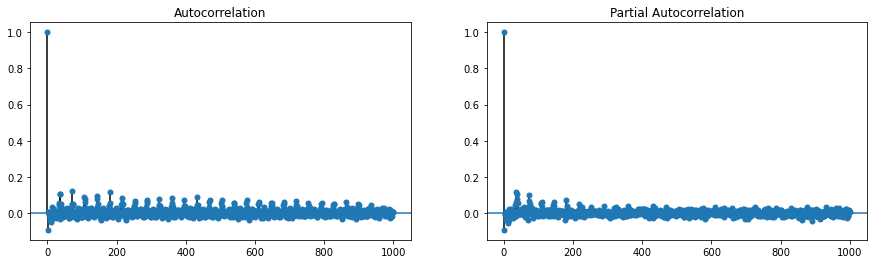

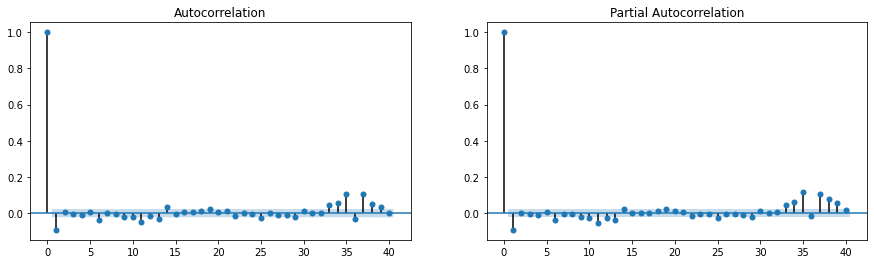

In [28]:
predecir_1(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17844   5.4 -0.103842        False        False        False
17845   5.3  0.406770        False        False        False
17846   5.4  0.442319        False        False        False
17847   5.9  0.774394        False        False        False
17848   4.4 -1.483376         True        False        False
...     ...       ...          ...          ...          ...
25487  23.4 -0.799717        False        False        False
25488  23.7  1.331912         True        False        False
25489  23.1 -0.029829        False        False        False
25490  20.4 -1.898706         True        False        False
25491  18.7  0.011397        False        False        False

[7648 rows x 5 columns]
Promedio Valor Absoluto Error: 0.4965618679828748
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    11.401674     1.778243     0.366109


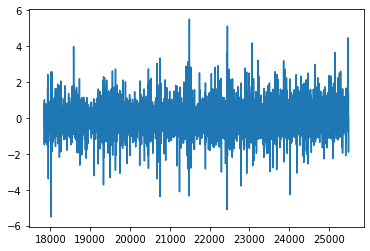

In [29]:
predecir_3(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

In [ ]:
#Comenzamos denuevo Esta vez sin sinusoides. 

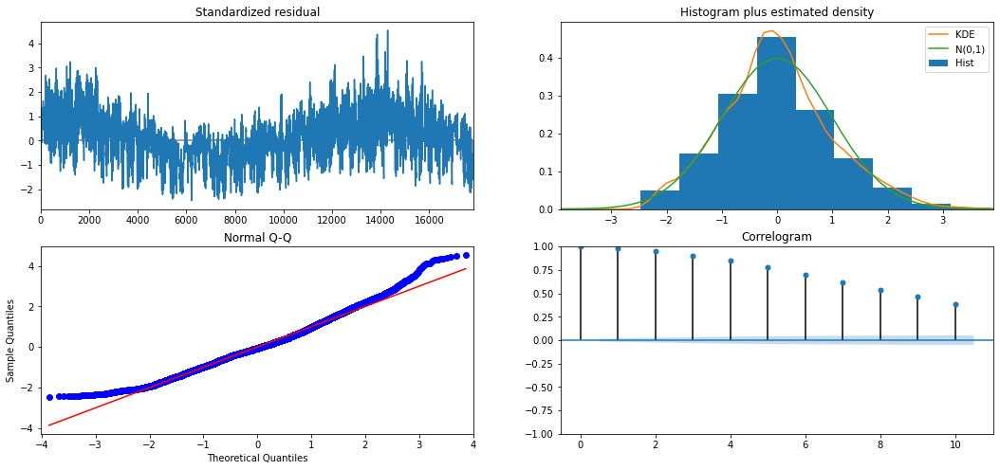

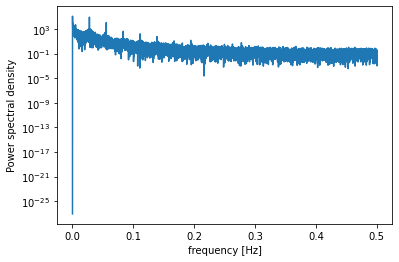

         freq            pow         delay
1    0.000056  123536.895513  17844.000000
496  0.027796   87843.768370     35.975806
495  0.027740   70491.997097     36.048485
2    0.000112   43840.908101   8922.000000
497  0.027852   33669.394773     35.903421
494  0.027684   32673.366763     36.121457
3    0.000168   17399.146457   5948.000000
991  0.055537   11703.706154     18.006054
493  0.027628   10360.489677     36.194726
12   0.000672    8676.800782   1487.000000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:                        SARIMAX   Log Likelihood              -57559.484
Date:                Thu, 08 Oct 2020   AIC                         115122.969
Time:                        10:51:24   BIC                         115138.547
Sample:                             0   HQIC                        115128.094
                              - 17844                

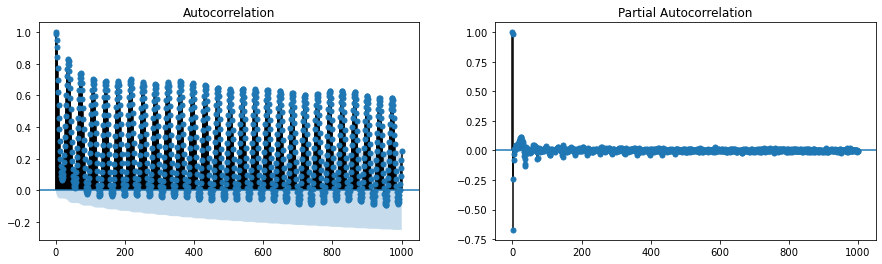

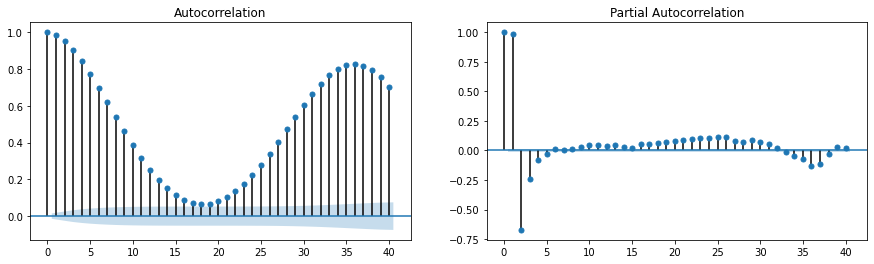

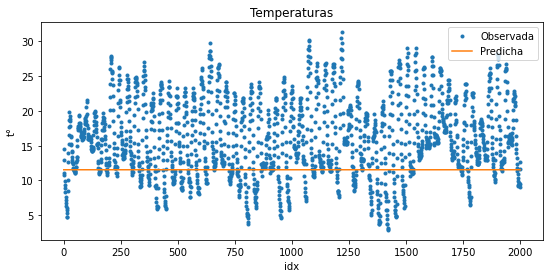

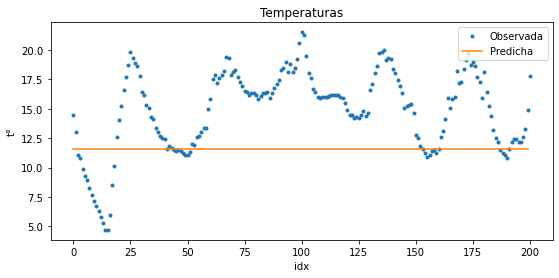

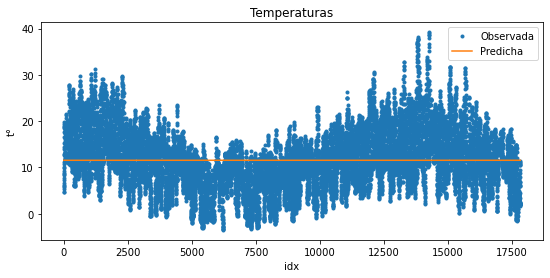

In [34]:
mysarima(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [ ]:
#ANalicis Espectral

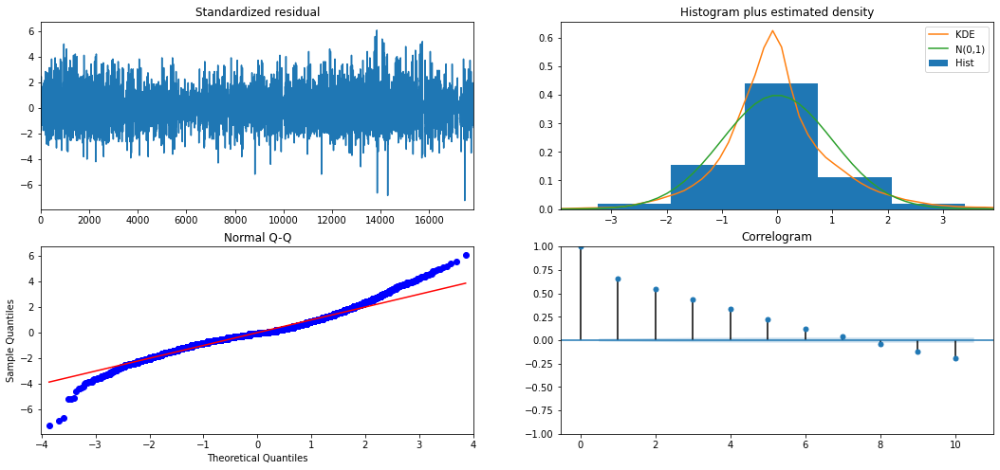

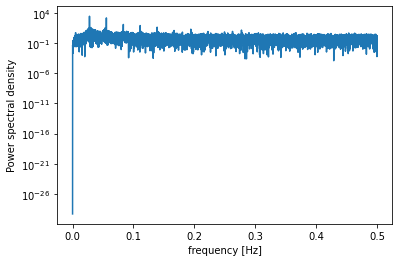

          freq          pow      delay
496   0.027796  2676.443079  35.975806
495   0.027740  2132.784327  36.048485
991   0.055537  1407.946278  18.006054
497   0.027852  1027.112862  35.903421
494   0.027684   983.275170  36.121457
493   0.027628   309.698521  36.194726
990   0.055481   196.860903  18.024242
1488  0.083389   116.732672  11.991935
498   0.027909    89.495243  35.831325
500   0.028021    87.008255  35.688000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -25705.352
Date:                Thu, 08 Oct 2020   AIC                          51414.703
Time:                        10:51:56   BIC                          51430.282
Sample:                             0   HQIC                         51419.828
                              - 17844                                         
Covariance Type:  

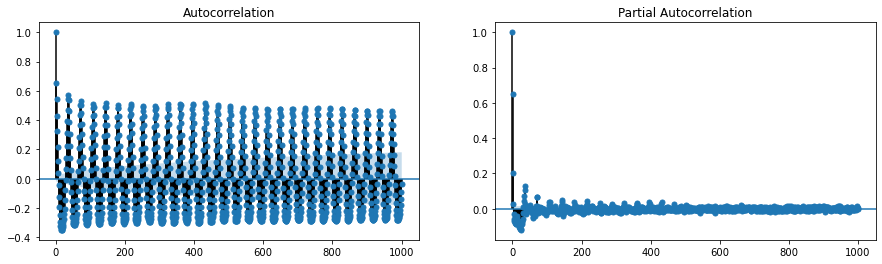

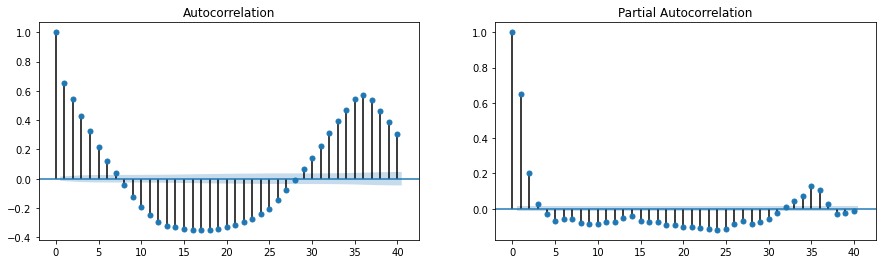

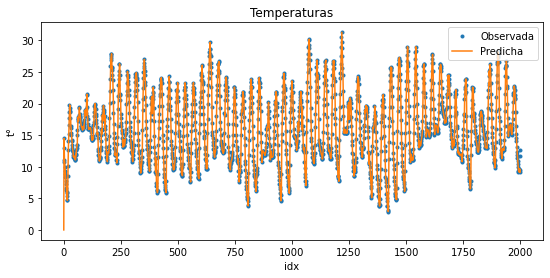

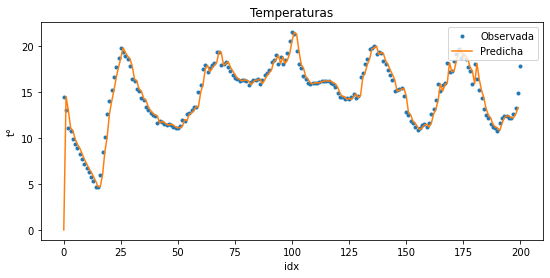

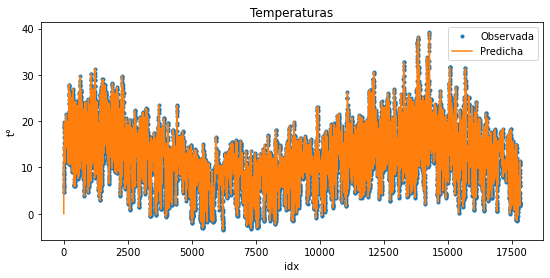

In [35]:
mysarima(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [ ]:
#AR o MA 1

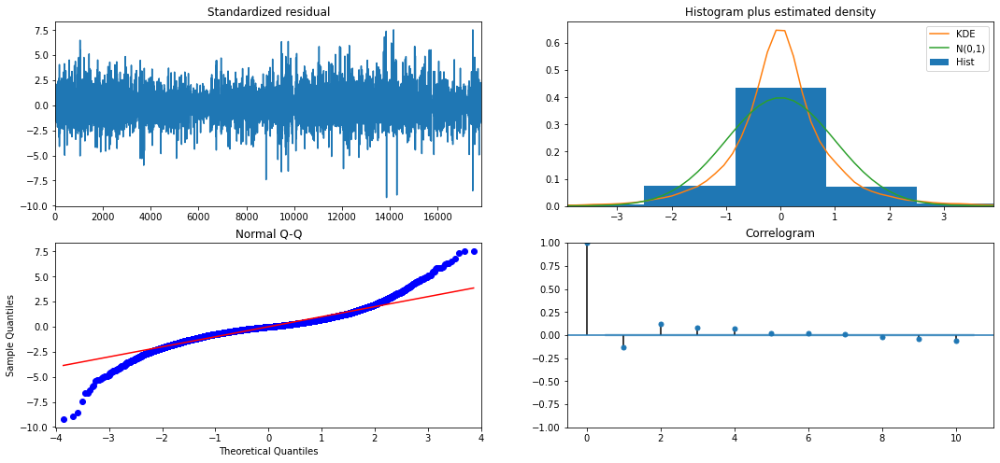

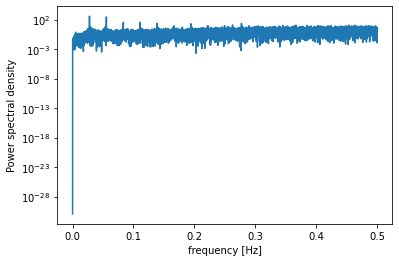

          freq         pow      delay
496   0.027796  364.152685  35.975806
495   0.027740  289.198973  36.048485
991   0.055537  275.863175  18.006054
497   0.027852  137.866455  35.903421
494   0.027684  132.726137  36.121457
493   0.027628   41.494584  36.194726
990   0.055481   39.481159  18.024242
1982  0.111074   33.587627   9.003027
1488  0.083389   33.036231  11.991935
1981  0.111018   32.026542   9.007572
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -20608.115
Date:                Thu, 08 Oct 2020   AIC                          41222.230
Time:                        10:52:39   BIC                          41245.598
Sample:                             0   HQIC                         41229.918
                              - 17844                                         
Covariance Type:             

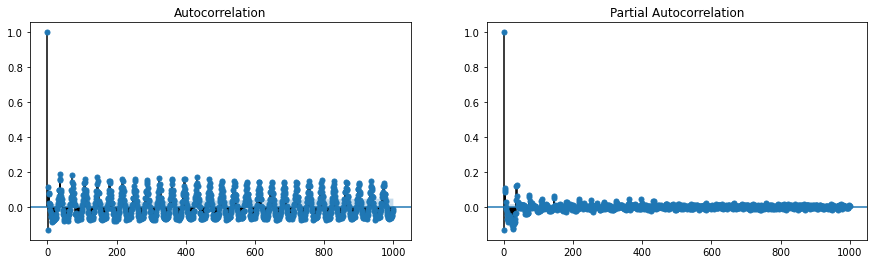

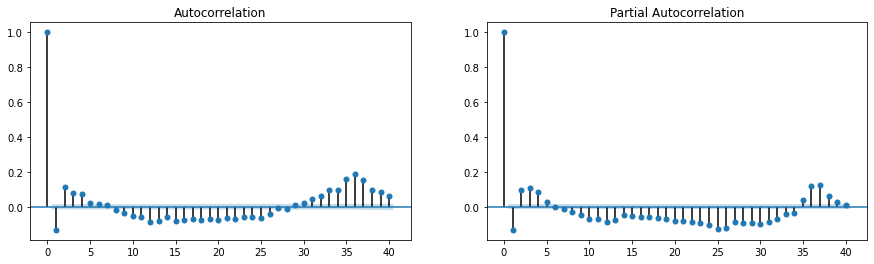

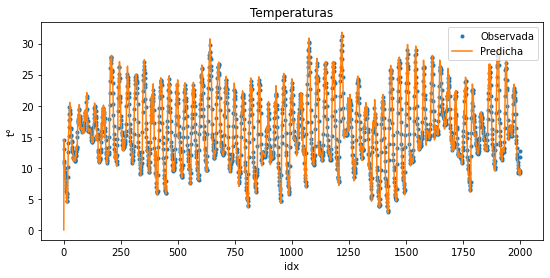

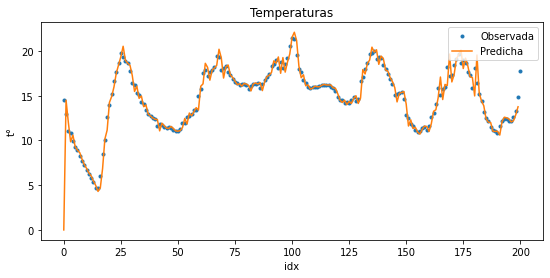

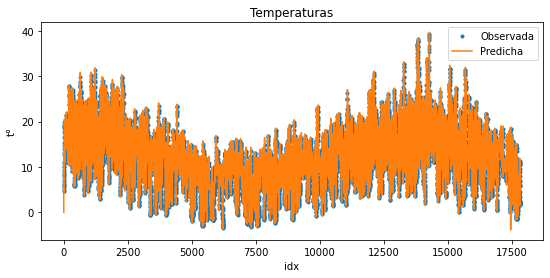

In [36]:
mysarima(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

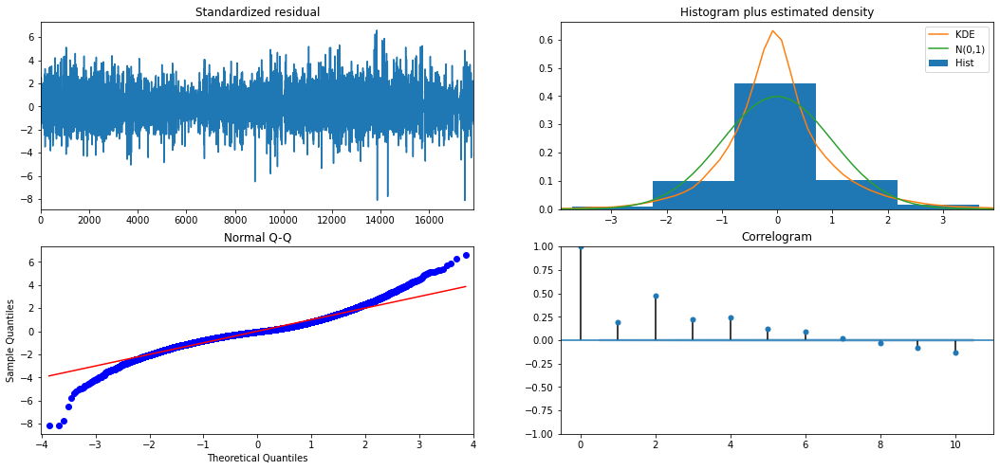

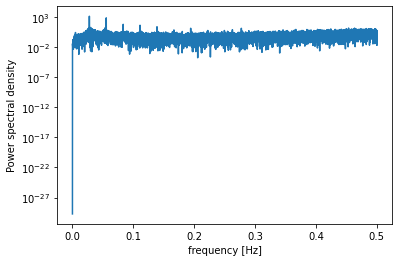

          freq          pow      delay
496   0.027796  1250.667957  35.975806
495   0.027740   994.087258  36.048485
991   0.055537   669.621522  18.006054
497   0.027852   478.328988  35.903421
494   0.027684   457.661954  36.121457
493   0.027628   143.757375  36.194726
990   0.055481    94.148309  18.024242
1488  0.083389    56.814930  11.991935
498   0.027909    41.587787  35.831325
500   0.028021    40.428038  35.688000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -22706.021
Date:                Thu, 08 Oct 2020   AIC                          45418.041
Time:                        10:52:57   BIC                          45441.409
Sample:                             0   HQIC                         45425.729
                              - 17844                                         
Covariance Type:  

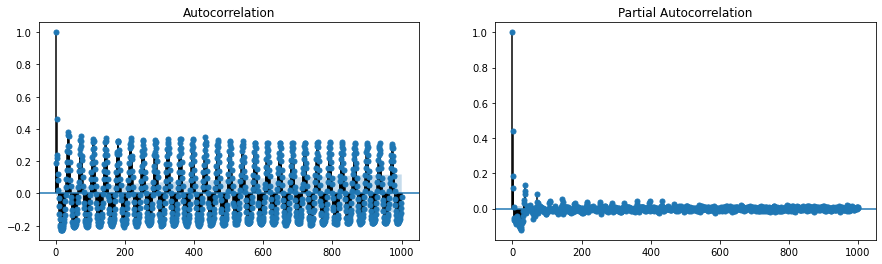

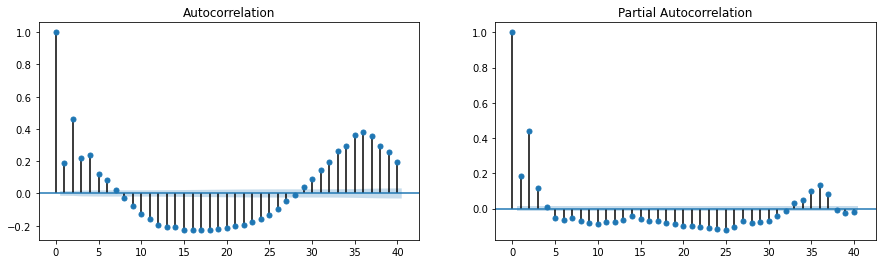

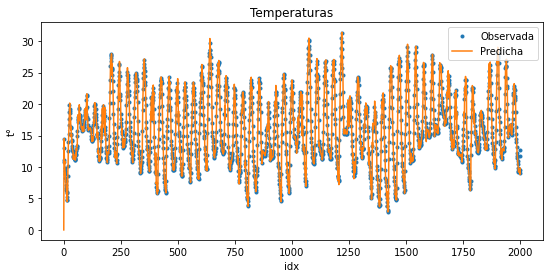

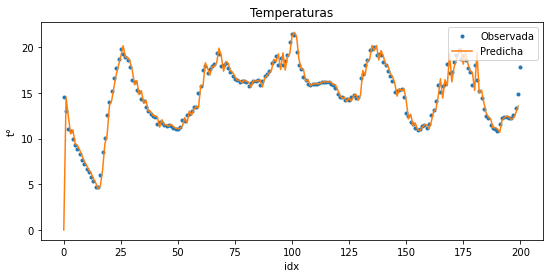

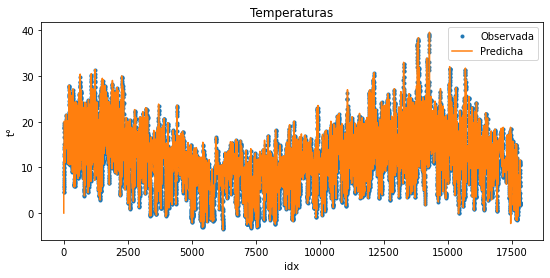

In [37]:
mysarima(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

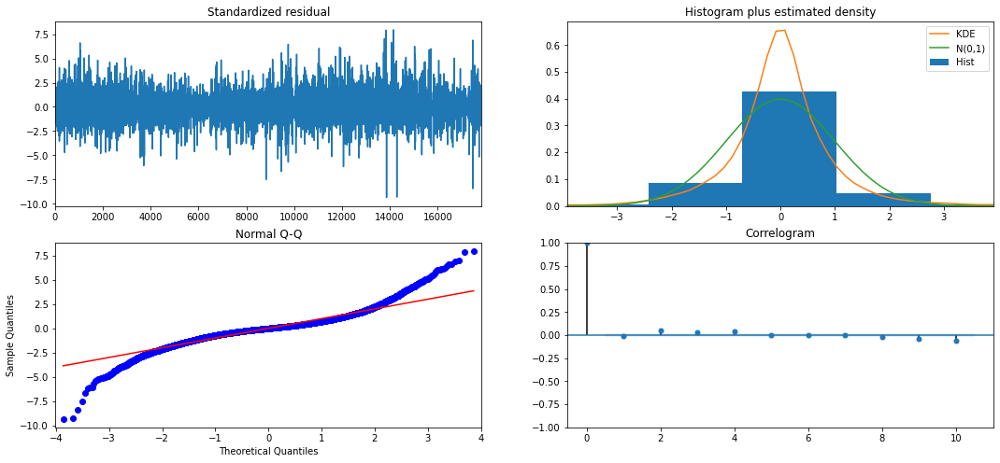

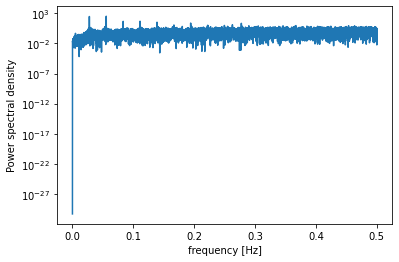

          freq         pow      delay
991   0.055537  335.471771  18.006054
496   0.027796  301.375360  35.975806
495   0.027740  240.886753  36.048485
497   0.027852  113.901897  35.903421
494   0.027684  110.564798  36.121457
1982  0.111074   49.756216   9.003027
990   0.055481   47.989919  18.024242
1488  0.083389   47.528164  11.991935
1981  0.111018   46.997864   9.007572
493   0.027628   34.642088  36.194726
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17844
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -20258.811
Date:                Thu, 08 Oct 2020   AIC                          40525.623
Time:                        10:53:22   BIC                          40556.780
Sample:                             0   HQIC                         40535.873
                              - 17844                                         
Covariance Type:             

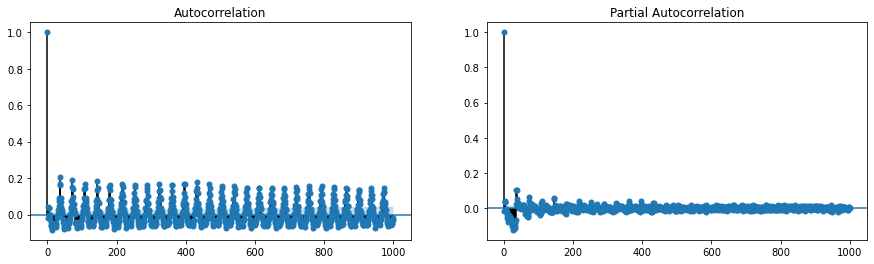

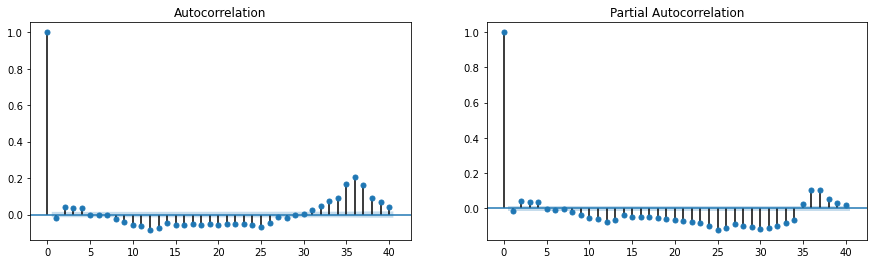

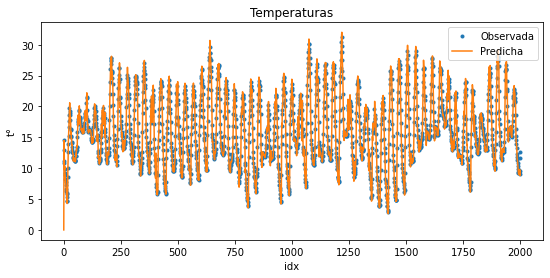

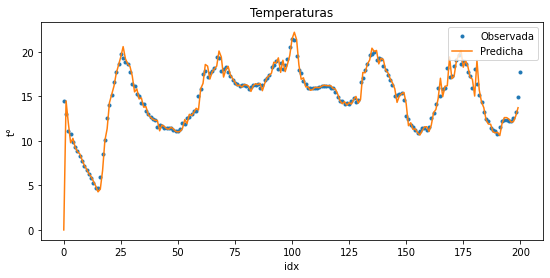

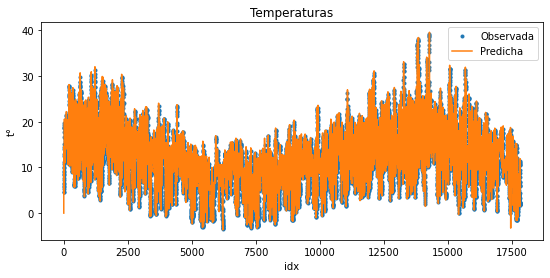

In [38]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [ ]:
#Elemento 24h:

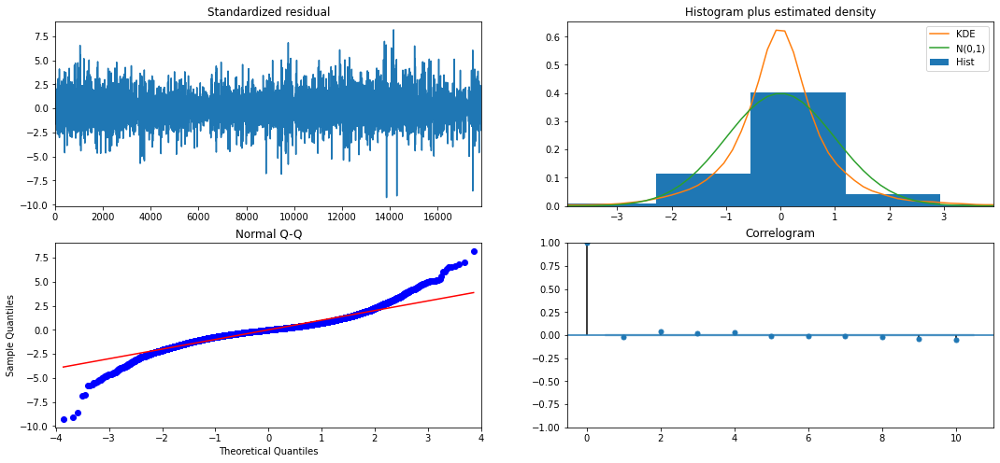

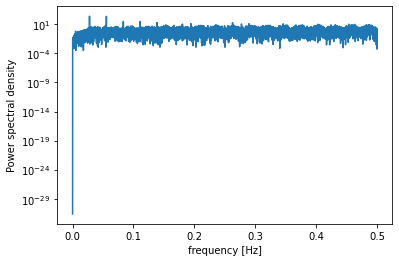

          freq         pow      delay
496   0.027796  238.568561  35.975806
991   0.055537  229.895433  18.006054
495   0.027740  189.813616  36.048485
497   0.027852   90.038414  35.903421
494   0.027684   87.039213  36.121457
990   0.055481   33.136503  18.024242
1488  0.083389   29.730410  11.991935
1982  0.111074   29.589033   9.003027
1981  0.111018   28.421319   9.007572
493   0.027628   27.195557  36.194726
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 36)   Log Likelihood              -19765.840
Date:                             Thu, 08 Oct 2020   AIC                          39541.681
Time:                                     10:55:21   BIC                          39580.628
Sample:                                          0   HQIC                         39554.494
                              

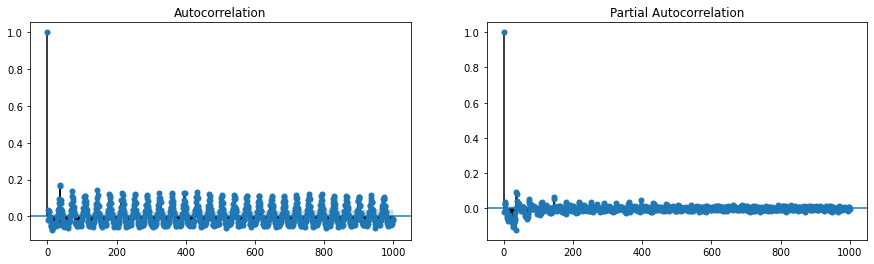

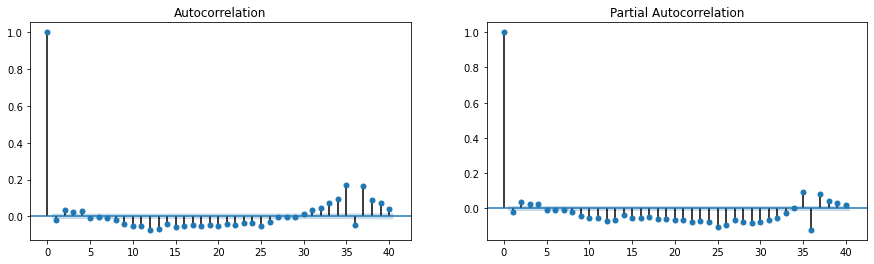

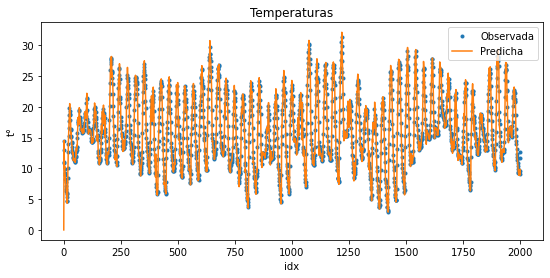

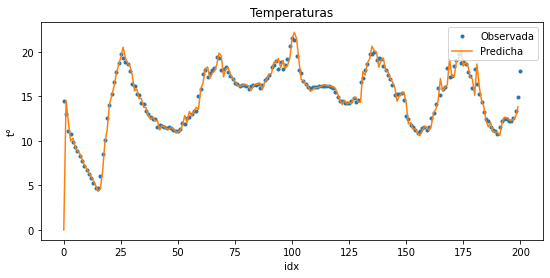

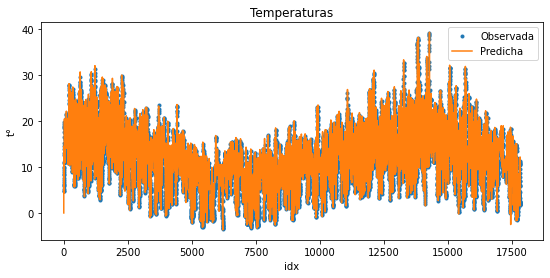

In [39]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,0,60*24/Intervalo))

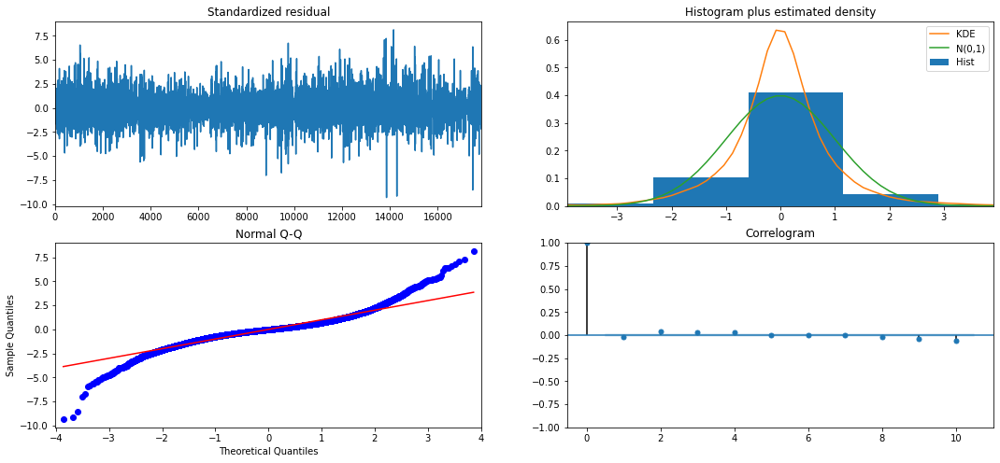

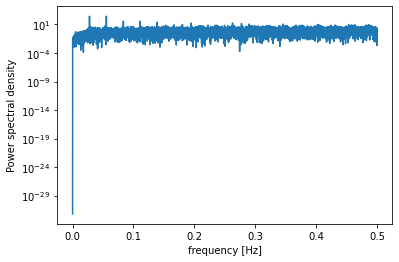

          freq         pow      delay
991   0.055537  274.151603  18.006054
496   0.027796  266.146850  35.975806
495   0.027740  212.225136  36.048485
497   0.027852  100.496024  35.903421
494   0.027684   97.355280  36.121457
990   0.055481   39.373831  18.024242
1982  0.111074   37.624272   9.003027
1488  0.083389   37.001994  11.991935
1981  0.111018   35.839544   9.007572
493   0.027628   30.456350  36.194726
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 36)   Log Likelihood              -19916.573
Date:                            Thu, 08 Oct 2020   AIC                          39843.146
Time:                                    10:56:56   BIC                          39882.093
Sample:                                         0   HQIC                         39855.959
                                    

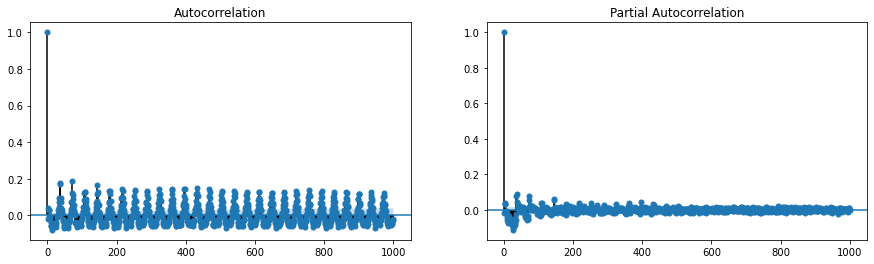

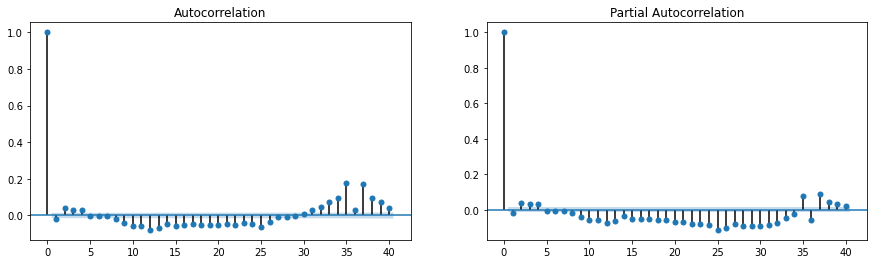

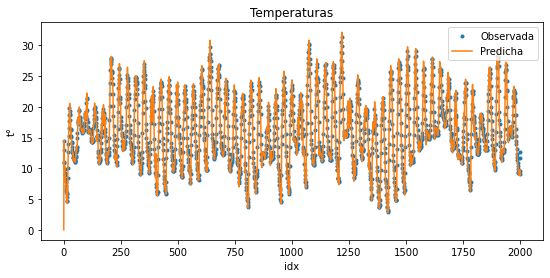

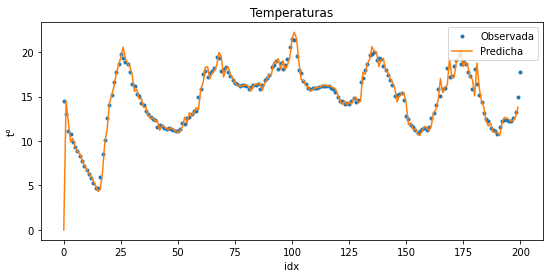

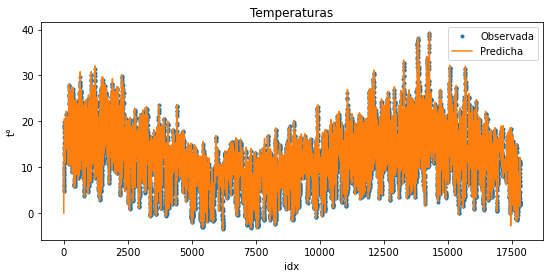

In [40]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,1,60*24/Intervalo))

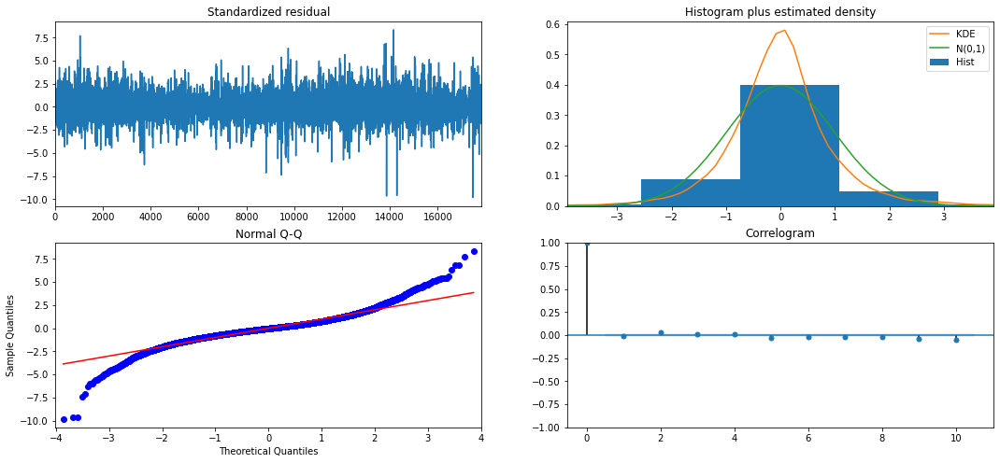

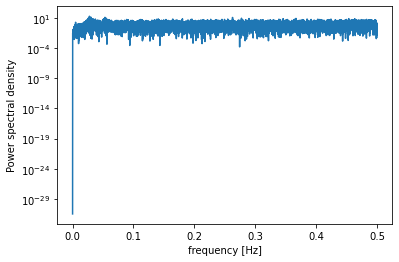

          freq        pow      delay
494   0.027684  18.046813  36.121457
536   0.030038  12.861638  33.291045
497   0.027852  12.445383  35.903421
493   0.027628  12.436453  36.194726
949   0.053183  11.943456  18.802950
4689  0.262777  11.384807   3.805502
495   0.027740   8.992451  36.048485
496   0.027796   8.536377  35.975806
4951  0.277460   8.442470   3.604120
991   0.055537   8.241121  18.006054
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -18324.397
Date:                            Thu, 08 Oct 2020   AIC                          36660.795
Time:                                    11:02:16   BIC                          36707.531
Sample:                                         0   HQIC                         36676.170
                                          - 178

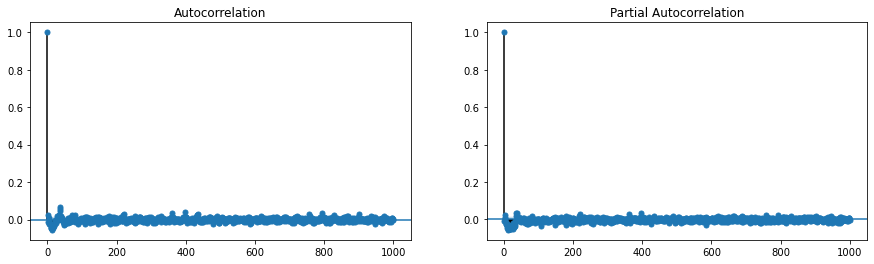

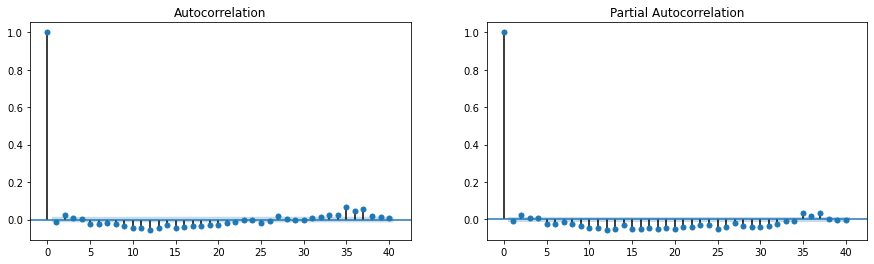

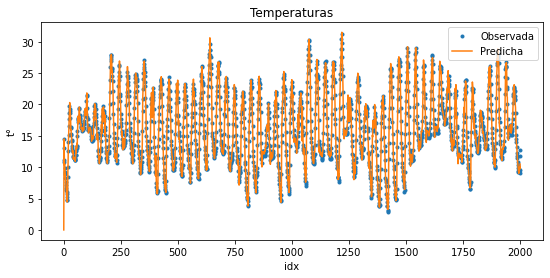

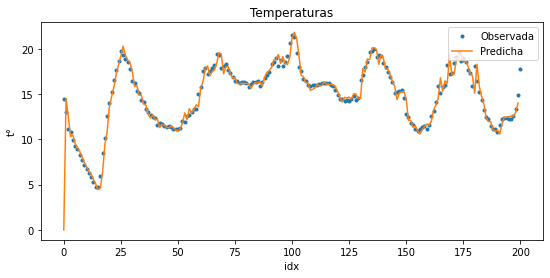

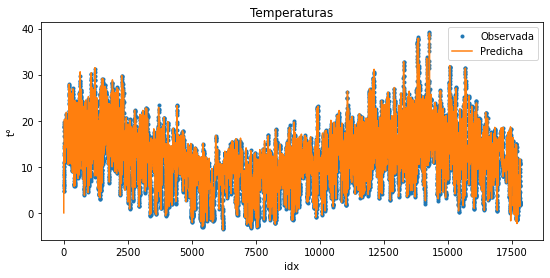

In [41]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo))

In [ ]:
#Componente de medio dia

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


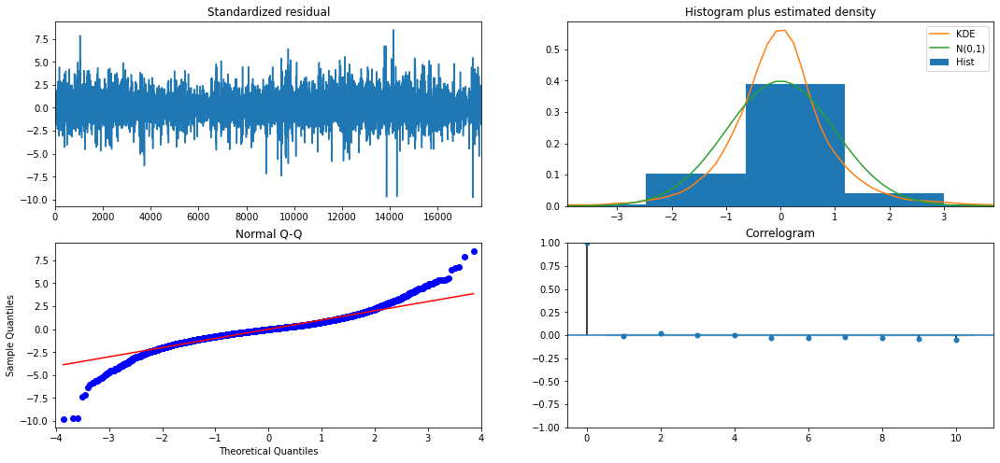

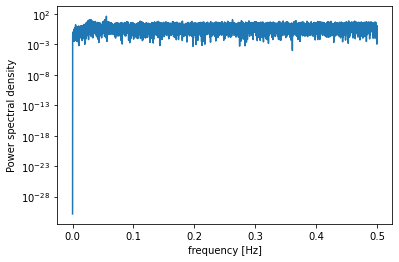

          freq        pow      delay
991   0.055537  42.702105  18.006054
536   0.030038  12.335291  33.291045
949   0.053183  12.002737  18.802950
494   0.027684  11.586246  36.121457
4689  0.262777  11.514898   3.805502
990   0.055481  10.630577  18.024242
493   0.027628   8.632210  36.194726
457   0.025611   8.447568  39.045952
4951  0.277460   8.268009   3.604120
6548  0.366958   8.031362   2.725107
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18348.575
Date:                                 Thu, 08 Oct 2020   AIC                          36713.150
Time:                                         11:27:06   BIC                          36775.465
Sample:                                              0   HQIC                         36733.651
                 

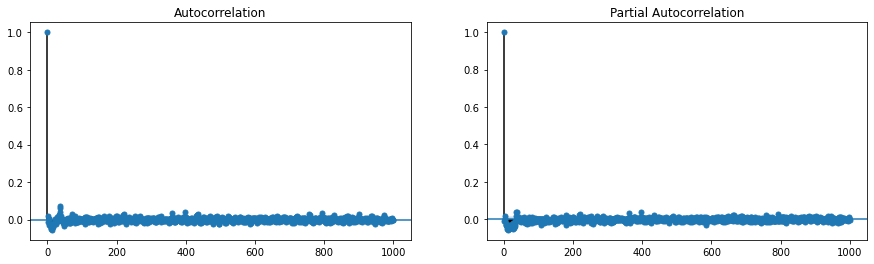

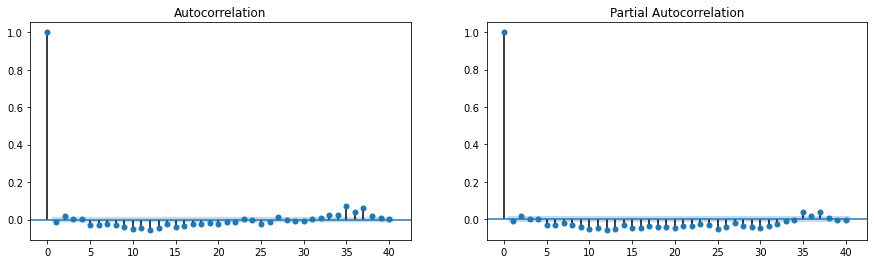

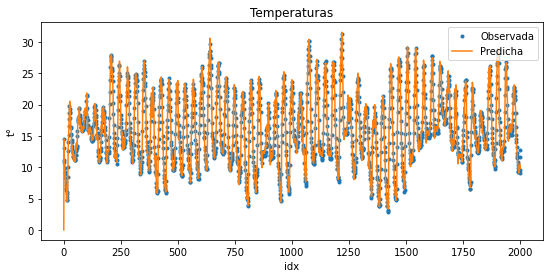

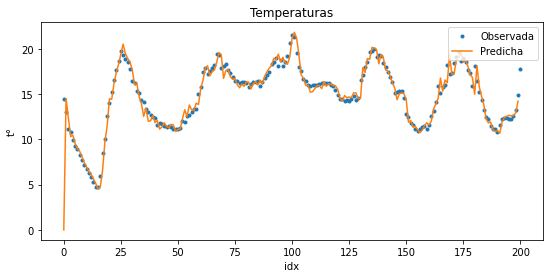

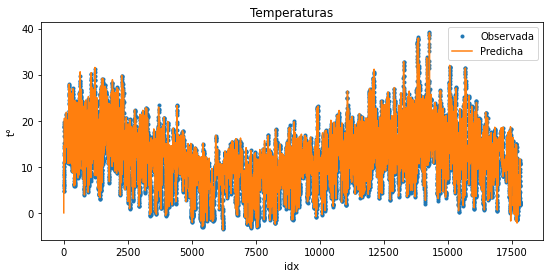

In [42]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo))

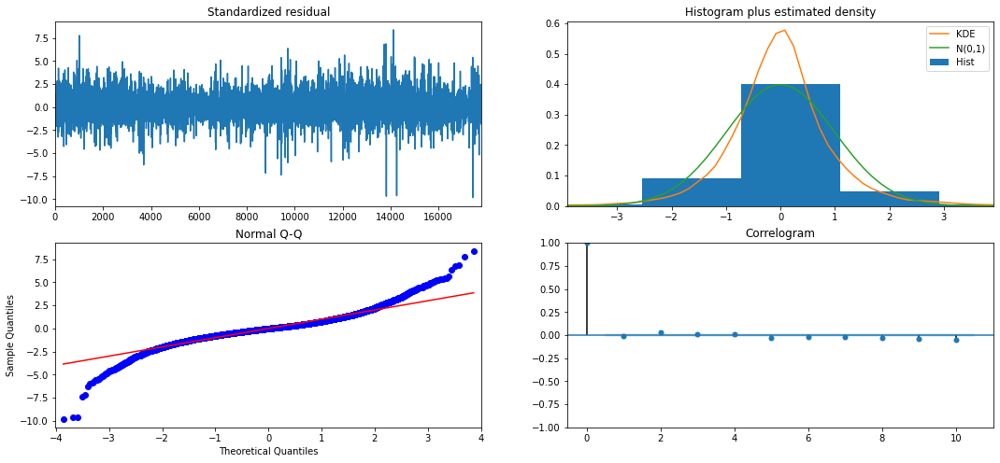

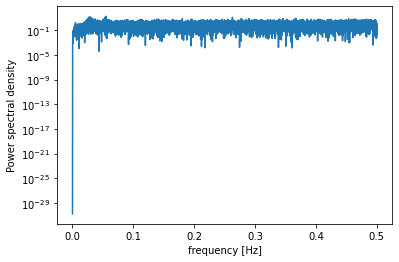

          freq        pow      delay
991   0.055537  17.888833  18.006054
494   0.027684  14.682728  36.121457
536   0.030038  12.482511  33.291045
949   0.053183  12.223907  18.802950
4689  0.262777  11.878394   3.805502
493   0.027628  10.293479  36.194726
497   0.027852   9.869273  35.903421
6548  0.366958   8.648918   2.725107
457   0.025611   8.517833  39.045952
4951  0.277460   8.185173   3.604120
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18289.913
Date:                                 Thu, 08 Oct 2020   AIC                          36593.826
Time:                                         12:07:14   BIC                          36648.337
Sample:                                              0   HQIC                         36611.761
                 

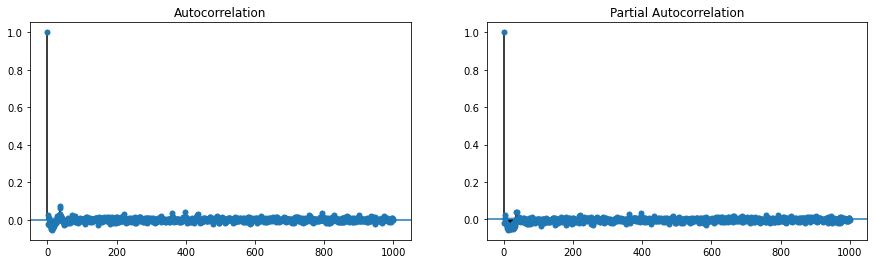

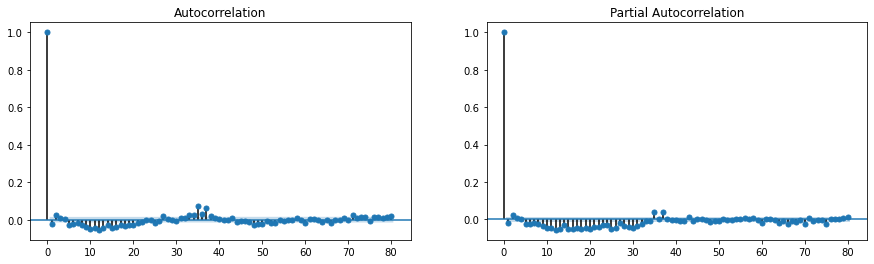

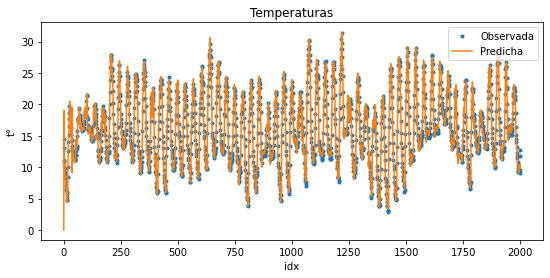

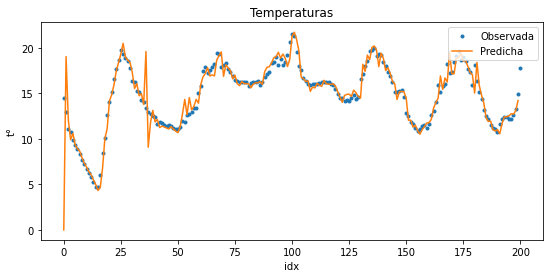

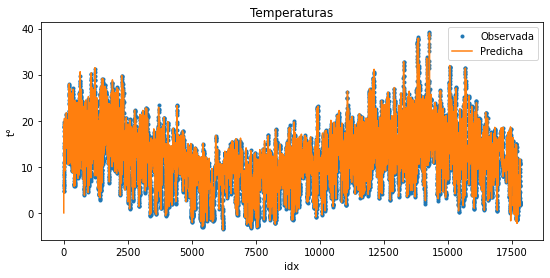

In [44]:
mysarima2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

In [ ]:
#Nos quedamos con:

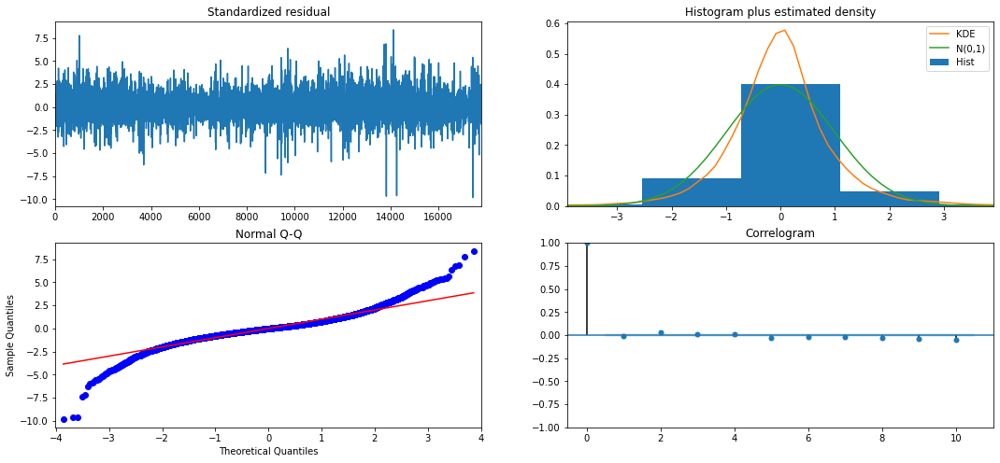

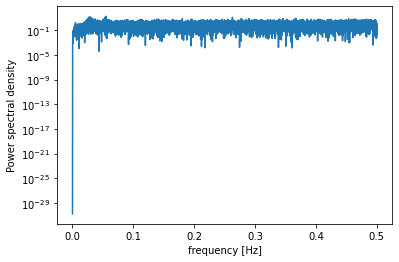

          freq        pow      delay
991   0.055537  17.888833  18.006054
494   0.027684  14.682728  36.121457
536   0.030038  12.482511  33.291045
949   0.053183  12.223907  18.802950
4689  0.262777  11.878394   3.805502
493   0.027628  10.293479  36.194726
497   0.027852   9.869273  35.903421
6548  0.366958   8.648918   2.725107
457   0.025611   8.517833  39.045952
4951  0.277460   8.185173   3.604120
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -18289.913
Date:                                 Tue, 17 Nov 2020   AIC                          36593.826
Time:                                         11:27:40   BIC                          36648.337
Sample:                                              0   HQIC                         36611.761
                 

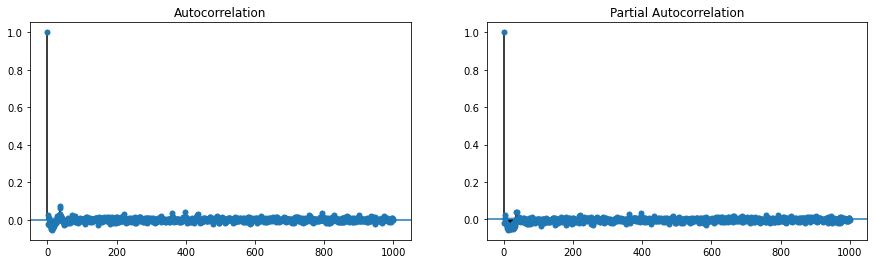

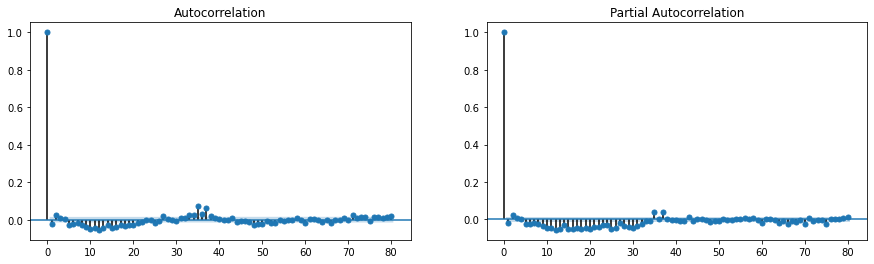

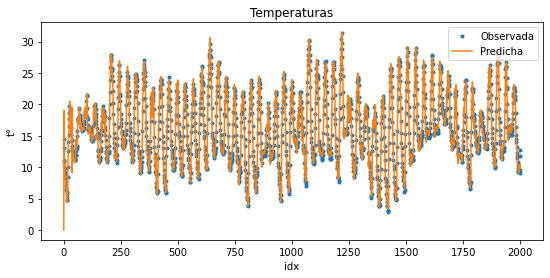

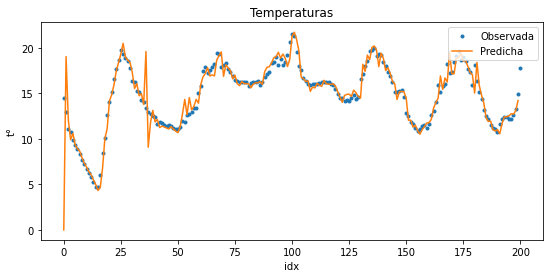

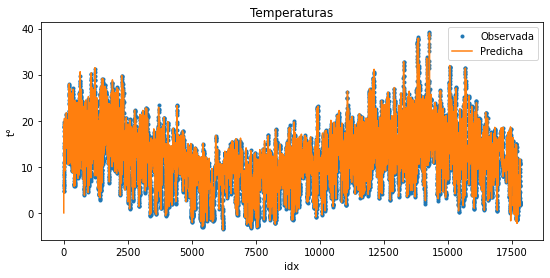

In [31]:
Res3=mysarima2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

In [ ]:
#Validamos

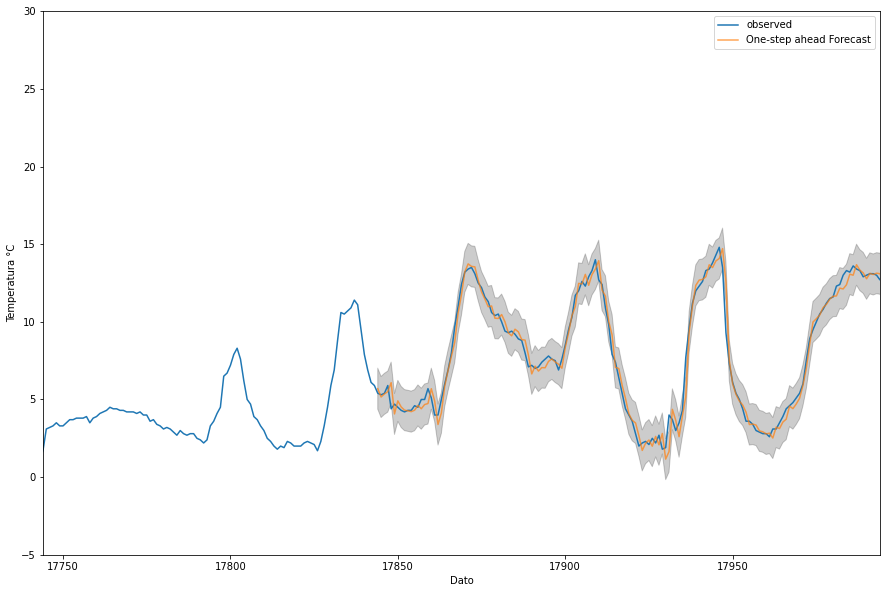

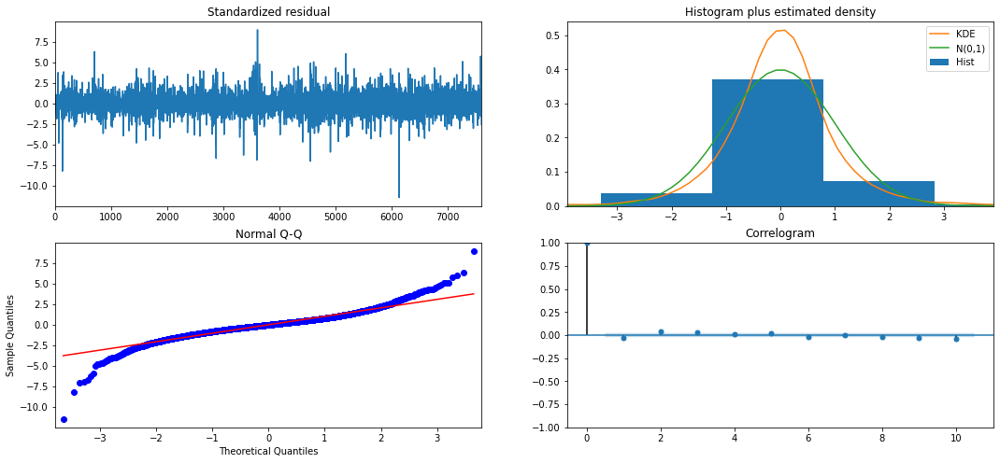

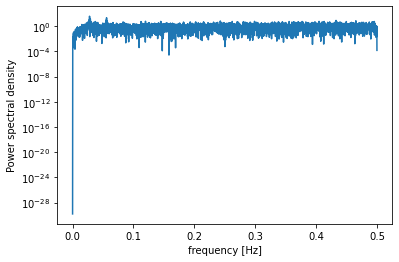

                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                 7648
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood               -8036.668
Date:                                 Tue, 17 Nov 2020   AIC                          16087.335
Time:                                         11:27:54   BIC                          16135.895
Sample:                                              0   HQIC                         16103.998
                                                - 7648                                         
Covariance Type:                                   opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept         -5.89e-06      0.000     -0.020      0.984  

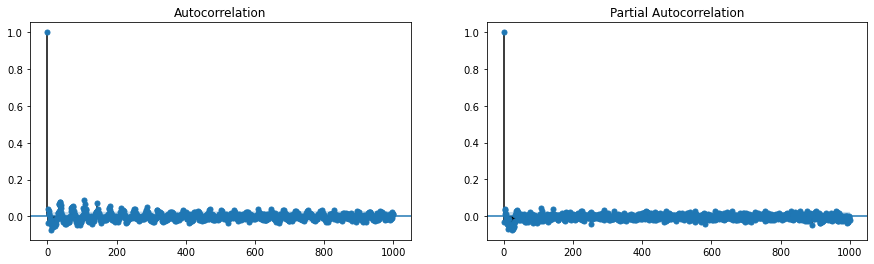

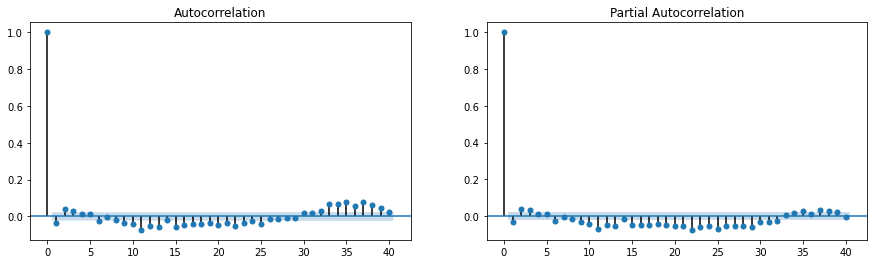

In [32]:
predecir_2(Res3,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17844   5.4 -0.296082        False        False        False
17845   5.3  0.141193        False        False        False
17846   5.4  0.038440        False        False        False
17847   5.9  0.393874        False        False        False
17848   4.4 -1.683990         True        False        False
...     ...       ...          ...          ...          ...
25487  23.4 -1.096016         True        False        False
25488  23.7  1.106901         True        False        False
25489  23.1 -0.057820        False        False        False
25490  20.4 -1.796427         True        False        False
25491  18.7  0.019954        False        False        False

[7648 rows x 5 columns]
Promedio Valor Absoluto Error: 0.4870338562639049
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    11.401674     1.778243     0.339958


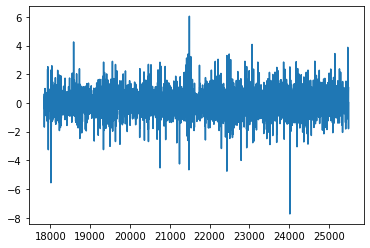

In [33]:
predecir_4(Res3,Y_Test,limite)

In [ ]:
#Más pruebas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


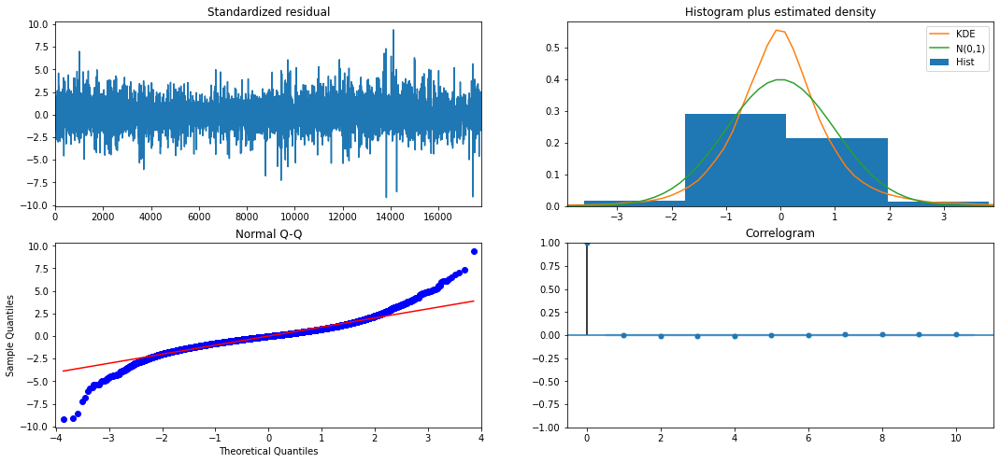

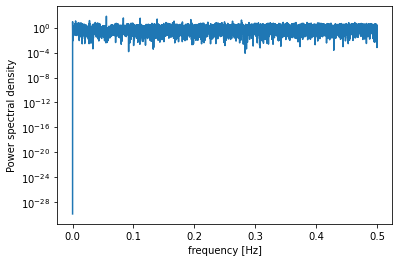

          freq        pow       delay
991   0.055537  67.306333   18.006054
1488  0.083389  35.546470   11.991935
1982  0.111074  32.587433    9.003027
1981  0.111018  31.045384    9.007572
2479  0.138926  23.772554    7.198064
3466  0.194239  19.495745    5.148298
2475  0.138702  18.066971    7.209697
4951  0.277460  16.384128    3.604120
496   0.027796  13.659222   35.975806
89    0.004988  11.861569  200.494382
                                       SARIMAX Results                                       
Dep. Variable:                                    ts   No. Observations:                17844
Model:             SARIMAX(36, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -18268.959
Date:                               Thu, 08 Oct 2020   AIC                          36615.919
Time:                                       17:03:56   BIC                          36919.625
Sample:                                            0   HQIC                         36715.844
                  

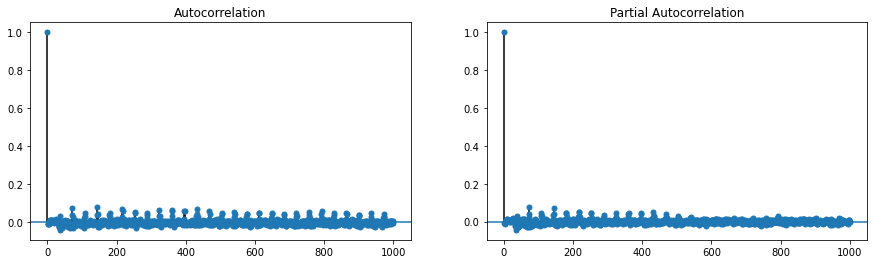

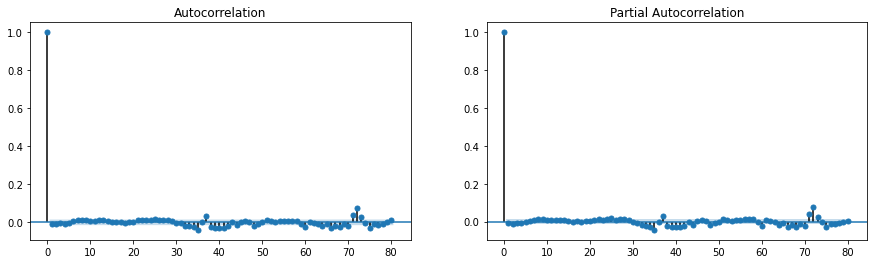

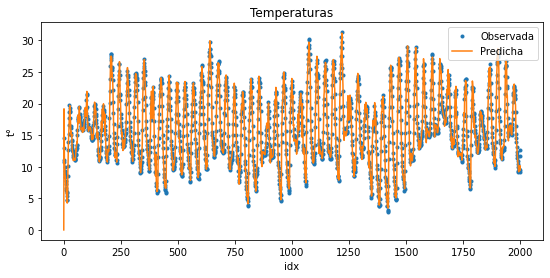

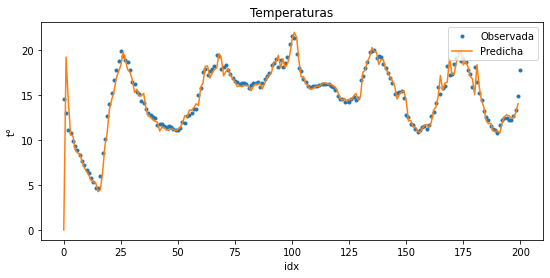

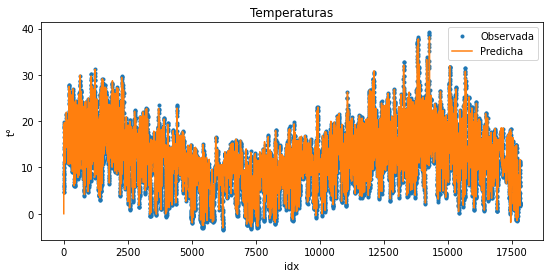

In [21]:
mysarima2(Y=Y_Ajuste,
         order=(60*24/Intervalo,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

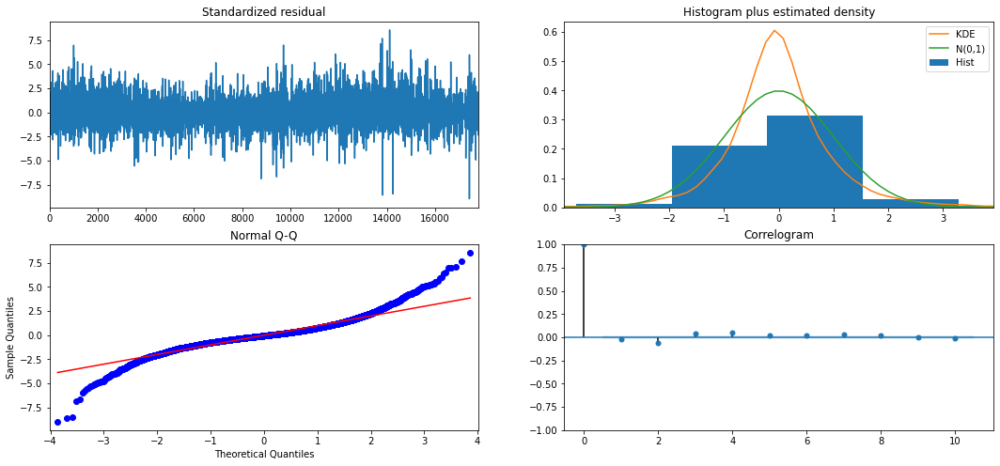

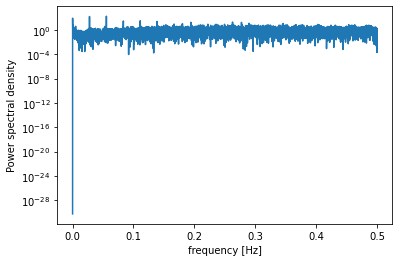

          freq         pow         delay
991   0.055537  185.490296     18.006054
496   0.027796  167.264633     35.975806
495   0.027740  132.799503     36.048485
1     0.000056   87.950451  17844.000000
497   0.027852   64.441671     35.903421
494   0.027684   61.210842     36.121457
1982  0.111074   33.313714      9.003027
1981  0.111018   31.794994      9.007572
2     0.000112   31.094593   8922.000000
1488  0.083389   30.894321     11.991935
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -19417.720
Date:                              Thu, 08 Oct 2020   AIC                          38847.440
Time:                                      17:36:55   BIC                          38894.164
Sample:                                           0   HQIC                         3

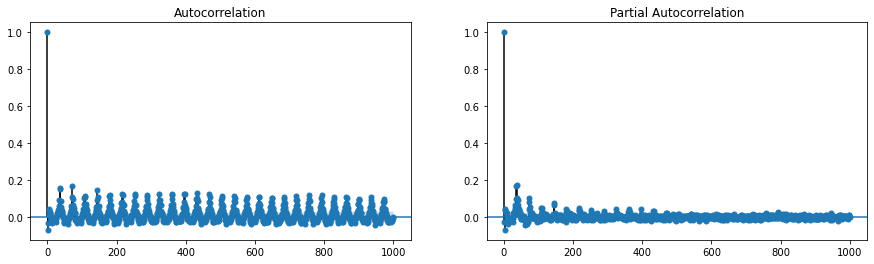

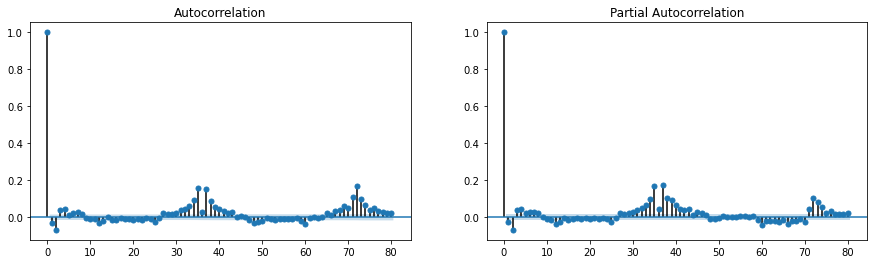

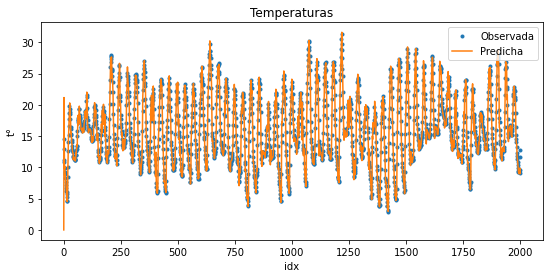

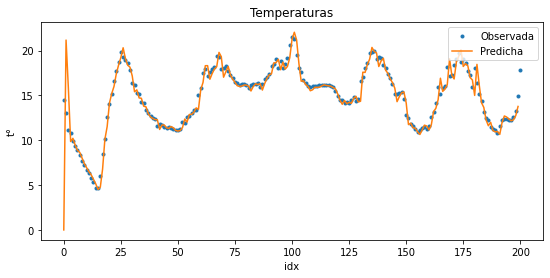

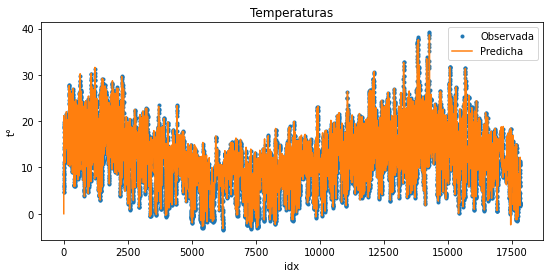

In [22]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

In [ ]:
#Estacionalidad 24h:

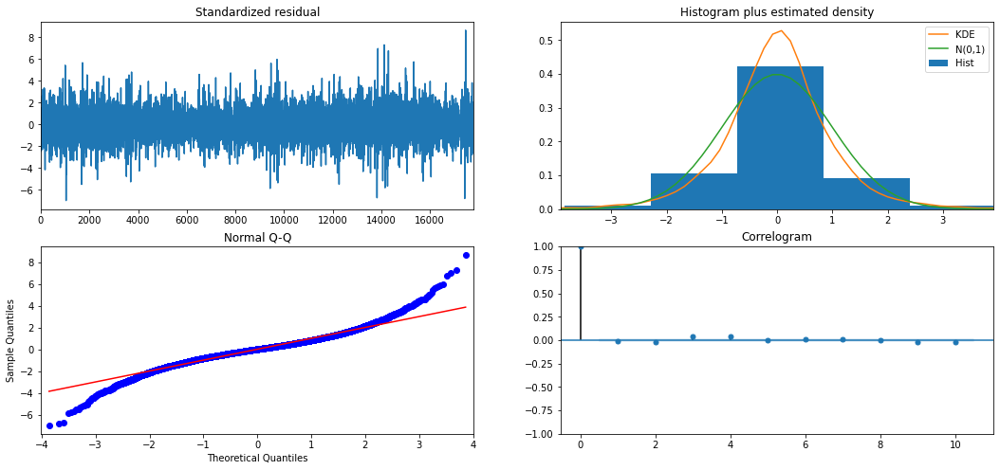

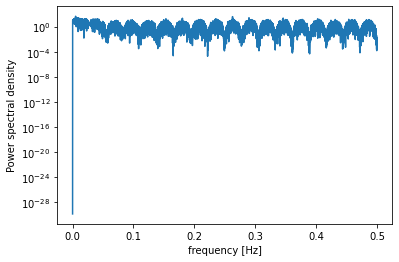

          freq        pow       delay
89    0.004988  47.978703  200.494382
4689  0.262777  41.825774    3.805502
159   0.008911  27.320518  112.226415
5171  0.289789  27.196639    3.450783
164   0.009191  25.875650  108.804878
6173  0.345943  24.350215    2.890653
97    0.005436  23.343601  183.958763
3220  0.180453  23.012535    5.541615
63    0.003531  22.693755  283.238095
106   0.005940  22.482298  168.339623
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(0, 1, 0, 36)   Log Likelihood              -22954.260
Date:                            Thu, 08 Oct 2020   AIC                          45918.520
Time:                                    17:39:49   BIC                          45957.457
Sample:                                         0   HQIC                         45931.331
                                    

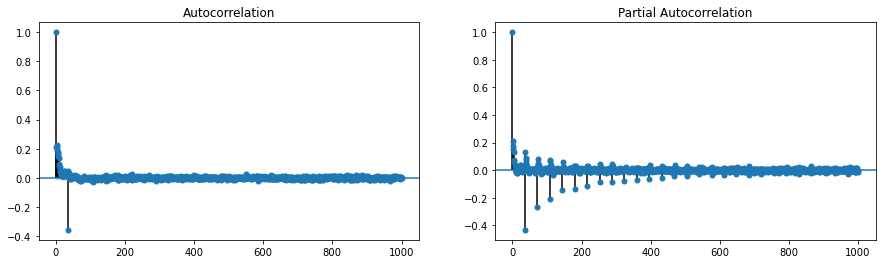

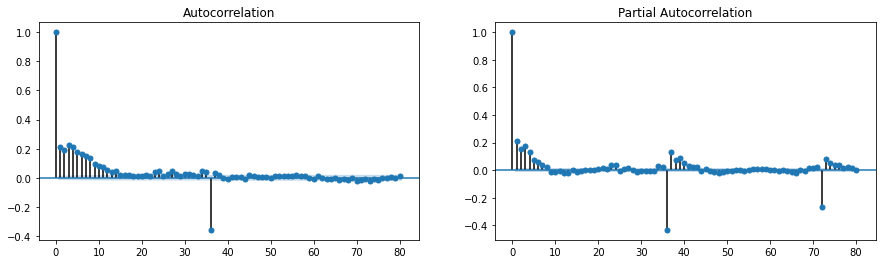

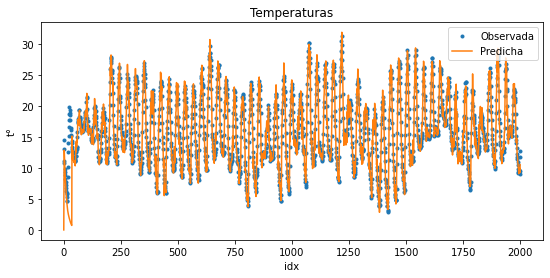

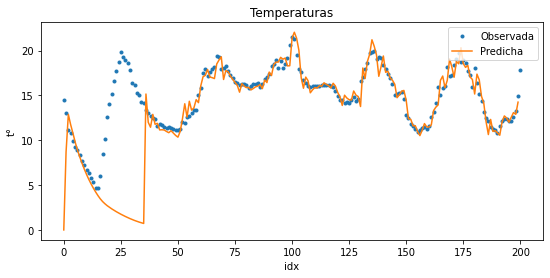

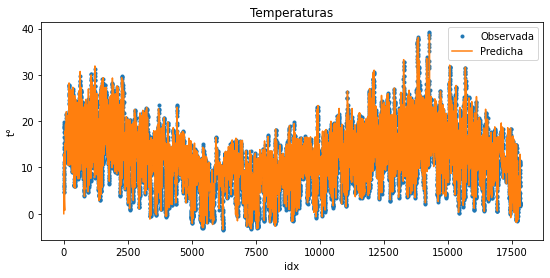

In [23]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(0,1,0,60*24/Intervalo))

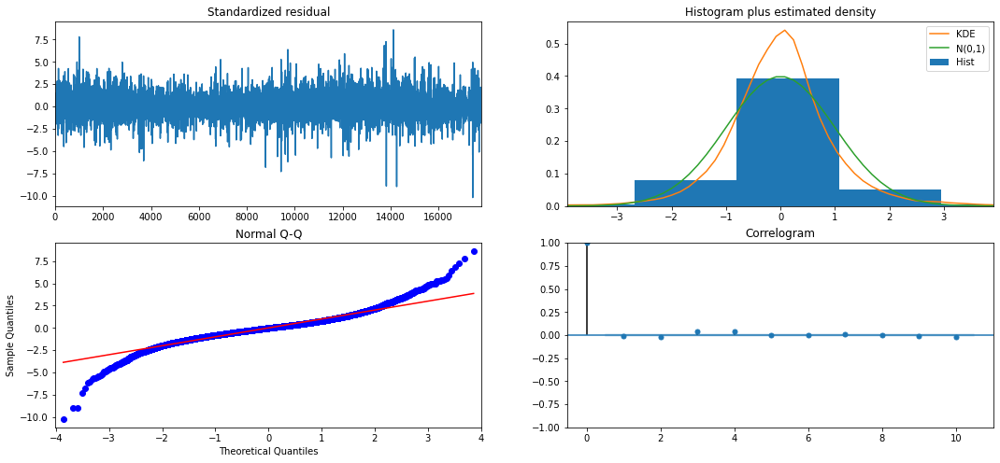

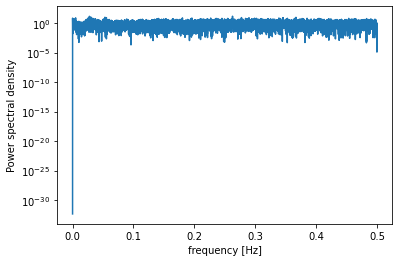

          freq        pow      delay
4689  0.262777  14.051000   3.805502
494   0.027684  13.682159  36.121457
536   0.030038  10.236894  33.291045
497   0.027852   9.578305  35.903421
949   0.053183   9.498835  18.802950
6548  0.366958   9.183547   2.725107
493   0.027628   9.160932  36.194726
496   0.027796   9.007946  35.975806
4951  0.277460   8.358281   3.604120
495   0.027740   8.235202  36.048485
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(1, 0, [1], 36)   Log Likelihood              -18011.619
Date:                              Thu, 08 Oct 2020   AIC                          36037.238
Time:                                      17:47:27   BIC                          36091.749
Sample:                                           0   HQIC                         36055.173
                                   

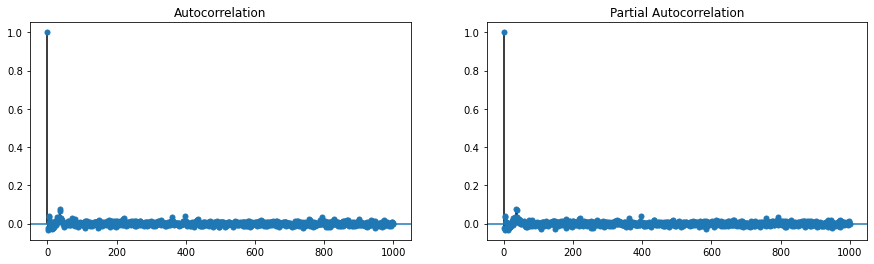

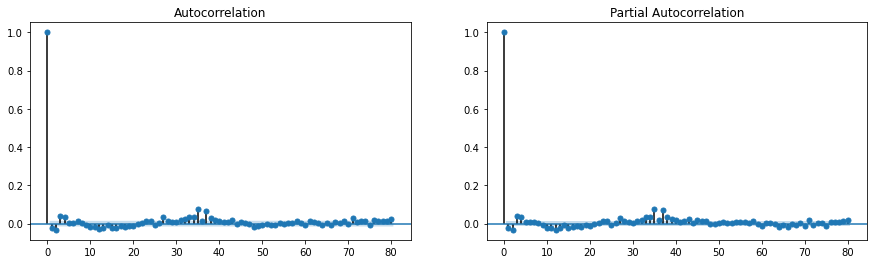

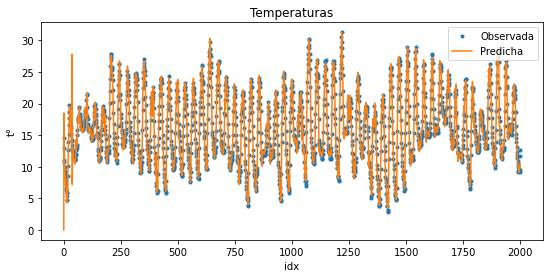

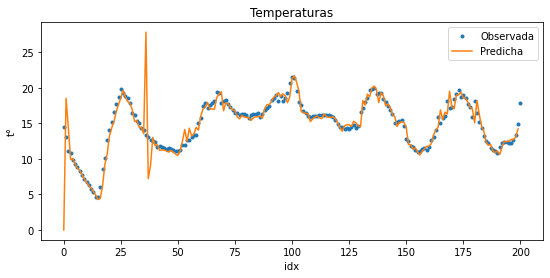

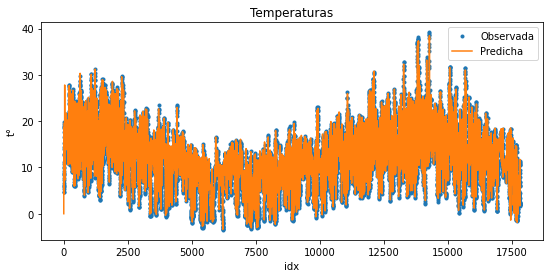

In [25]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(1,0,1,60*24/Intervalo))

In [ ]:
#Estacionalidad 12 h

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


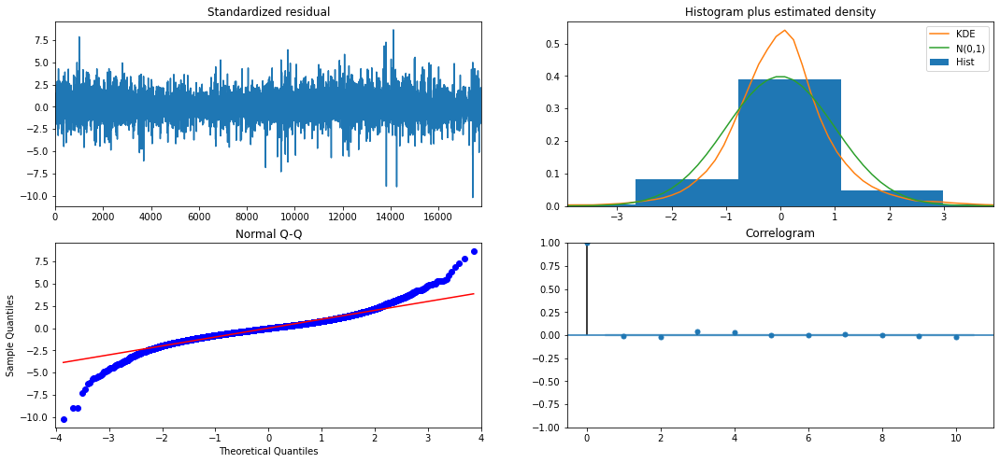

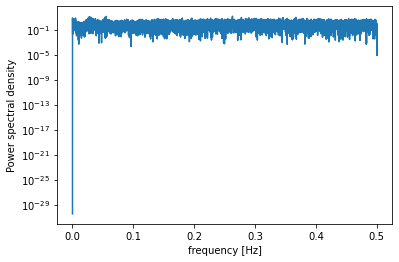

          freq        pow      delay
4689  0.262777  14.019134   3.805502
991   0.055537  13.095366  18.006054
494   0.027684  12.241070  36.121457
536   0.030038  10.315758  33.291045
949   0.053183   9.630922  18.802950
6548  0.366958   9.162631   2.725107
4951  0.277460   8.894158   3.604120
497   0.027852   8.488199  35.903421
493   0.027628   8.487451  36.194726
6173  0.345943   8.140943   2.890653
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -18007.691
Date:                                 Thu, 08 Oct 2020   AIC                          36033.381
Time:                                         17:58:21   BIC                          36103.467
Sample:                                              0   HQIC                         36056.441
                 

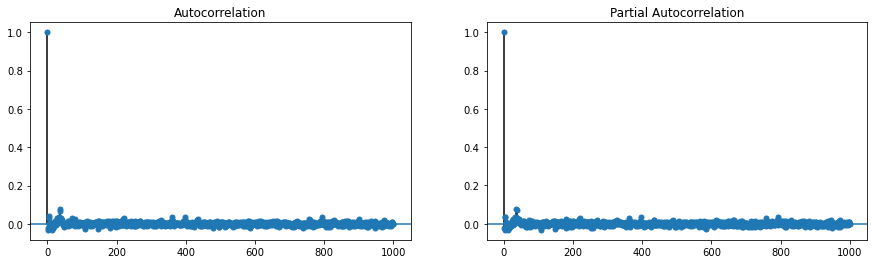

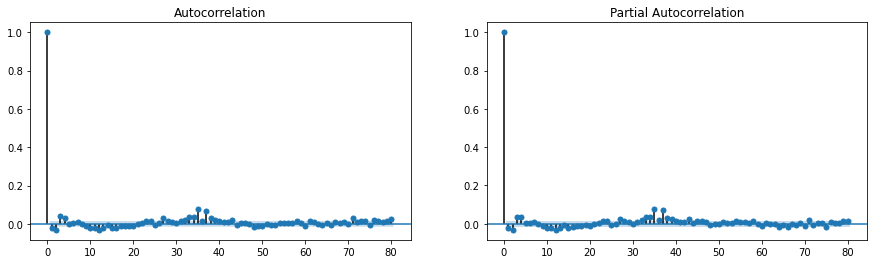

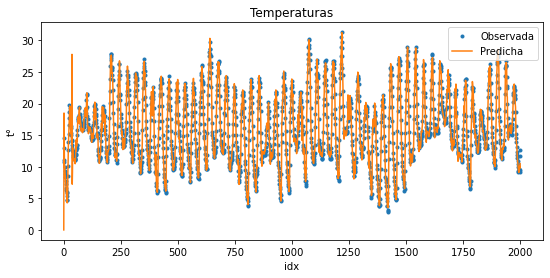

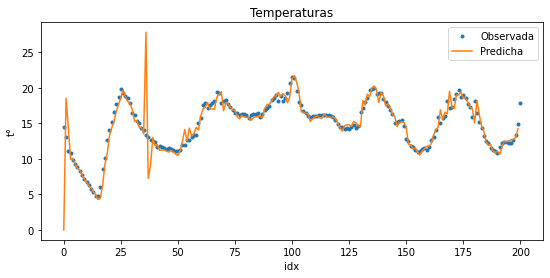

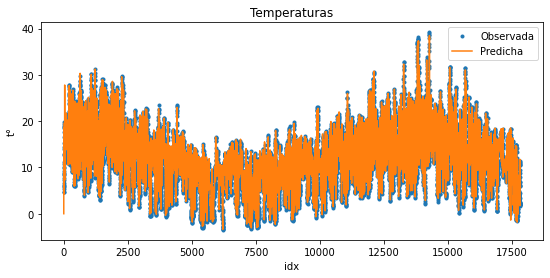

In [26]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(2,0,2,60*12/Intervalo))

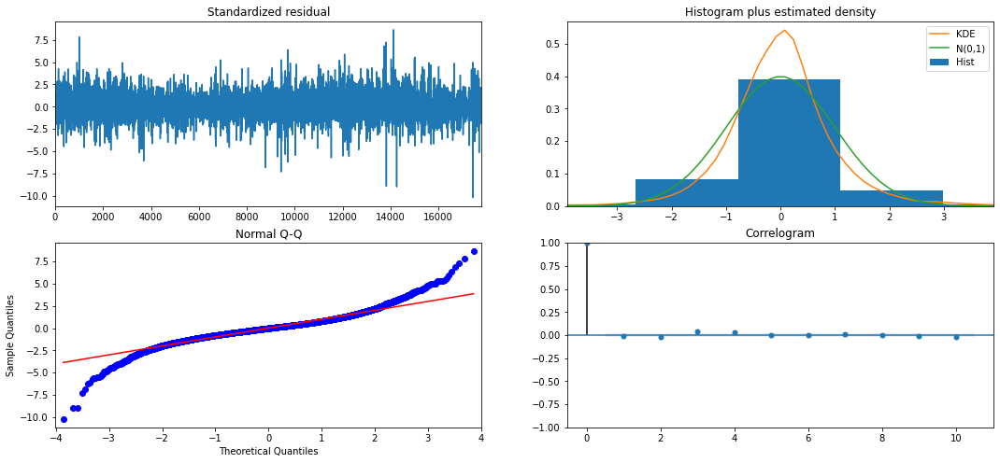

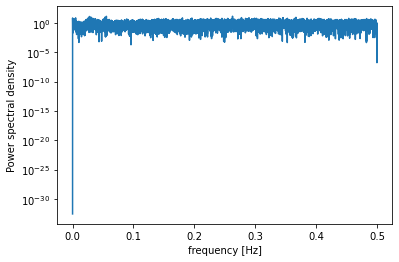

          freq        pow      delay
4689  0.262777  14.040296   3.805502
991   0.055537  13.706399  18.006054
494   0.027684  12.789175  36.121457
536   0.030038  10.276987  33.291045
949   0.053183   9.554535  18.802950
6548  0.366958   9.178970   2.725107
493   0.027628   8.894055  36.194726
497   0.027852   8.836218  35.903421
4951  0.277460   8.271007   3.604120
6173  0.345943   8.152117   2.890653
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -18008.237
Date:                                 Thu, 08 Oct 2020   AIC                          36032.474
Time:                                         18:10:07   BIC                          36094.772
Sample:                                              0   HQIC                         36052.972
                 

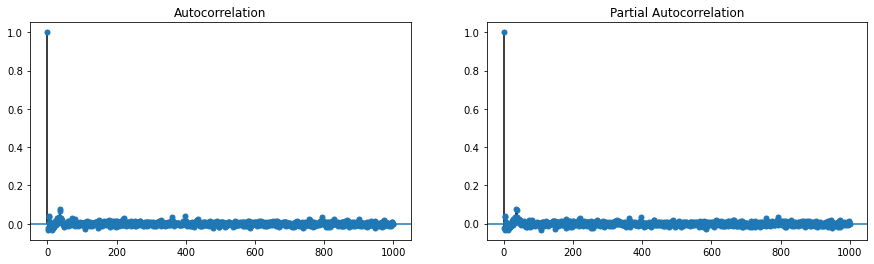

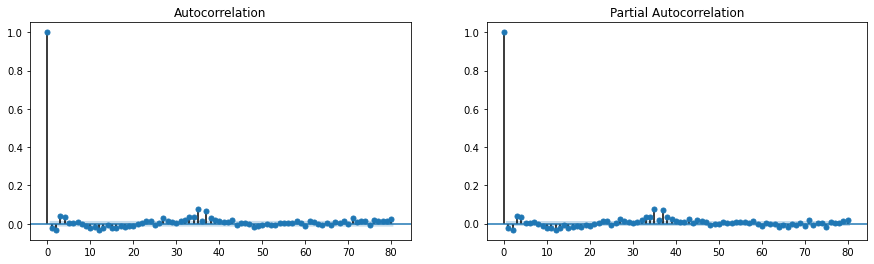

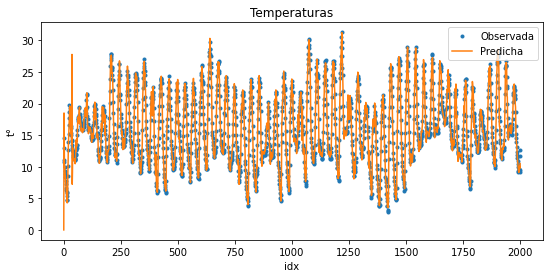

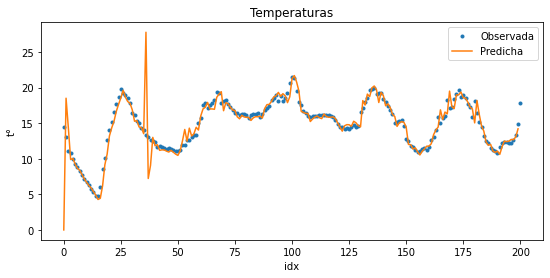

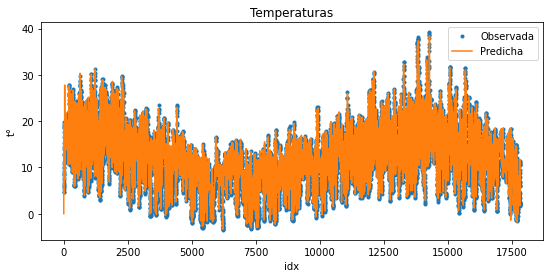

In [27]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


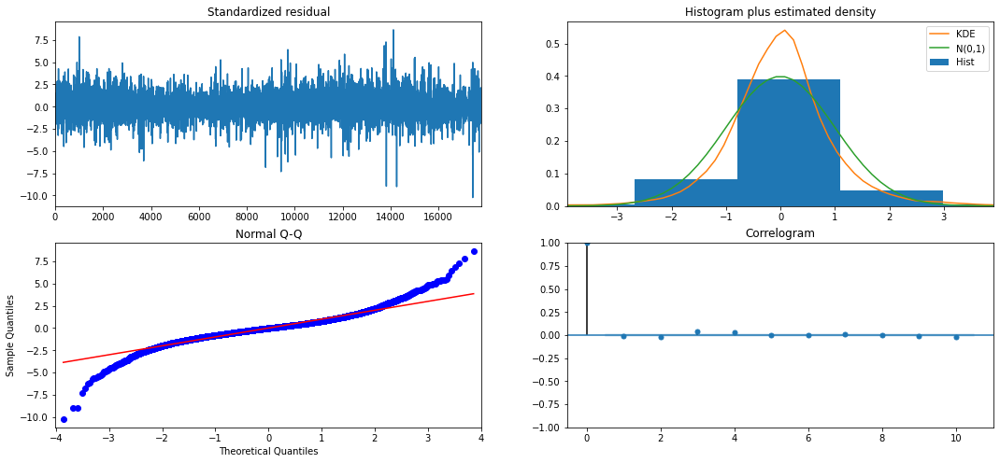

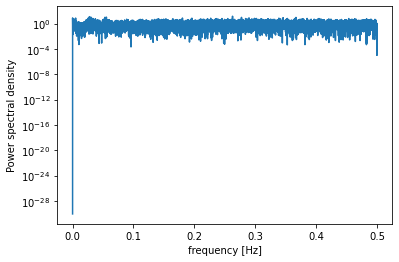

          freq        pow      delay
4689  0.262777  14.030354   3.805502
494   0.027684  12.155588  36.121457
536   0.030038  10.288018  33.291045
991   0.055537  10.182950  18.006054
949   0.053183   9.630412  18.802950
4951  0.277460   9.301349   3.604120
6548  0.366958   9.163185   2.725107
497   0.027852   8.550617  35.903421
493   0.027628   8.199790  36.194726
6173  0.345943   8.144872   2.890653
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -18008.851
Date:                                 Thu, 08 Oct 2020   AIC                          36033.701
Time:                                         18:20:12   BIC                          36095.999
Sample:                                              0   HQIC                         36054.199
                 

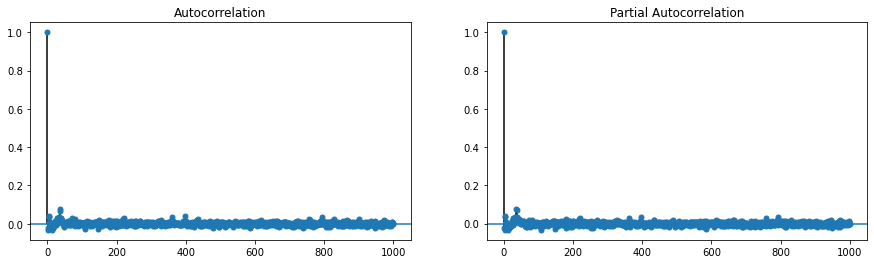

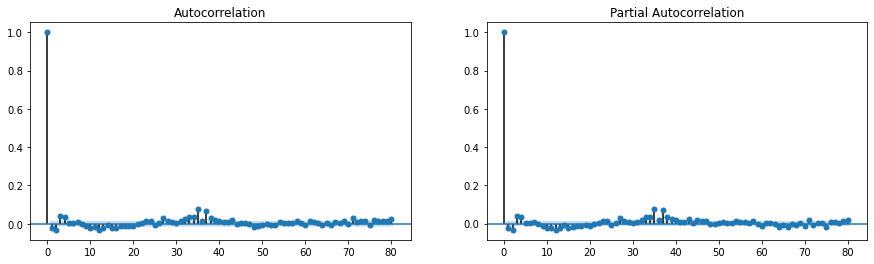

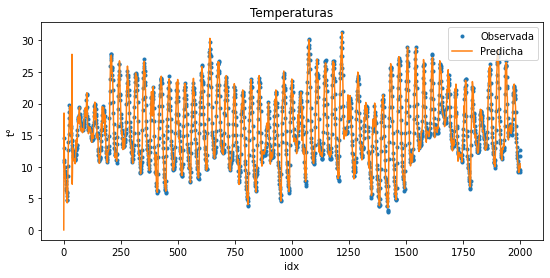

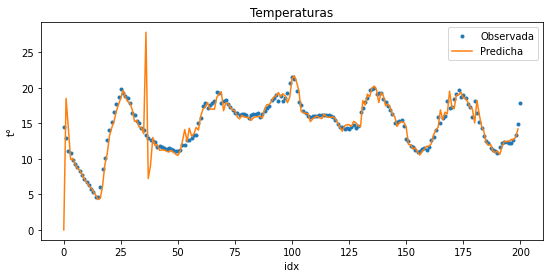

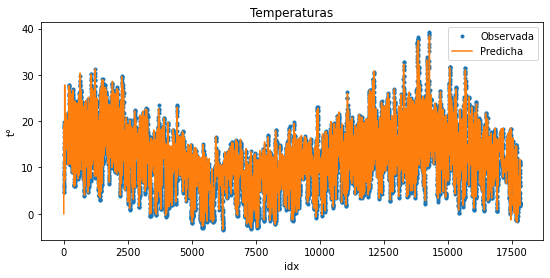

In [28]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ar.S.L18':0})

In [ ]:
#Nos quedamos con:

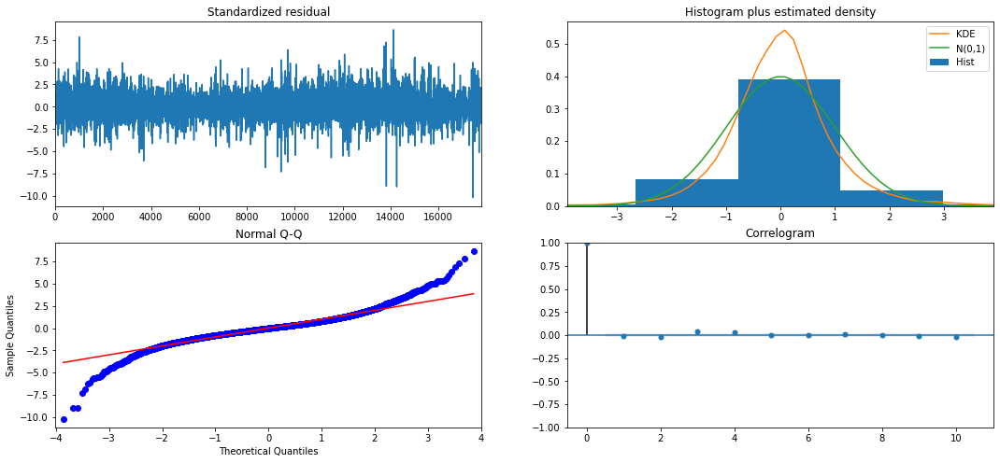

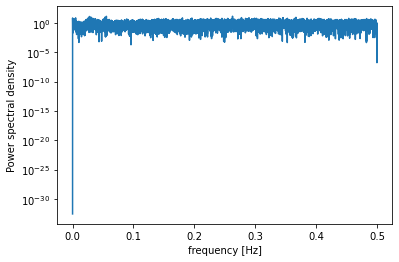

          freq        pow      delay
4689  0.262777  14.040296   3.805502
991   0.055537  13.706399  18.006054
494   0.027684  12.789175  36.121457
536   0.030038  10.276987  33.291045
949   0.053183   9.554535  18.802950
6548  0.366958   9.178970   2.725107
493   0.027628   8.894055  36.194726
497   0.027852   8.836218  35.903421
4951  0.277460   8.271007   3.604120
6173  0.345943   8.152117   2.890653
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17844
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -18008.237
Date:                                 Tue, 17 Nov 2020   AIC                          36032.474
Time:                                         11:37:23   BIC                          36094.772
Sample:                                              0   HQIC                         36052.972
                 

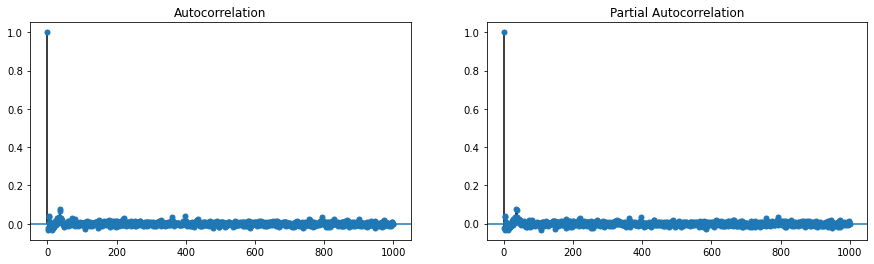

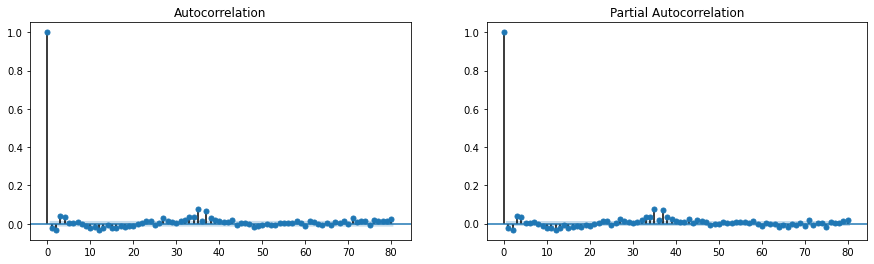

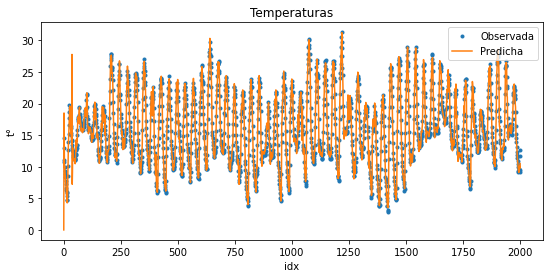

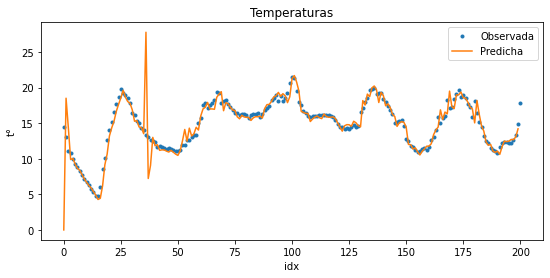

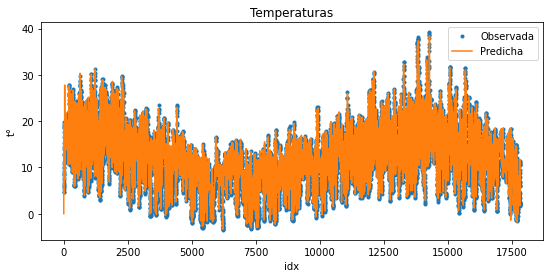

In [34]:
Res4=mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

In [35]:
#Validamos

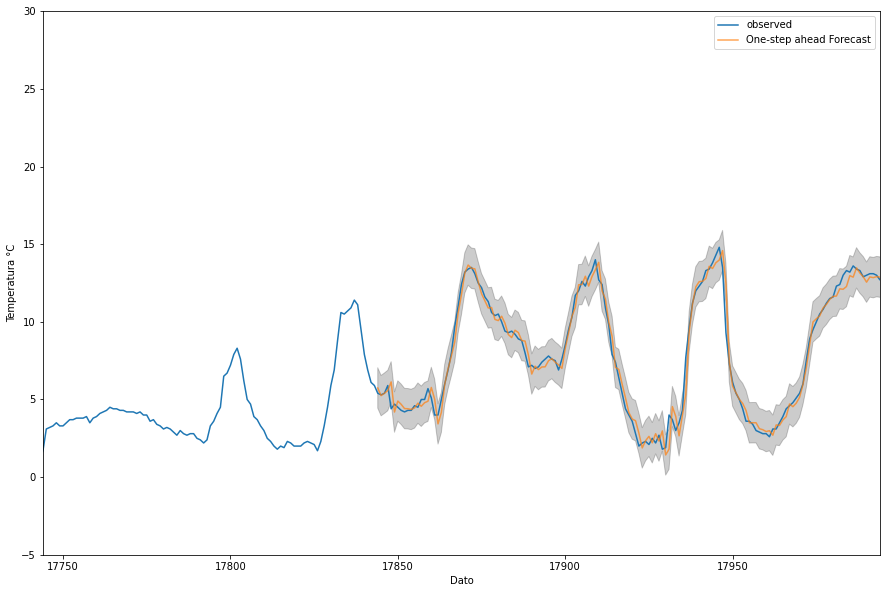

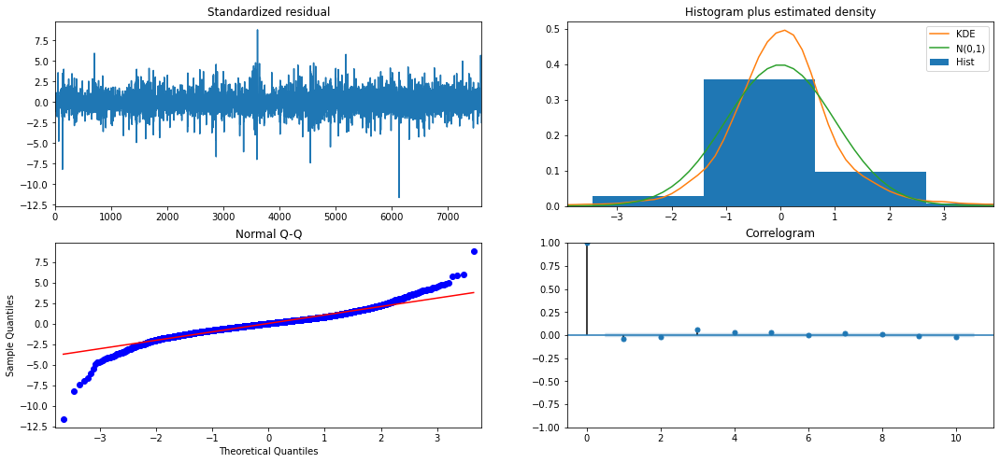

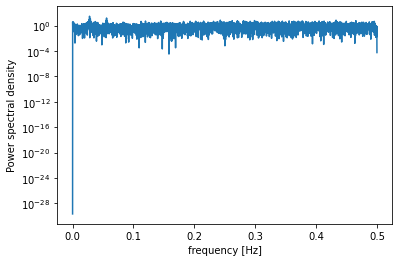

                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                 7648
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2], 18)   Log Likelihood               -7895.587
Date:                                 Tue, 17 Nov 2020   AIC                          15807.173
Time:                                         11:37:37   BIC                          15862.670
Sample:                                              0   HQIC                         15826.216
                                                - 7648                                         
Covariance Type:                                   opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            0.0043      0.001      4.600      0.000  

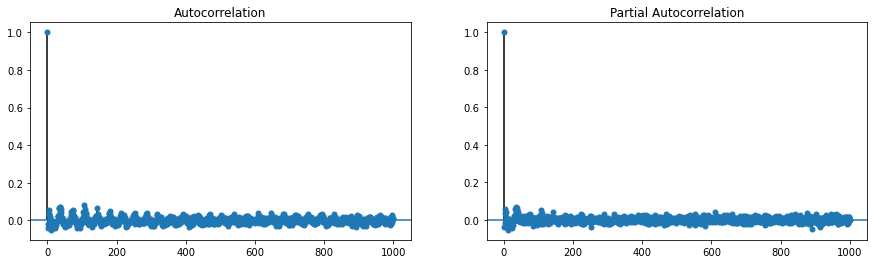

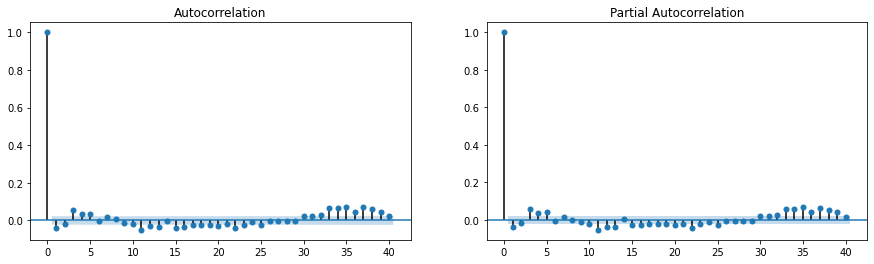

In [36]:
predecir_2(Res4,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17844   5.4 -0.343466        False        False        False
17845   5.3  0.052396        False        False        False
17846   5.4 -0.003559        False        False        False
17847   5.9  0.323362        False        False        False
17848   4.4 -1.732163         True        False        False
...     ...       ...          ...          ...          ...
25487  23.4 -0.877660        False        False        False
25488  23.7  1.194759         True        False        False
25489  23.1  0.177056        False        False        False
25490  20.4 -1.709886         True        False        False
25491  18.7  0.130026        False        False        False

[7648 rows x 5 columns]
Promedio Valor Absoluto Error: 0.4838088187931314
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    11.297071      1.67364     0.261506


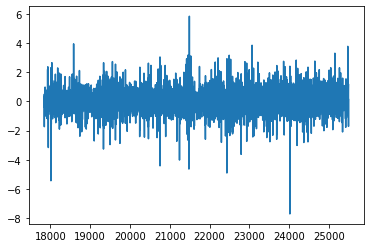

In [37]:
predecir_4(Res4,Y_Test,limite)